# Cluster Analysis of M66

In [1]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)
# pd.set_option('display.max_rows', None) # uncomment to see all the rows in a dataframe

import matplotlib.pyplot as plt
from matplotlib import rc
rc('text', usetex=True)
font = {'family' : 'serif',
        'weight' : 'bold',
        'size'   : '14'}
rc('font', **font)

from astropy.io import fits
from astropy.coordinates import FK5, SkyCoord
import astropy.units as u

from XRBID.DataFrameMod import (Find, FindUnique)
from XRBID.CMDs import FitSED
from XRBID.WriteScript import WriteReg
from XRBID.Sources import Crossref, GetDaoPhots

import os, sys
sys.path.insert(0, '/Users/undergradstudent/Research/XRB-Analysis/Notebooks')
from helpers.analysis import remove_unnamed, find_parent_cluster
from helpers.analysis import (calculate_distance, calculate_velocity)

import seaborn as sns

# define directories to handle data in
cd = os.chdir
hstdir = "/Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/HST/"
chandra_hst_dir = "/Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-HST/"
chandra_jwst_dir = "/Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-JWST/"
jwstdir = "/Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/JWST/"
M66_dir = "/Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/"

# jwst directories
f200w = jwstdir+"hlsp_phangs-jwst_jwst_nircam_ngc3627_f200w_v1p1_img.fits"
f300m = jwstdir+"hlsp_phangs-jwst_jwst_nircam_ngc3627_f300m_v1p1_img.fits"
f335m = jwstdir+"hlsp_phangs-jwst_jwst_nircam_ngc3627_f335m_v1p1_img.fits"
f360m = jwstdir+"hlsp_phangs-jwst_jwst_nircam_ngc3627_f360m_v1p1_img.fits"

# hst directories
f275w = hstdir+"M66_mosaic_uvis_f275w_drc_sci.fits"
f336w = hstdir+"M66_mosaic_uvis_f336w_drc_sci.fits"
f438w = hstdir+"M66_mosaic_uvis_f438w_drc_sci.fits"
f555w = hstdir+"M66_mosaic_uvis_f555w_drc_sci.fits"
f814w = hstdir+"M66_mosaic_uvis_f814w_drc_sci.fits"


# Notes

I reran this code without the F336W filter and the results in the distance and velocity plots look pretty similar, except for those two sources which had earlier been the root of the problem are now gone. However, a new source 2CXO J112019.5+125958-9.0-1.0 has come into the picture and is causing the problem

# SED fitting on best stars

In [2]:
M66_notes = remove_unnamed(pd.read_csv(M66_dir+'M66_XRB_notes.csv'))
M66_daoclean = remove_unnamed(pd.read_csv(M66_dir+'XRB-ejection/M66_hst_jwst_xrbs_photometry.csv'))
M66_daoclean = M66_daoclean.drop(columns='Class')

# Check results using some other stars
# M66_notes.iloc[45, 3] = 9
# M66_notes.iloc[45, 4] = 1

In [3]:
# Add the XRB Class to the df
M66_xrbs = M66_notes[['CSC ID', 'ID', 'Class', 'JWST ID', 'HST ID']].merge(M66_daoclean, on=['CSC ID', 'JWST ID', 'HST ID'], how='left')
M66_xrbs = M66_xrbs.drop(columns='Auxiliary ID')

# Create a new ID for easy best fit identification
M66_xrbs['Auxiliary ID'] = M66_xrbs['CSC ID'] + '-' + M66_xrbs['JWST ID'].astype(str) + '-' + M66_xrbs['HST ID'].astype(str)

# Only use the XRBs, not clusters
M66_xrbs = M66_xrbs.query('`Class` == ["HMXB", "LMXB", "IMXB"]').reset_index(drop=True)
M66_xrbs

,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F336W,F336W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID
0,2CXO J112014.9+125933,CXO003,HMXB,3.0,2.0,170.062307,12.992623,194908.0,45185.0,NaN,NaN,3105.251503,5907.752641,3743.843919,5833.507868,19247.0,130956.0,NaN,36055.0,NaN,170.062292,12.992626,-12.159049,-0.904646,-13.902257,-0.287522,NaN,NaN,NaN,NaN,-2.974469,-1.372681,NaN,NaN,-7.711479,-0.896442,-8.481385,-0.973168,NaN,NaN,2CXO J112014.9+125933-3.0-2.0
1,2CXO J112015.3+125932,CXO005,LMXB,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2CXO J112015.3+125932-nan-nan
2,2CXO J112015.0+125936,CXO006,HMXB,2.0,1.0,170.062808,12.993437,200852.0,46417.0,42593.0,48557.0,3048.131145,6003.004427,3700.317585,5908.701948,19792.0,NaN,NaN,36916.0,NaN,170.062784,12.993454,NaN,184.978557,-11.584072,-1.756274,-12.044657,-1.388903,-12.183175,-1.228733,NaN,NaN,NaN,NaN,NaN,1.142291,NaN,1.536468,NaN,NaN,2CXO J112015.0+125936-2.0-1.0
3,2CXO J112015.0+125921,CXO007,HMXB,7.0,1.0,170.062475,12.989191,169350.0,39698.0,36199.0,41583.0,3086.128147,5505.907098,3727.624318,5519.646556,16435.0,NaN,NaN,NaN,NaN,170.062475,12.989172,NaN,13.846357,-10.932239,-2.894194,-11.094335,-2.970991,-11.154931,-2.804088,NaN,NaN,NaN,NaN,NaN,NaN,-6.695964,-2.693151,NaN,NaN,2CXO J112015.0+125921-7.0-1.0
4,2CXO J112015.2+125921,CXO008,HMXB,7.0,3.0,170.063489,12.989460,171191.0,NaN,NaN,NaN,2970.358329,5537.339696,3640.754910,5546.285666,16686.0,NaN,NaN,NaN,NaN,170.063456,12.989465,-10.401179,-2.258856,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-6.551823,-3.289136,NaN,NaN,2CXO J112015.2+125921-7.0-3.0
5,2CXO J112014.7+125937,CXO009,HMXB,7.0,1.0,170.061275,12.993558,201863.0,NaN,NaN,NaN,3222.967034,6017.205864,3834.343555,5918.287693,19852.0,NaN,NaN,37022.0,NaN,170.061270,12.993559,-9.975986,-3.230107,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-4.744178,-7.880962,-6.233019,-4.222578,NaN,NaN,2CXO J112014.7+125937-7.0-1.0
6,2CXO J112015.0+125938,CXO010,HMXB,6.0,1.0,170.062865,12.993964,204900.0,NaN,NaN,NaN,3041.554415,6064.707748,3694.780748,5952.563551,20110.0,134991.0,NaN,NaN,NaN,170.062846,12.993936,-9.586088,-4.277069,NaN,NaN,NaN,NaN,NaN,NaN,-5.450522,-0.102546,NaN,NaN,NaN,NaN,-5.292991,-6.290347,NaN,NaN,2CXO J112015.0+125938-6.0-1.0
7,2CXO J112014.2+125927,CXO011,LMXB,3.0,NaN,170.059328,12.990910,182257.0,42409.0,38745.0,44337.0,3445.041678,5707.156183,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-10.365068,-0.780651,-9.906455,-2.639223,-10.491327,-1.836659,-10.608536,-1.645945,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2CXO J112014.2+125927-3.0-nan
8,2CXO J112014.1+125923,CXO012,LMXB,3.0,NaN,170.058784,12.989716,173327.0,40534.0,36971.0,42428.0,3507.120121,5567.361186,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-9.280691,-1.462720,-8.043054,-10.280138,-8.293276,-9.718285,-7.756413,-15.829940,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2CXO J112014.1+125923-3.0-nan
9,2CXO J112014.3+125918,CXO013,LMXB,4.0,NaN,170.059730,12.988352,163096.0,38416.0,34983.0,NaN,3399.258592,5407.640929,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-8.930437,-2.478914,-10.142517,-1.846408,-10.349826,-1.832567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2CXO J112014.3+125918-4.0-nan


In [4]:
# Remove F336W filter to crosscheck results
M66_xrbs = M66_xrbs.drop(columns=['F336W', 'F336W Err'])

Finding best-fit model(s)...
DONE


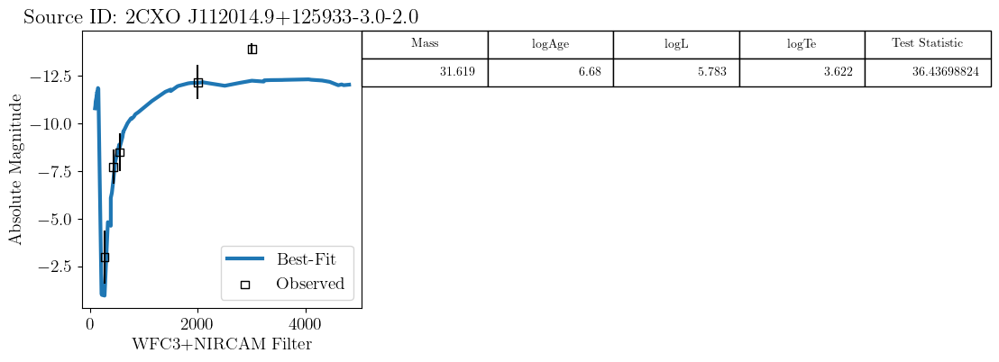

No best-fit model available for Source ID 2CXO J112015.3+125932-nan-nan.


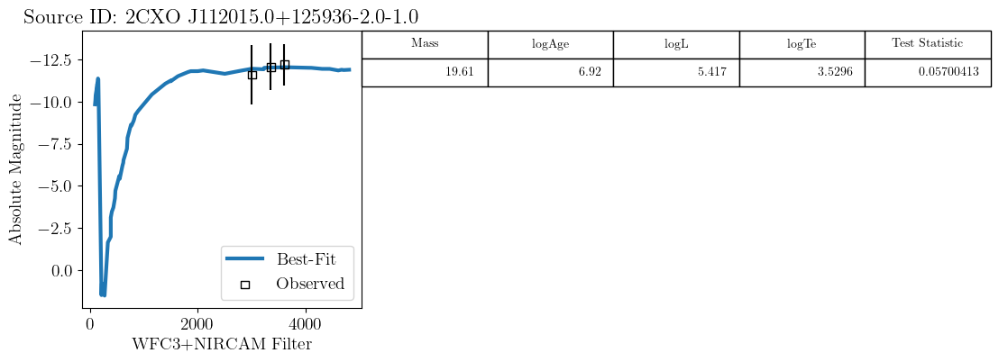

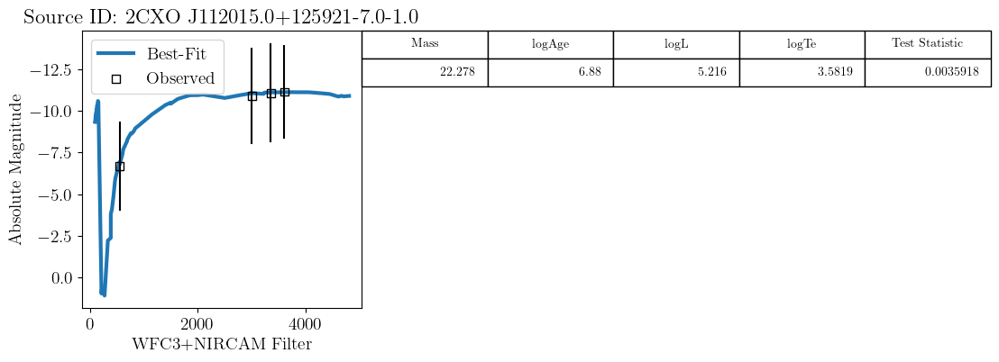

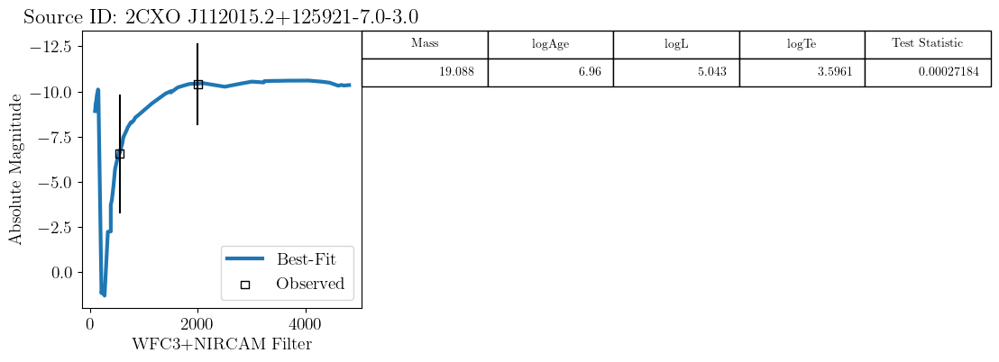

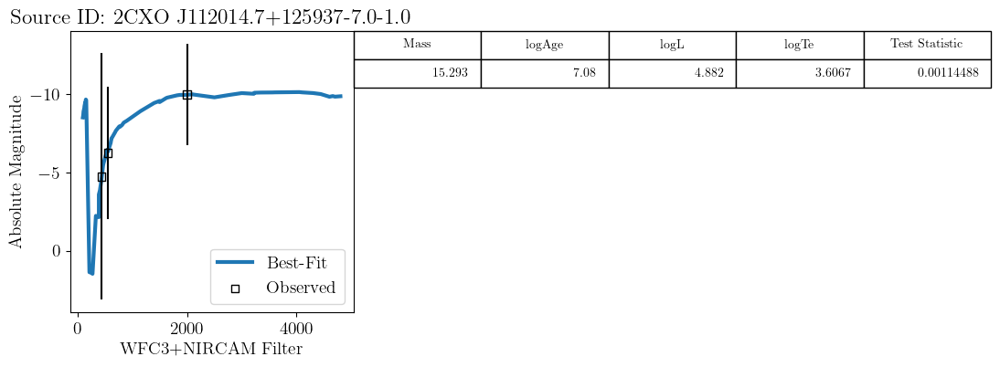

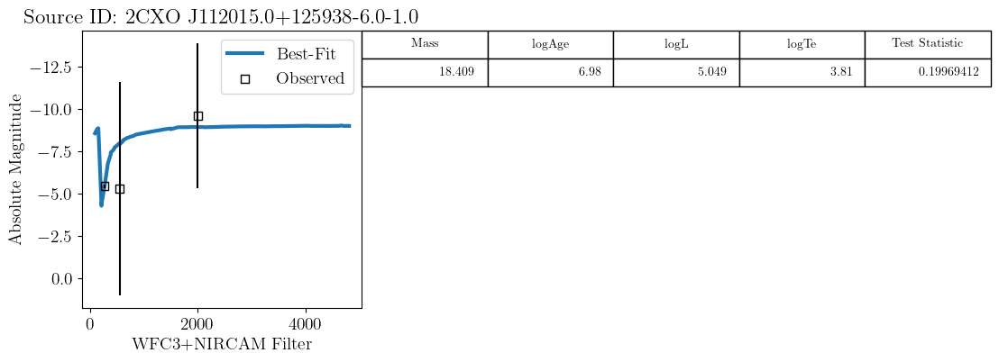

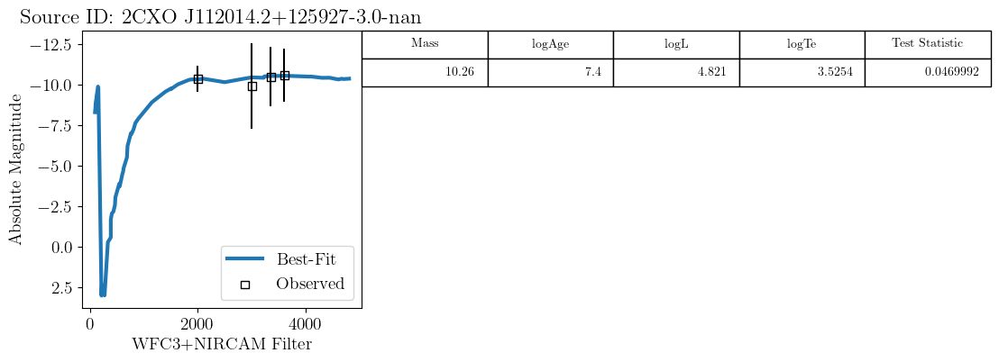

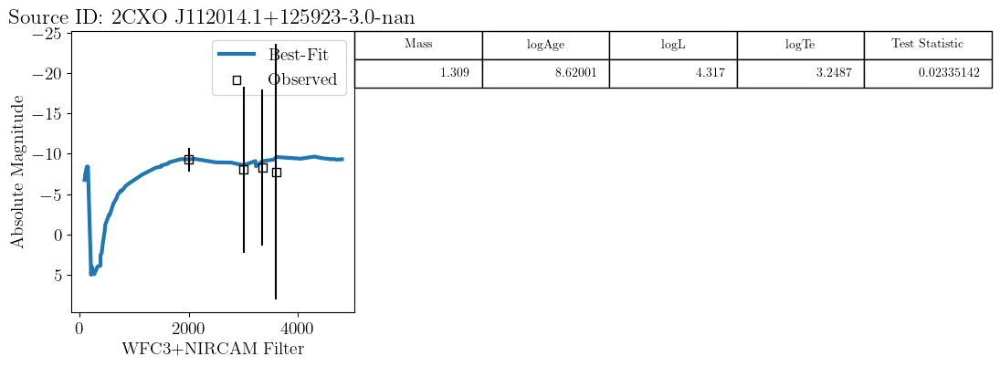

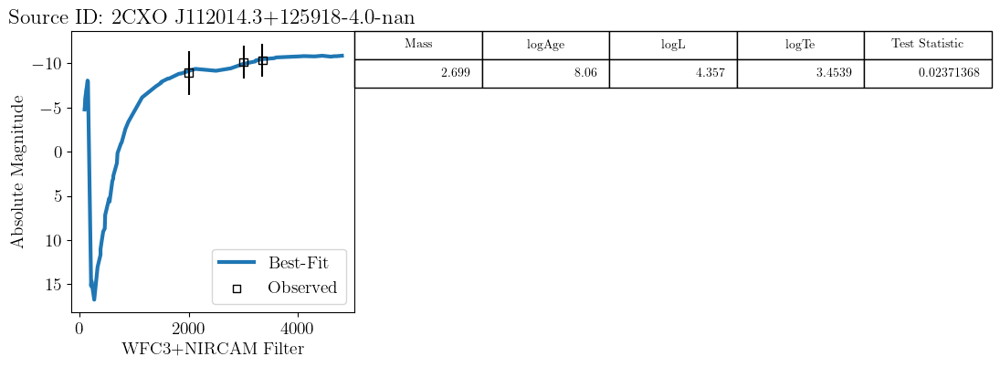

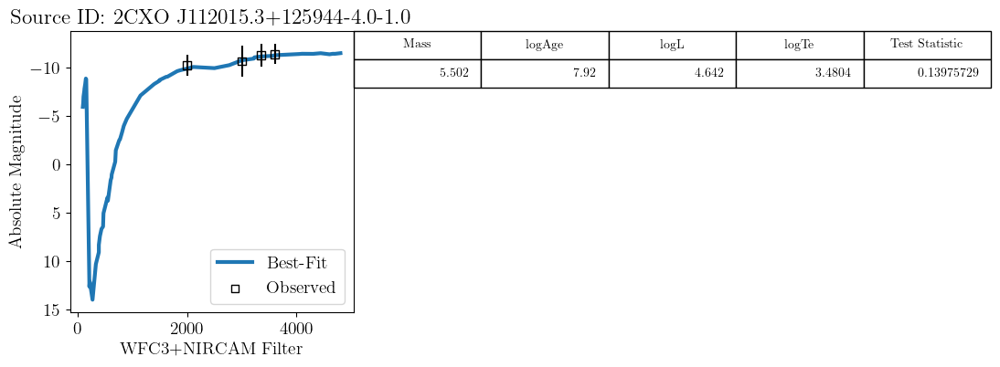

No best-fit model available for Source ID 2CXO J112014.5+125946-nan-nan.


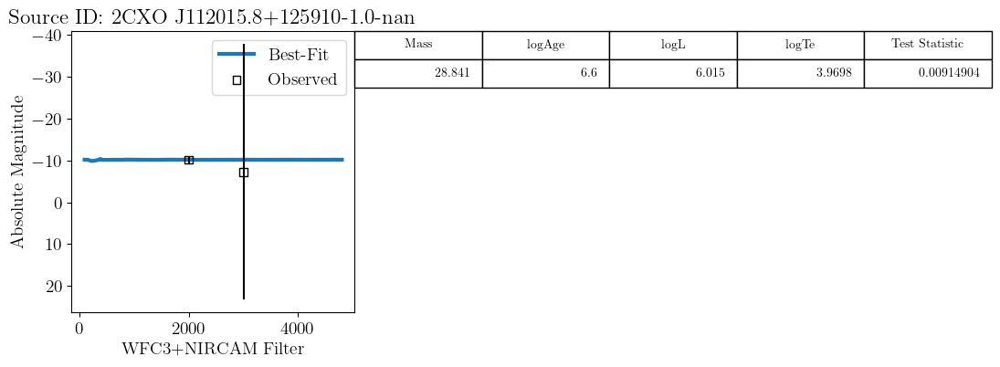

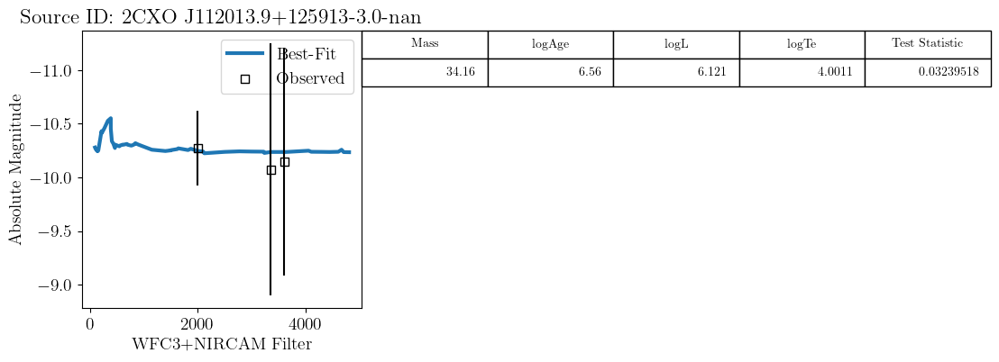

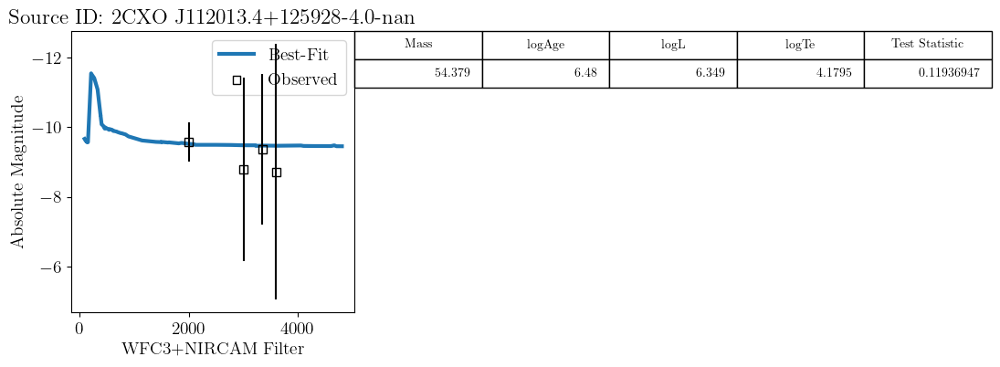

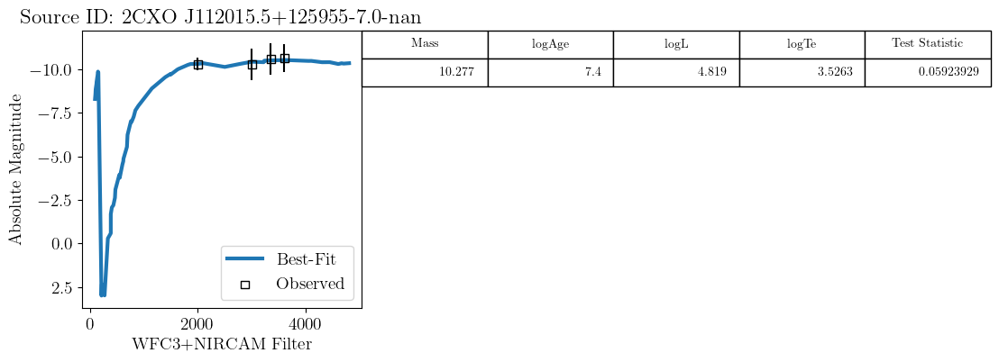

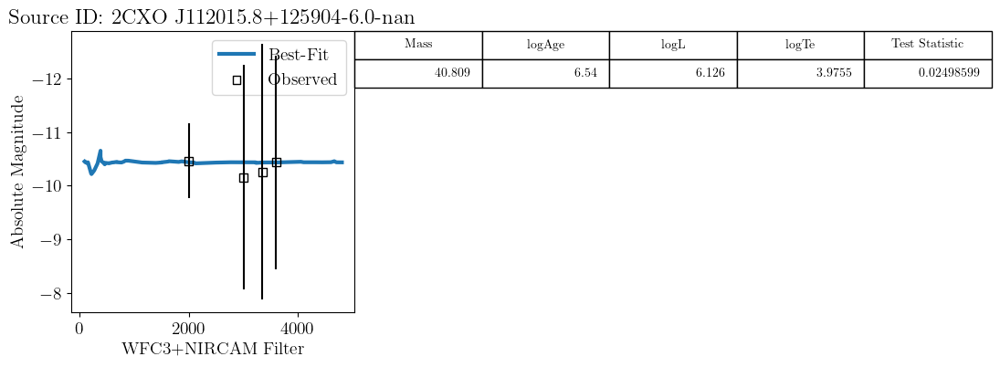

...

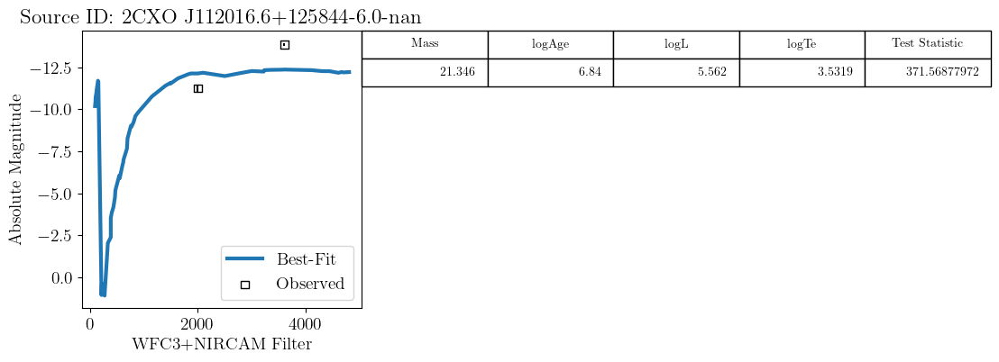

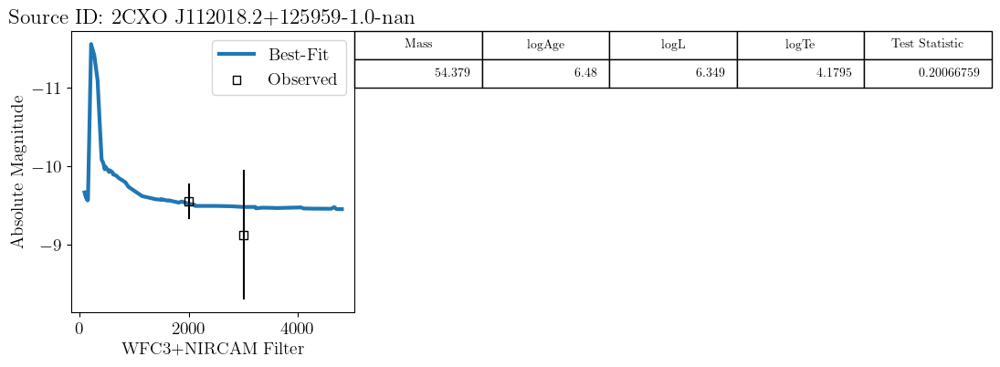

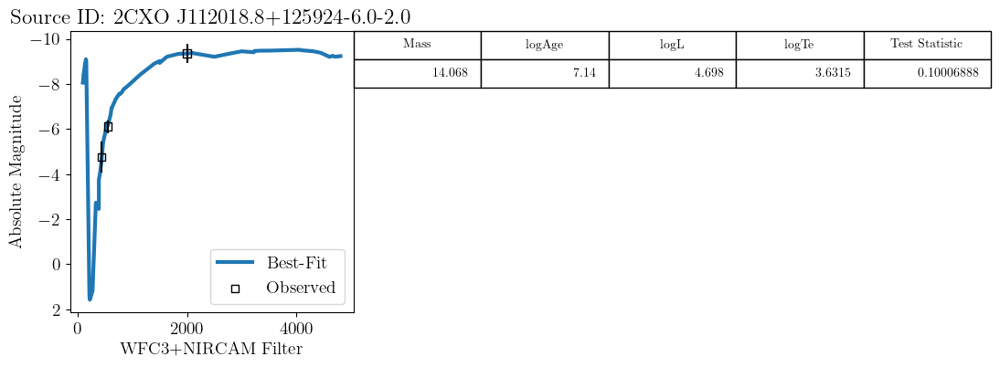

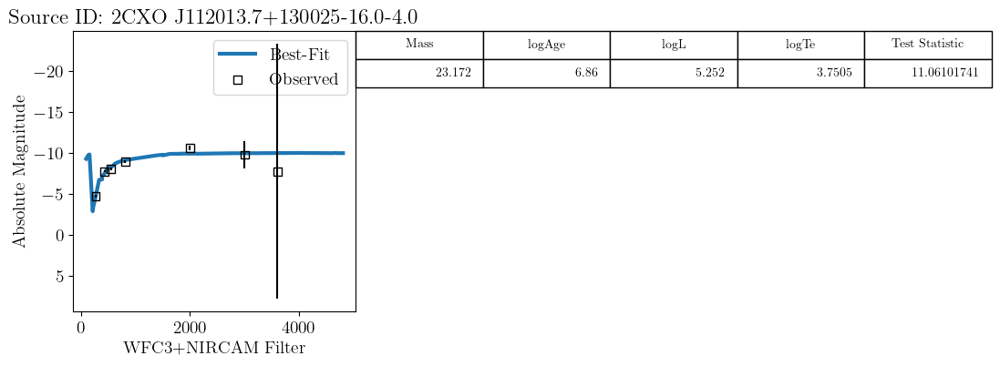

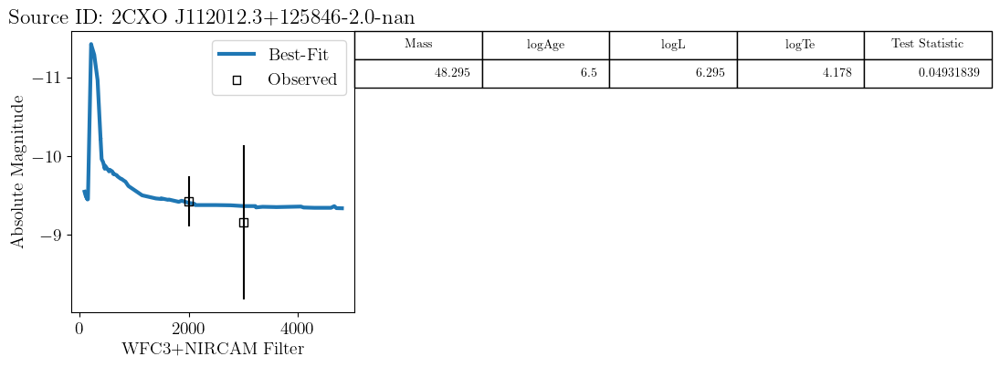

No best-fit model available for Source ID 2CXO J112011.3+125904-nan-nan.


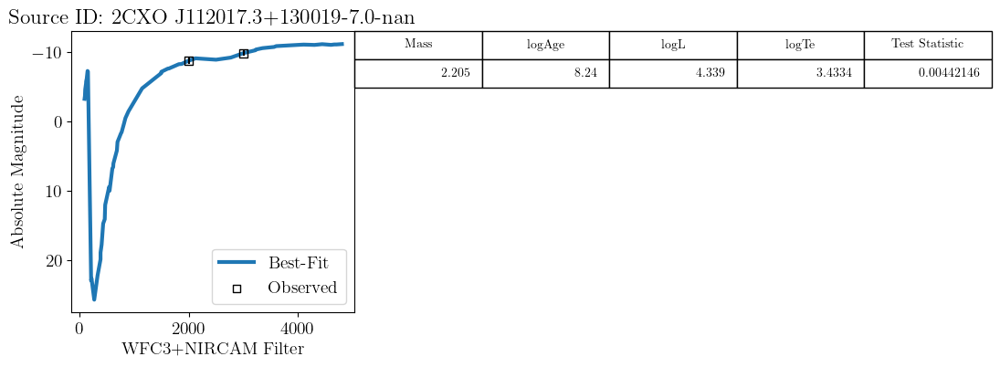

No best-fit model available for Source ID 2CXO J112017.6+130017-nan-nan.


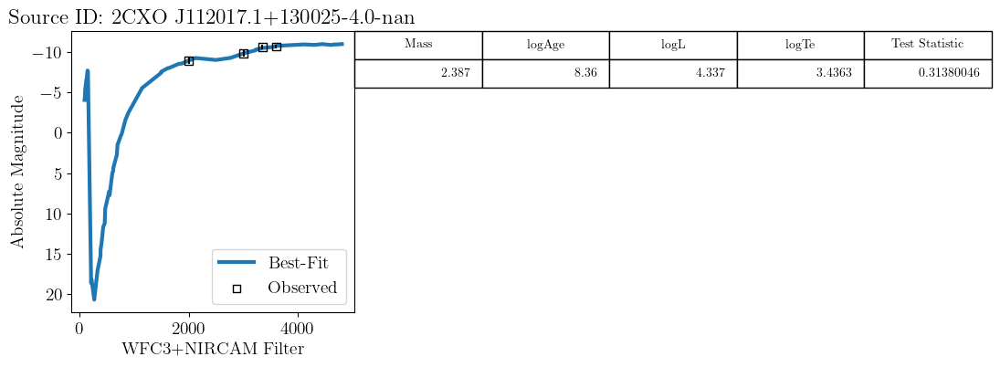

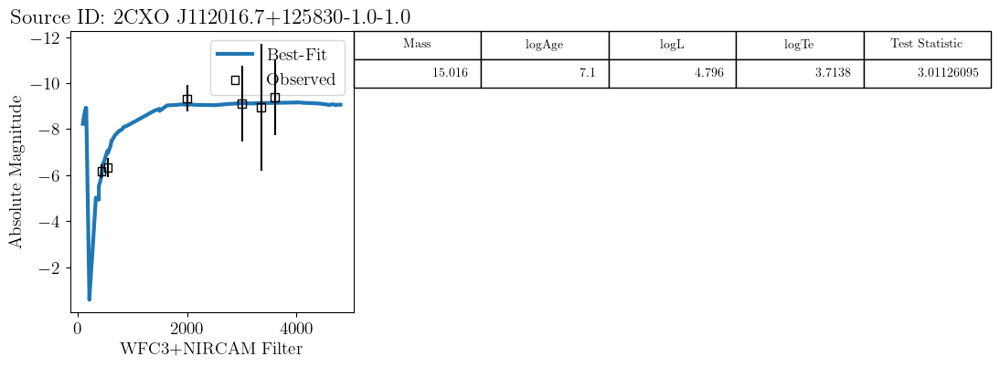

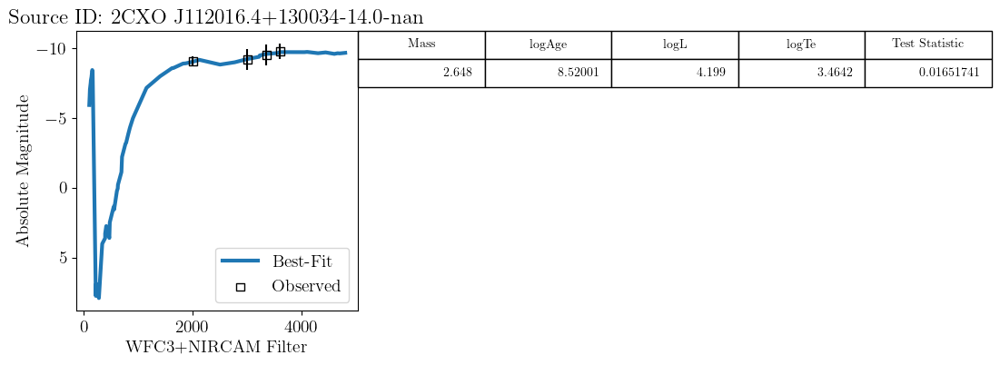

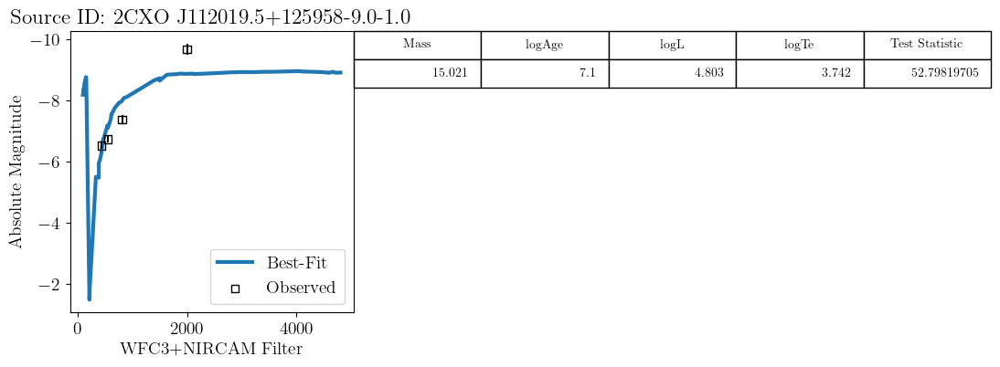

No best-fit model available for Source ID 2CXO J112018.7+130027-nan-nan.


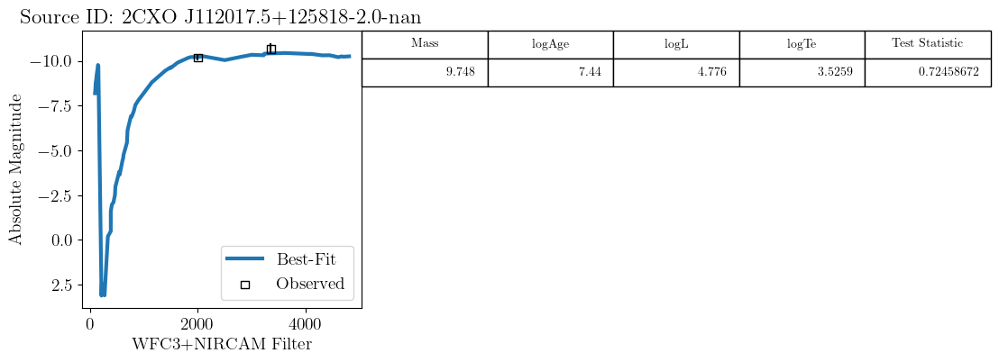

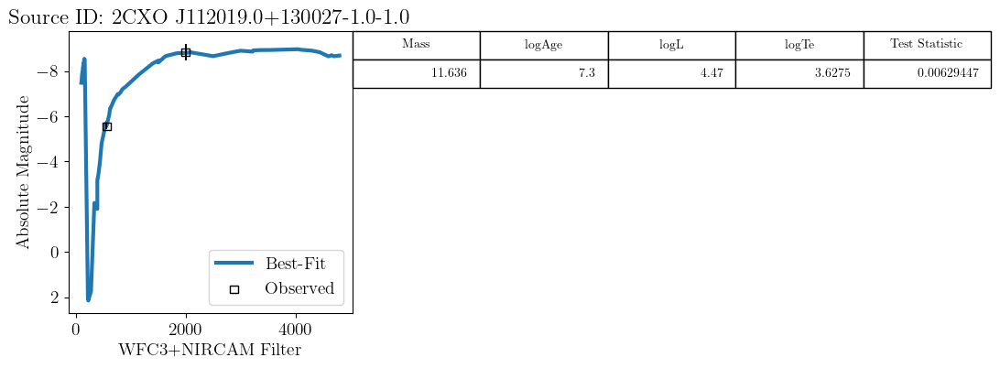

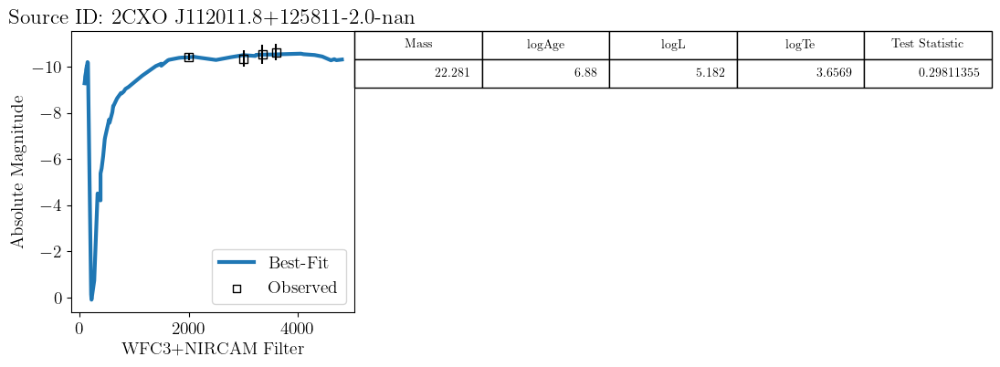

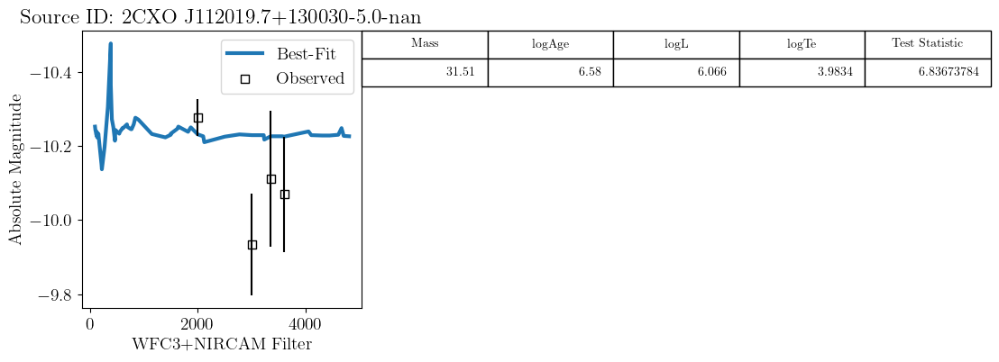

No best-fit model available for Source ID 2CXO J112019.6+125820-nan-nan.
No best-fit model available for Source ID 2CXO J112008.8+125853-nan-nan.
No best-fit model available for Source ID 2CXO J112014.9+130113-nan-nan.


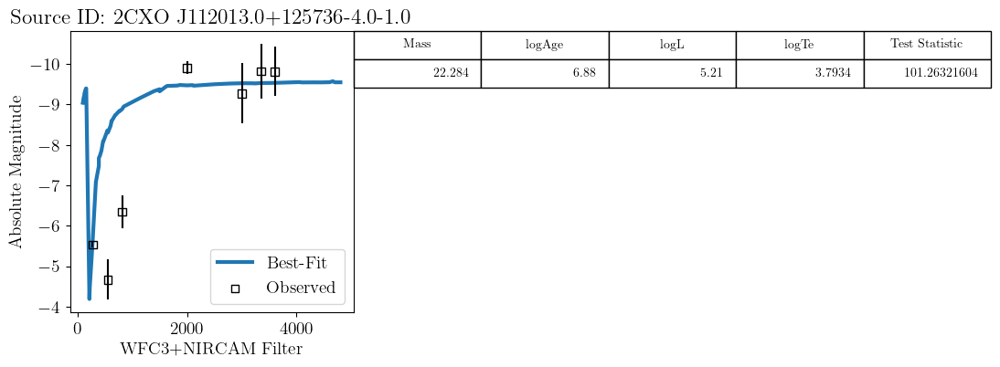

No best-fit model available for Source ID 2CXO J112015.9+125727-nan-2.0.
No best-fit model available for Source ID 2CXO J112018.9+130135-nan-nan.
No best-fit model available for Source ID 2CXO J112017.5+125644-nan-nan.


In [5]:
best_fit = FitSED(
    df=M66_xrbs,
    idheader='Auxiliary ID',
    instrument='wfc3+nircam'
)

In [6]:
tempfit = best_fit.copy()
tempfit['Star Age (Myr)'] = 10 ** tempfit['logAge'].values * u.yr.to(u.Myr)
tempfit = tempfit.merge(M66_xrbs[['Auxiliary ID', 'Class', 'CSC ID']], on='Auxiliary ID', how='left')
tempfit = tempfit[[ 'Auxiliary ID', 'CSC ID', 'Class', 'logAge', 'Star Age (Myr)', 'Mass', 'Test Statistic']]

2CXO J112017.1+130025


,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID
0,2CXO J112017.1+130025,CXO043,LMXB,4.0,NaN,170.071501,13.007211,295775.0,67348.0,62482.0,70482.0,2056.351326,7615.653061,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-8.904805,-0.394295,-9.773001,-0.409687,-10.600129,-0.290637,-10.657383,-0.241274,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2CXO J112017.1+130025-4.0-nan


,Auxiliary ID,CSC ID,Class,logAge,Star Age (Myr),Mass,Test Statistic
0,2CXO J112017.1+130025-4.0-nan,2CXO J112017.1+130025,LMXB,8.36,229.086765,2.387,0.3138


Finding best-fit model(s)...
DONE


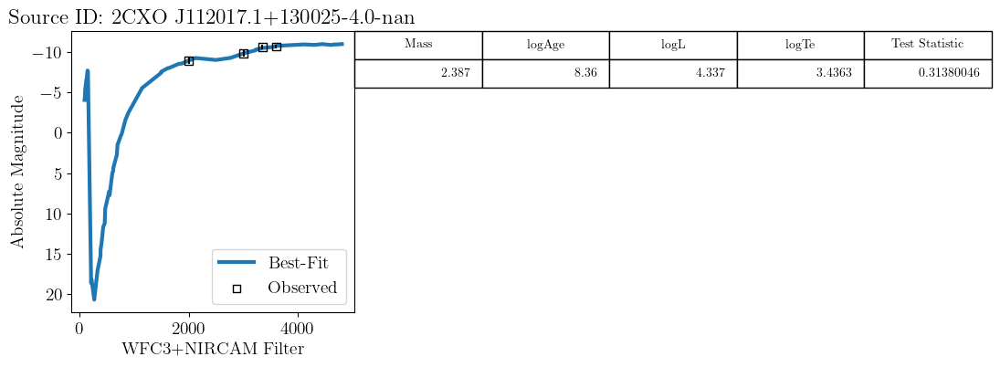

,Unnamed: 0,Zini,MH,logAge,Mini,int_IMF,Mass,logL,logTe,logg,label,McoreTP,C_O,period0,period1,period2,period3,period4,pmode,Mloss,tau1m,X,Y,Xc,Xn,Xo,Cexcess,Z,mbol,F390M,F410M,F467M,F547M,F621M,F689M,F763M,F845M,F098M,F127M,F139M,F153M,F218W,F225W,F275W,F336W,F390W,F438W,F475W,F555W,F606W,F625W,F775W,F814W,F105W,F110W,F125W,F140W,F160W,F700W,F900W,F1150W,F1500W,F2000W,F2770W,F3560W,F4440W,F1500W2,F3220W2,F1400M,F1620M,F1820M,F2100M,F2500M,F3000M,F3350M,F3600M,F4100M,F4300M,F4600M,F4800M,F1640N,F1870N,F2120N,F3230N,F4050N,F4660N,F4700N,Test Statistic,Auxiliary ID
0,74964,0.0152,0.01508,8.36,3.850845,2.606034,2.387,4.337,3.4363,-0.824,8,0.804,0.569,600.44,-1.0,-1.0,-1.0,-1.0,0,-0.000048,2.8,0.6521,0.3317,0.002454,0.002841,0.005753,-1.0,0.01618,-6.072,15.23,13.588,11.202,7.28,4.776,2.705,0.334,-1.592,-4.046,-6.401,-6.79,-7.69,18.598,18.118,20.658,17.012,14.506,11.679,9.417,7.735,4.961,4.313,0.193,-0.798,-4.552,-5.377,-6.152,-6.902,-7.606,1.51,-2.485,-5.53,-7.415,-8.932,-9.261,-10.622,-10.956,-7.552,-10.184,-6.882,-7.986,-8.519,-9.167,-8.995,-9.81,-10.471,-10.735,-10.916,-10.859,-10.854,-10.959,-7.999,-8.539,-9.241,-10.285,-10.896,-10.91,-10.908,0.3138,2CXO J112017.1+130025-4.0-nan


In [7]:
# csclist = M66_notes['CSC ID'].tolist()
cscid = "2CXO J112017.1+130025"
print(cscid)
display(M66_xrbs.query(f'`CSC ID` == "{cscid}"').reset_index(drop=True))
display(tempfit.query(f'`CSC ID` == "{cscid}"').reset_index(drop=True))
FitSED(
    df=M66_xrbs.query(f'`CSC ID` == "{cscid}"').reset_index(drop=True),
    instrument='wfc3+nircam',
    idheader='Auxiliary ID'
)

In [8]:
# Merge Star Ages and masses for WLS best parent finding algorithm
M66_xrbs = M66_xrbs.merge(tempfit, on=['Auxiliary ID', 'CSC ID', 'Class'])

# Finding the best parent cluster

The separation between the XRB and the neighbouring clusters are founding using the X-ray coordinates.

In [9]:
# Add CSC coordinates for finding the distances between clusters
M66_best = remove_unnamed(pd.read_csv(chandra_hst_dir+'M66_csc_bestrads.frame'))
temp = M66_best[['CSC ID', 'RA', 'Dec', '2Sig', '2Sig (pix)']]
temp = temp.rename(columns={
    'RA'         : 'CSC RA',
    'Dec'        : 'CSC Dec',
    '2Sig'       : '2 Sig (arcsec)',
    '2Sig (pix)' : '2 Sig (pix)'
})
M66_xrbs = M66_xrbs.merge(temp, on='CSC ID', how='left')

In [10]:
# 45.5 pc/arcsec
search_radius = 1000 / (3600 * 45.4)
print(f"Using search radius: {search_radius} deg")

Using search radius: 0.006118453255017132 deg


In [11]:
region = M66_dir+'phangsclass12clustercandidatecatalogswithsizes/M66_phangs_cluster_catalog_fk5.reg'
catalog = 'Cluster'
search_radius = search_radius

distances = calculate_distance(
    df=M66_xrbs,
    regions=region,
    catalogs=catalog,
    imagefilename=f555w,
    search_radius=search_radius,
    coordsys='fk5',
    coordheads=['CSC RA', 'CSC Dec'],
    # instrument is used for using the FWHM. I am using WFC3's fwhm for all my work
    instrument='wfc3',
    sourceid='Auxiliary ID'
)
distances

Finding cross-references between sources. This will take a few minutes. Please wait.. 
DONE WITH CLEANING. CREATING DATAFRAME...
Crossrefing done...
Done! Calculated Distances...


,CSC RA,CSC Dec,Auxiliary ID,Cluster ID,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,logAge,Star Age (Myr),Mass,Test Statistic,2 Sig (arcsec),2 Sig (pix),Cluster RA,Cluster Dec,Cluster Separation (arcsecs),Cluster Separation (pc),Cluster Separation (km)
0,170.062259,12.992633,2CXO J112014.9+125933-3.0-2.0,6740,2CXO J112014.9+125933,CXO003,HMXB,3.0,2.0,170.062307,12.992623,194908.0,45185.0,nan,nan,3105.251503,5907.752641,3743.843919,5833.507868,19247.0,130956.0,nan,36055.0,nan,170.062292,12.992626,-12.159049,-0.904646,-13.902257,-0.287522,nan,nan,nan,nan,-2.974469,-1.372681,-7.711479,-0.896442,-8.481385,-0.973168,nan,nan,6.68,4.786301,31.619,36.436988,0.235415,5.941826,170.061849,12.987713,17.769856,808.528449,2.494858e+16
1,170.062259,12.992633,2CXO J112014.9+125933-3.0-2.0,6788,2CXO J112014.9+125933,CXO003,HMXB,3.0,2.0,170.062307,12.992623,194908.0,45185.0,nan,nan,3105.251503,5907.752641,3743.843919,5833.507868,19247.0,130956.0,nan,36055.0,nan,170.062292,12.992626,-12.159049,-0.904646,-13.902257,-0.287522,nan,nan,nan,nan,-2.974469,-1.372681,-7.711479,-0.896442,-8.481385,-0.973168,nan,nan,6.68,4.786301,31.619,36.436988,0.235415,5.941826,170.061836,12.987976,16.830950,765.808229,2.363037e+16
2,170.062259,12.992633,2CXO J112014.9+125933-3.0-2.0,6969,2CXO J112014.9+125933,CXO003,HMXB,3.0,2.0,170.062307,12.992623,194908.0,45185.0,nan,nan,3105.251503,5907.752641,3743.843919,5833.507868,19247.0,130956.0,nan,36055.0,nan,170.062292,12.992626,-12.159049,-0.904646,-13.902257,-0.287522,nan,nan,nan,nan,-2.974469,-1.372681,-7.711479,-0.896442,-8.481385,-0.973168,nan,nan,6.68,4.786301,31.619,36.436988,0.235415,5.941826,170.058290,12.988918,19.306475,878.444618,2.710597e+16
3,170.062259,12.992633,2CXO J112014.9+125933-3.0-2.0,7009,2CXO J112014.9+125933,CXO003,HMXB,3.0,2.0,170.062307,12.992623,194908.0,45185.0,nan,nan,3105.251503,5907.752641,3743.843919,5833.507868,19247.0,130956.0,nan,36055.0,nan,170.062292,12.992626,-12.159049,-0.904646,-13.902257,-0.287522,nan,nan,nan,nan,-2.974469,-1.372681,-7.711479,-0.896442,-8.481385,-0.973168,nan,nan,6.68,4.786301,31.619,36.436988,0.235415,5.941826,170.057680,12.989119,20.444914,930.243609,2.870432e+16
4,170.062259,12.992633,2CXO J112014.9+125933-3.0-2.0,7020,2CXO J112014.9+125933,CXO003,HMXB,3.0,2.0,170.062307,12.992623,194908.0,45185.0,nan,nan,3105.251503,5907.752641,3743.843919,5833.507868,19247.0,130956.0,nan,36055.0,nan,170.062292,12.992626,-12.159049,-0.904646,-13.902257,-0.287522,nan,nan,nan,nan,-2.974469,-1.372681,-7.711479,-0.896442,-8.481385,-0.973168,nan,nan,6.68,4.786301,31.619,36.436988,0.235415,5.941826,170.058557,12.989210,17.902603,814.568423,2.513496e+16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3613,170.054213,12.960156,2CXO J112013.0+125736-4.0-1.0,1555,2CXO J112013.0+125736,CXO060,HMXB,4.0,1.0,170.054191,12.960178,26519.0,6497.0,5610.0,6873.0,4031.312552,2109.128343,4463.71084,2888.783967,1804.0,48203.0,nan,nan,1718.0,170.054162,12.960218,-9.902529,-0.154548,-9.273787,-0.743486,-9.818036,-0.670797,-9.812694,-0.606542,-5.529296,-0.067507,nan,nan,-4.666819,-0.496001,-6.341185,-0.40756,6.88,7.585776,22.284,101.263216,0.387891,9.790275,170.055460,12.965157,18.527051,842.980802,2.601167e+16
3614,170.054213,12.960156,2CXO J112013.0+125736-4.0-1.0,1581,2CXO J112013.0+125736,CXO060,HMXB,4.0,1.0,170.054191,12.960178,26519.0,6497.0,5610.0,6873.0,4031.312552,2109.128343,4463.71084,2888.783967,1804.0,48203.0,nan,nan,1718.0,170.054162,12.960218,-9.902529,-0.154548,-9.273787,-0.743486,-9.818036,-0.670797,-9.812694,-0.606542,-5.529296,-0.067507,nan,nan,-4.666819,-0.

In [12]:
clustercat = pd.read_csv(M66_dir+'phangsclass12clustercandidatecatalogswithsizes/ngc3627_class12_w_sizes.csv')
ra, dec = clustercat['PHANGS_RA'].values, clustercat['PHANGS_DEC'].values
fk5 = SkyCoord(ra=ra, dec=dec, unit='deg', frame='icrs').transform_to(FK5)
ra_fk5, dec_fk5 = fk5.ra.deg, fk5.dec.deg
clustercat['RA'] = ra
clustercat['Dec'] = dec
 
# add the cluster masses, ages and info to the main dataframe
clustercat = clustercat[[
    # 'RA', 'Dec',
    'ID_PHANGS_CLUSTERS',
    'PHANGS_CI', 
    'PHANGS_AGE_MINCHISQ',
    'PHANGS_AGE_MINCHISQ_ERR', 
    'PHANGS_MASS_MINCHISQ',
    'PHANGS_MASS_MINCHISQ_ERR', 
    'PHANGS_EBV_MINCHISQ',
    'PHANGS_EBV_MINCHISQ_ERR', 
    'PHANGS_REDUCED_MINCHISQ',
    'fwhm', 'r_eff(pix)', 
    'r_eff(arcsec)', 'r_eff(pc)'
]] 

# Rename headers to make everything consistent
clustercat = clustercat.rename(columns={
    'ID_PHANGS_CLUSTERS'       : 'Cluster ID',
    # 'RA': 'Cluster RA', 'Dec' : 'Cluster Dec',
    'PHANGS_CI'                : 'Cluster CI',
    'PHANGS_AGE_MINCHISQ'      : 'Cluster Age (Myr)',
    'PHANGS_AGE_MINCHISQ_ERR'  : 'Cluster Age Err (Myr)',
    'PHANGS_MASS_MINCHISQ'     : 'Cluster Mass (M_sun)',
    'PHANGS_MASS_MINCHISQ_ERR' : 'Cluster Mass Err (M_sun)',
    'PHANGS_EBV_MINCHISQ'      : 'Cluster EBV',
    'PHANGS_EBV_MINCHISQ_ERR'  : 'Cluster EBV Err',
    'PHANGS_REDUCED_MINCHISQ'  : 'Cluster Test Statistic',
    'fwhm'                     : 'Cluster FWHM',
    'r_eff(pix)'               : 'Cluster Radius Eff (pix)',
    'r_eff(arcsec)'            : 'Cluster Radius Eff (arcsec)',
    'r_eff(pc)'                : 'Cluster Radius Eff (pc)'
})

clustercat

,Cluster ID,Cluster CI,Cluster Age (Myr),Cluster Age Err (Myr),Cluster Mass (M_sun),Cluster Mass Err (M_sun),Cluster EBV,Cluster EBV Err,Cluster Test Statistic,Cluster FWHM,Cluster Radius Eff (pix),Cluster Radius Eff (arcsec),Cluster Radius Eff (pc)
0,14,1.440696,1.0,1.0,8719.629994,2694.287932,0.31,0.04,0.155719,0.48,0.7104,0.028416,1.556879
1,46,1.652545,2440.0,1412.0,435789.158150,132243.181503,0.15,0.17,0.675790,1.32,1.9536,0.078144,4.281416
2,55,1.554934,182.0,28.0,17467.385090,2360.828542,0.00,0.01,0.798219,0.96,1.4208,0.056832,3.113757
3,68,1.723422,210.0,0.0,80145.110419,9281.609214,0.01,0.03,0.181574,1.55,2.2940,0.091760,5.027420
4,90,1.869660,500.0,151.0,55569.664342,1130.107884,0.00,0.10,0.702583,2.50,3.7000,0.148000,8.108742
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2707,10668,1.837798,1028.0,625.0,15243.314080,6490.579020,0.04,0.37,0.141133,1.32,1.9536,0.078144,4.281416
2708,10670,1.626464,5.0,2.0,8629.588626,2126.057035,0.92,0.13,0.060492,1.18,1.7464,0.069856,3.827326
2709,10671,1.739450,118.0,347.0,11339.952560,1688.263020,0.35,0.24,0.026141,1.55,2.2940,0.091760,5.027420
2710,10672,1.906561,667.0,557.0,15856.958755,2760.559736,0.08,0.33,0.046162,3.09,4.5732,0.182928,10.022406


In [13]:
distances.columns

Index(['CSC RA', 'CSC Dec', 'Auxiliary ID', 'Cluster ID', 'CSC ID', 'ID',
       'Class', 'JWST ID', 'HST ID', 'JWST RA', 'JWST Dec', 'F2000W ID',
       'F3000M ID', 'F3350M ID', 'F3600M ID', 'JWST X', 'JWST Y', 'HST X',
       'HST Y', 'F555W ID', 'F275W ID', 'F336W ID', 'F438W ID', 'F814W ID',
       'HST RA', 'HST Dec', 'F2000W', 'F2000W Err', 'F3000M', 'F3000M Err',
       'F3350M', 'F3350M Err', 'F3600M', 'F3600M Err', 'F275W', 'F275W Err',
       'F438W', 'F438W Err', 'F555W', 'F555W Err', 'F814W', 'F814W Err',
       'logAge', 'Star Age (Myr)', 'Mass', 'Test Statistic', '2 Sig (arcsec)',
       '2 Sig (pix)', 'Cluster RA', 'Cluster Dec',
       'Cluster Separation (arcsecs)', 'Cluster Separation (pc)',
       'Cluster Separation (km)'],
      dtype='object')

In [14]:
distances = distances.merge(clustercat, on=['Cluster ID'], how='left')
distances

,CSC RA,CSC Dec,Auxiliary ID,Cluster ID,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,logAge,Star Age (Myr),Mass,Test Statistic,2 Sig (arcsec),2 Sig (pix),Cluster RA,Cluster Dec,Cluster Separation (arcsecs),Cluster Separation (pc),Cluster Separation (km),Cluster CI,Cluster Age (Myr),Cluster Age Err (Myr),Cluster Mass (M_sun),Cluster Mass Err (M_sun),Cluster EBV,Cluster EBV Err,Cluster Test Statistic,Cluster FWHM,Cluster Radius Eff (pix),Cluster Radius Eff (arcsec),Cluster Radius Eff (pc)
0,170.062259,12.992633,2CXO J112014.9+125933-3.0-2.0,6740,2CXO J112014.9+125933,CXO003,HMXB,3.0,2.0,170.062307,12.992623,194908.0,45185.0,nan,nan,3105.251503,5907.752641,3743.843919,5833.507868,19247.0,130956.0,nan,36055.0,nan,170.062292,12.992626,-12.159049,-0.904646,-13.902257,-0.287522,nan,nan,nan,nan,-2.974469,-1.372681,-7.711479,-0.896442,-8.481385,-0.973168,nan,nan,6.68,4.786301,31.619,36.436988,0.235415,5.941826,170.061849,12.987713,17.769856,808.528449,2.494858e+16,1.613909,5.0,153.0,32159.451166,67739.414328,0.80,0.50,23.386633,0.96,1.4208,0.056832,3.113757
1,170.062259,12.992633,2CXO J112014.9+125933-3.0-2.0,6788,2CXO J112014.9+125933,CXO003,HMXB,3.0,2.0,170.062307,12.992623,194908.0,45185.0,nan,nan,3105.251503,5907.752641,3743.843919,5833.507868,19247.0,130956.0,nan,36055.0,nan,170.062292,12.992626,-12.159049,-0.904646,-13.902257,-0.287522,nan,nan,nan,nan,-2.974469,-1.372681,-7.711479,-0.896442,-8.481385,-0.973168,nan,nan,6.68,4.786301,31.619,36.436988,0.235415,5.941826,170.061836,12.987976,16.830950,765.808229,2.363037e+16,1.423196,890.0,120.0,174363.656114,17070.864641,0.00,0.01,3.086535,0.39,0.5772,0.023088,1.264964
2,170.062259,12.992633,2CXO J112014.9+125933-3.0-2.0,6969,2CXO J112014.9+125933,CXO003,HMXB,3.0,2.0,170.062307,12.992623,194908.0,45185.0,nan,nan,3105.251503,5907.752641,3743.843919,5833.507868,19247.0,130956.0,nan,36055.0,nan,170.062292,12.992626,-12.159049,-0.904646,-13.902257,-0.287522,nan,nan,nan,nan,-2.974469,-1.372681,-7.711479,-0.896442,-8.481385,-0.973168,nan,nan,6.68,4.786301,31.619,36.436988,0.235415,5.941826,170.058290,12.988918,19.306475,878.444618,2.710597e+16,1.750547,500.0,77.0,69972.213290,11389.178992,0.10,0.09,1.464285,1.91,2.8268,0.113072,6.195079
3,170.062259,12.992633,2CXO J112014.9+125933-3.0-2.0,7009,2CXO J112014.9+125933,CXO003,HMXB,3.0,2.0,170.062307,12.992623,194908.0,45185.0,nan,nan,3105.251503,5907.752641,3743.843919,5833.507868,19247.0,130956.0,nan,36055.0,nan,170.062292,12.992626,-12.159049,-0.904646,-13.902257,-0.287522,nan,nan,nan,nan,-2.974469,-1.372681,-7.711479,-0.896442,-8.481385,-0.973168,nan,nan,6.68,4.786301,31.619,36.436988,0.235415,5.941826,170.057680,12.989119,20.444914,930.243609,2.870432e+16,1.763707,158.0,48.0,206060.938059,14694.145980,0.01,0.09,0.208602,1.91,2.8268,0.113072,6.195079
4,170.062259,12.992633,2CXO J112014.9+125933-3.0-2.0,7020,2CXO J112014.9+125933,CXO003,HMXB,3.0,2.0,170.062307,12.992623,194908.0,45185.0,nan,nan,3105.251503,5907.752641,3743.843919,5833.507868,19247.0,130956.0,nan,36055.0,nan,170.062292,12.992626,-12.159049,-0.904646,-13.902257,-0.287522,nan,nan,nan,nan,-2.974469,-1.372681,-7.711479,-0.896442,-8.481385,-0.973168,nan,nan,6.68,4.786301,31.619,36.436988,0.235415,5.941826,170.058557,12.989210,17.902603,814.568423,2.513496e+16,1.750742,110.0,34.0,43030.350062,573.446002,0.26,0.07,0.680461,2.36,3.4928,0.139712,7.654653
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3613,170.054213,12.960156,2CXO J112013.0+125736-4.0-1.0,1555,2CXO J112013.0+125736,CXO060,HMXB,4.0,1.0,170.054191

## Histogram of # clusters associated with each XRB. 

- instructive to see how many are in regions crowded with XRBs
- how many have few potential parents

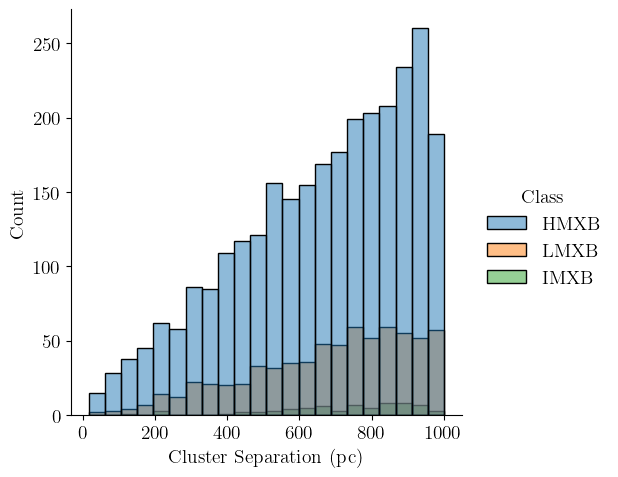

In [15]:
sns.displot(
    data=distances, 
    kind='hist', 
    x='Cluster Separation (pc)',
    hue='Class', # CSC ID
    legend=True,
)

## Selecting the best parent cluster

In [16]:
age_s = distances['Star Age (Myr)'].values * u.Myr.to(u.s)
distances.insert(distances.columns.get_loc('Star Age (Myr)') + 1,
                           'Star Age (s)', age_s)
distances

,CSC RA,CSC Dec,Auxiliary ID,Cluster ID,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,logAge,Star Age (Myr),Star Age (s),Mass,Test Statistic,2 Sig (arcsec),2 Sig (pix),Cluster RA,Cluster Dec,Cluster Separation (arcsecs),Cluster Separation (pc),Cluster Separation (km),Cluster CI,Cluster Age (Myr),Cluster Age Err (Myr),Cluster Mass (M_sun),Cluster Mass Err (M_sun),Cluster EBV,Cluster EBV Err,Cluster Test Statistic,Cluster FWHM,Cluster Radius Eff (pix),Cluster Radius Eff (arcsec),Cluster Radius Eff (pc)
0,170.062259,12.992633,2CXO J112014.9+125933-3.0-2.0,6740,2CXO J112014.9+125933,CXO003,HMXB,3.0,2.0,170.062307,12.992623,194908.0,45185.0,nan,nan,3105.251503,5907.752641,3743.843919,5833.507868,19247.0,130956.0,nan,36055.0,nan,170.062292,12.992626,-12.159049,-0.904646,-13.902257,-0.287522,nan,nan,nan,nan,-2.974469,-1.372681,-7.711479,-0.896442,-8.481385,-0.973168,nan,nan,6.68,4.786301,151044170014808.8125,31.619,36.436988,0.235415,5.941826,170.061849,12.987713,17.769856,808.528449,2.494858e+16,1.613909,5.0,153.0,32159.451166,67739.414328,0.80,0.50,23.386633,0.96,1.4208,0.056832,3.113757
1,170.062259,12.992633,2CXO J112014.9+125933-3.0-2.0,6788,2CXO J112014.9+125933,CXO003,HMXB,3.0,2.0,170.062307,12.992623,194908.0,45185.0,nan,nan,3105.251503,5907.752641,3743.843919,5833.507868,19247.0,130956.0,nan,36055.0,nan,170.062292,12.992626,-12.159049,-0.904646,-13.902257,-0.287522,nan,nan,nan,nan,-2.974469,-1.372681,-7.711479,-0.896442,-8.481385,-0.973168,nan,nan,6.68,4.786301,151044170014808.8125,31.619,36.436988,0.235415,5.941826,170.061836,12.987976,16.830950,765.808229,2.363037e+16,1.423196,890.0,120.0,174363.656114,17070.864641,0.00,0.01,3.086535,0.39,0.5772,0.023088,1.264964
2,170.062259,12.992633,2CXO J112014.9+125933-3.0-2.0,6969,2CXO J112014.9+125933,CXO003,HMXB,3.0,2.0,170.062307,12.992623,194908.0,45185.0,nan,nan,3105.251503,5907.752641,3743.843919,5833.507868,19247.0,130956.0,nan,36055.0,nan,170.062292,12.992626,-12.159049,-0.904646,-13.902257,-0.287522,nan,nan,nan,nan,-2.974469,-1.372681,-7.711479,-0.896442,-8.481385,-0.973168,nan,nan,6.68,4.786301,151044170014808.8125,31.619,36.436988,0.235415,5.941826,170.058290,12.988918,19.306475,878.444618,2.710597e+16,1.750547,500.0,77.0,69972.213290,11389.178992,0.10,0.09,1.464285,1.91,2.8268,0.113072,6.195079
3,170.062259,12.992633,2CXO J112014.9+125933-3.0-2.0,7009,2CXO J112014.9+125933,CXO003,HMXB,3.0,2.0,170.062307,12.992623,194908.0,45185.0,nan,nan,3105.251503,5907.752641,3743.843919,5833.507868,19247.0,130956.0,nan,36055.0,nan,170.062292,12.992626,-12.159049,-0.904646,-13.902257,-0.287522,nan,nan,nan,nan,-2.974469,-1.372681,-7.711479,-0.896442,-8.481385,-0.973168,nan,nan,6.68,4.786301,151044170014808.8125,31.619,36.436988,0.235415,5.941826,170.057680,12.989119,20.444914,930.243609,2.870432e+16,1.763707,158.0,48.0,206060.938059,14694.145980,0.01,0.09,0.208602,1.91,2.8268,0.113072,6.195079
4,170.062259,12.992633,2CXO J112014.9+125933-3.0-2.0,7020,2CXO J112014.9+125933,CXO003,HMXB,3.0,2.0,170.062307,12.992623,194908.0,45185.0,nan,nan,3105.251503,5907.752641,3743.843919,5833.507868,19247.0,130956.0,nan,36055.0,nan,170.062292,12.992626,-12.159049,-0.904646,-13.902257,-0.287522,nan,nan,nan,nan,-2.974469,-1.372681,-7.711479,-0.896442,-8.481385,-0.973168,nan,nan,6.68,4.786301,151044170014808.8125,31.619,36.436988,0.235415,5.941826,170.058557,12.989210,17.902603,814.568423,2.513496e+16,1.750742,110.0,34.0,43030.350062,573.446002,0.26,0.07,0.680461,2.36,3.4928,0.139712,7.654653
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...

In [17]:
dists = distances.copy()

I am still testing out an algorithm to select the best parent-star cluster. Currently, I have two algorithms, one with the standard weighted least squares fitting, but we are afraid that it might giving a little too much weightage to the errors in the age. The PHANGS collaboration have exceptionally high error in the cluster ages, which completely blotches some parts of my analysis. 

I have designed another algorithm within the same code that gives a lesser weightage to the errors, while placing a higher importance for the distances between the XRB and the cluster. Perhaps that might be a better way to judge this. 

In [18]:
parent_cluster = find_parent_cluster(df=dists, fit_type='updated wls')
parent_cluster

,CSC RA,CSC Dec,Auxiliary ID,Cluster ID,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,logAge,Star Age (Myr),Star Age (s),Mass,Test Statistic,2 Sig (arcsec),2 Sig (pix),Cluster RA,Cluster Dec,Cluster Separation (arcsecs),Cluster Separation (pc),Cluster Separation (km),Cluster CI,Cluster Age (Myr),Cluster Age Err (Myr),Cluster Mass (M_sun),Cluster Mass Err (M_sun),Cluster EBV,Cluster EBV Err,Cluster Test Statistic,Cluster FWHM,Cluster Radius Eff (pix),Cluster Radius Eff (arcsec),Cluster Radius Eff (pc),XRB-Parent Test Statistic
0,170.062259,12.992633,2CXO J112014.9+125933-3.0-2.0,6740,2CXO J112014.9+125933,CXO003,HMXB,3.0,2.0,170.062307,12.992623,194908.0,45185.0,nan,nan,3105.251503,5907.752641,3743.843919,5833.507868,19247.0,130956.0,nan,36055.0,nan,170.062292,12.992626,-12.159049,-0.904646,-13.902257,-0.287522,nan,nan,nan,nan,-2.974469,-1.372681,-7.711479,-0.896442,-8.481385,-0.973168,nan,nan,6.68,4.786301,151044170014808.8125,31.619,36.436988,0.235415,5.941826,170.061849,12.987713,17.769856,808.528449,2.494858e+16,1.613909,5.0,153.0,32159.451166,67739.414328,0.80,0.50,23.386633,0.96,1.4208,0.056832,3.113757,0.241329
1,170.062259,12.992633,2CXO J112014.9+125933-3.0-2.0,6788,2CXO J112014.9+125933,CXO003,HMXB,3.0,2.0,170.062307,12.992623,194908.0,45185.0,nan,nan,3105.251503,5907.752641,3743.843919,5833.507868,19247.0,130956.0,nan,36055.0,nan,170.062292,12.992626,-12.159049,-0.904646,-13.902257,-0.287522,nan,nan,nan,nan,-2.974469,-1.372681,-7.711479,-0.896442,-8.481385,-0.973168,nan,nan,6.68,4.786301,151044170014808.8125,31.619,36.436988,0.235415,5.941826,170.061836,12.987976,16.830950,765.808229,2.363037e+16,1.423196,890.0,120.0,174363.656114,17070.864641,0.00,0.01,3.086535,0.39,0.5772,0.023088,1.264964,5000748.752251
2,170.062259,12.992633,2CXO J112014.9+125933-3.0-2.0,6969,2CXO J112014.9+125933,CXO003,HMXB,3.0,2.0,170.062307,12.992623,194908.0,45185.0,nan,nan,3105.251503,5907.752641,3743.843919,5833.507868,19247.0,130956.0,nan,36055.0,nan,170.062292,12.992626,-12.159049,-0.904646,-13.902257,-0.287522,nan,nan,nan,nan,-2.974469,-1.372681,-7.711479,-0.896442,-8.481385,-0.973168,nan,nan,6.68,4.786301,151044170014808.8125,31.619,36.436988,0.235415,5.941826,170.058290,12.988918,19.306475,878.444618,2.710597e+16,1.750547,500.0,77.0,69972.213290,11389.178992,0.10,0.09,1.464285,1.91,2.8268,0.113072,6.195079,2797750.365946
3,170.062259,12.992633,2CXO J112014.9+125933-3.0-2.0,7009,2CXO J112014.9+125933,CXO003,HMXB,3.0,2.0,170.062307,12.992623,194908.0,45185.0,nan,nan,3105.251503,5907.752641,3743.843919,5833.507868,19247.0,130956.0,nan,36055.0,nan,170.062292,12.992626,-12.159049,-0.904646,-13.902257,-0.287522,nan,nan,nan,nan,-2.974469,-1.372681,-7.711479,-0.896442,-8.481385,-0.973168,nan,nan,6.68,4.786301,151044170014808.8125,31.619,36.436988,0.235415,5.941826,170.057680,12.989119,20.444914,930.243609,2.870432e+16,1.763707,158.0,48.0,206060.938059,14694.145980,0.01,0.09,0.208602,1.91,2.8268,0.113072,6.195079,454936.365505
4,170.062259,12.992633,2CXO J112014.9+125933-3.0-2.0,7020,2CXO J112014.9+125933,CXO003,HMXB,3.0,2.0,170.062307,12.992623,194908.0,45185.0,nan,nan,3105.251503,5907.752641,3743.843919,5833.507868,19247.0,130956.0,nan,36055.0,nan,170.062292,12.992626,-12.159049,-0.904646,-13.902257,-0.287522,nan,nan,nan,nan,-2.974469,-1.372681,-7.711479,-0.896442,-8.481385,-0.973168,nan,nan,6.68,4.786301,151044170014808.8125,31.619,36.436988,0.235415,5.941826,170.058557,12.989210,17.902603,814.568423,2.513496e+16,1.750742,110.0,34.0,43030.350062,573.446002,0.26,0.07,0.680461,2.36,3.4928,0.139712,7.654653,265212.037887
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,..

In [19]:
test = find_parent_cluster(df=dists, fit_type='wls')
test

,CSC RA,CSC Dec,Auxiliary ID,Cluster ID,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,logAge,Star Age (Myr),Star Age (s),Mass,Test Statistic,2 Sig (arcsec),2 Sig (pix),Cluster RA,Cluster Dec,Cluster Separation (arcsecs),Cluster Separation (pc),Cluster Separation (km),Cluster CI,Cluster Age (Myr),Cluster Age Err (Myr),Cluster Mass (M_sun),Cluster Mass Err (M_sun),Cluster EBV,Cluster EBV Err,Cluster Test Statistic,Cluster FWHM,Cluster Radius Eff (pix),Cluster Radius Eff (arcsec),Cluster Radius Eff (pc),XRB-Parent Test Statistic
0,170.062259,12.992633,2CXO J112014.9+125933-3.0-2.0,6740,2CXO J112014.9+125933,CXO003,HMXB,3.0,2.0,170.062307,12.992623,194908.0,45185.0,nan,nan,3105.251503,5907.752641,3743.843919,5833.507868,19247.0,130956.0,nan,36055.0,nan,170.062292,12.992626,-12.159049,-0.904646,-13.902257,-0.287522,nan,nan,nan,nan,-2.974469,-1.372681,-7.711479,-0.896442,-8.481385,-0.973168,nan,nan,6.68,4.786301,151044170014808.8125,31.619,36.436988,0.235415,5.941826,170.061849,12.987713,17.769856,808.528449,2.494858e+16,1.613909,5.0,153.0,32159.451166,67739.414328,0.80,0.50,23.386633,0.96,1.4208,0.056832,3.113757,0.000002
1,170.062259,12.992633,2CXO J112014.9+125933-3.0-2.0,6788,2CXO J112014.9+125933,CXO003,HMXB,3.0,2.0,170.062307,12.992623,194908.0,45185.0,nan,nan,3105.251503,5907.752641,3743.843919,5833.507868,19247.0,130956.0,nan,36055.0,nan,170.062292,12.992626,-12.159049,-0.904646,-13.902257,-0.287522,nan,nan,nan,nan,-2.974469,-1.372681,-7.711479,-0.896442,-8.481385,-0.973168,nan,nan,6.68,4.786301,151044170014808.8125,31.619,36.436988,0.235415,5.941826,170.061836,12.987976,16.830950,765.808229,2.363037e+16,1.423196,890.0,120.0,174363.656114,17070.864641,0.00,0.01,3.086535,0.39,0.5772,0.023088,1.264964,54.416895
2,170.062259,12.992633,2CXO J112014.9+125933-3.0-2.0,6969,2CXO J112014.9+125933,CXO003,HMXB,3.0,2.0,170.062307,12.992623,194908.0,45185.0,nan,nan,3105.251503,5907.752641,3743.843919,5833.507868,19247.0,130956.0,nan,36055.0,nan,170.062292,12.992626,-12.159049,-0.904646,-13.902257,-0.287522,nan,nan,nan,nan,-2.974469,-1.372681,-7.711479,-0.896442,-8.481385,-0.973168,nan,nan,6.68,4.786301,151044170014808.8125,31.619,36.436988,0.235415,5.941826,170.058290,12.988918,19.306475,878.444618,2.710597e+16,1.750547,500.0,77.0,69972.213290,11389.178992,0.10,0.09,1.464285,1.91,2.8268,0.113072,6.195079,41.362221
3,170.062259,12.992633,2CXO J112014.9+125933-3.0-2.0,7009,2CXO J112014.9+125933,CXO003,HMXB,3.0,2.0,170.062307,12.992623,194908.0,45185.0,nan,nan,3105.251503,5907.752641,3743.843919,5833.507868,19247.0,130956.0,nan,36055.0,nan,170.062292,12.992626,-12.159049,-0.904646,-13.902257,-0.287522,nan,nan,nan,nan,-2.974469,-1.372681,-7.711479,-0.896442,-8.481385,-0.973168,nan,nan,6.68,4.786301,151044170014808.8125,31.619,36.436988,0.235415,5.941826,170.057680,12.989119,20.444914,930.243609,2.870432e+16,1.763707,158.0,48.0,206060.938059,14694.145980,0.01,0.09,0.208602,1.91,2.8268,0.113072,6.195079,10.188558
4,170.062259,12.992633,2CXO J112014.9+125933-3.0-2.0,7020,2CXO J112014.9+125933,CXO003,HMXB,3.0,2.0,170.062307,12.992623,194908.0,45185.0,nan,nan,3105.251503,5907.752641,3743.843919,5833.507868,19247.0,130956.0,nan,36055.0,nan,170.062292,12.992626,-12.159049,-0.904646,-13.902257,-0.287522,nan,nan,nan,nan,-2.974469,-1.372681,-7.711479,-0.896442,-8.481385,-0.973168,nan,nan,6.68,4.786301,151044170014808.8125,31.619,36.436988,0.235415,5.941826,170.058557,12.989210,17.902603,814.568423,2.513496e+16,1.750742,110.0,34.0,43030.350062,573.446002,0.26,0.07,0.680461,2.36,3.4928,0.139712,7.654653,9.576058
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,.

In [20]:
temp = Find(parent_cluster, 'CSC ID == 2CXO J112014.9+125933')
temp['XRB-Parent Test Statistic'] = temp['XRB-Parent Test Statistic'].values.astype(float)
temp_src = temp.nsmallest(10, 'XRB-Parent Test Statistic')
temp_src['Cluster ID'].values.tolist()

[np.int64(6740),
 np.int64(7720),
 np.int64(7359),
 np.int64(6790),
 np.int64(7842),
 np.int64(8032),
 np.int64(6588),
 np.int64(7005),
 np.int64(7811),
 np.int64(7477)]

In [21]:
test = Find(test, 'CSC ID == 2CXO J112014.9+125933')
test ['XRB-Parent Test Statistic'] = test['XRB-Parent Test Statistic'].values.astype(float)
test_src = test.nsmallest(10, 'XRB-Parent Test Statistic')
test_src['Cluster ID'].values.tolist()

[np.int64(6790),
 np.int64(6740),
 np.int64(7720),
 np.int64(7359),
 np.int64(8032),
 np.int64(7842),
 np.int64(7811),
 np.int64(7496),
 np.int64(8045),
 np.int64(7005)]

In [22]:
ids = set(temp_src['Cluster ID'].values.tolist()).intersection(set(test_src['Cluster ID'].values.tolist()))

In [23]:
for id in ids:
    print(f'################## {id} ########################')
    display(Find(test_src, f'Cluster ID == {id}')[['Star Age (Myr)', 'Cluster Age (Myr)',
            'Cluster Age Err (Myr)', 'XRB-Parent Test Statistic']])
    display(Find(temp_src, f'Cluster ID == {id}')[['Star Age (Myr)', 'Cluster Age (Myr)',
            'Cluster Age Err (Myr)', 'XRB-Parent Test Statistic']])
    print('##########################################################')

################## 8032 ########################


,Star Age (Myr),Cluster Age (Myr),Cluster Age Err (Myr),XRB-Parent Test Statistic
0,4.786301,7.0,39.0,0.003222


,Star Age (Myr),Cluster Age (Myr),Cluster Age Err (Myr),XRB-Parent Test Statistic
0,4.786301,7.0,39.0,122.937658


##########################################################
################## 7842 ########################


,Star Age (Myr),Cluster Age (Myr),Cluster Age Err (Myr),XRB-Parent Test Statistic
0,4.786301,2.0,47.0,0.003514


,Star Age (Myr),Cluster Age (Myr),Cluster Age Err (Myr),XRB-Parent Test Statistic
0,4.786301,2.0,47.0,66.688518


##########################################################
################## 7811 ########################


,Star Age (Myr),Cluster Age (Myr),Cluster Age Err (Myr),XRB-Parent Test Statistic
0,4.786301,403.0,3357.0,0.014071


,Star Age (Myr),Cluster Age (Myr),Cluster Age Err (Myr),XRB-Parent Test Statistic
0,4.786301,403.0,3357.0,21648.244156


##########################################################
################## 6790 ########################


,Star Age (Myr),Cluster Age (Myr),Cluster Age Err (Myr),XRB-Parent Test Statistic
0,4.786301,6.0,1468.0,6.835494e-07


,Star Age (Myr),Cluster Age (Myr),Cluster Age Err (Myr),XRB-Parent Test Statistic
0,4.786301,6.0,1468.0,0.759842


##########################################################
################## 7720 ########################


,Star Age (Myr),Cluster Age (Myr),Cluster Age Err (Myr),XRB-Parent Test Statistic
0,4.786301,5.0,97.0,0.000005


,Star Age (Myr),Cluster Age (Myr),Cluster Age Err (Myr),XRB-Parent Test Statistic
0,4.786301,5.0,97.0,0.404885


##########################################################
################## 6740 ########################


,Star Age (Myr),Cluster Age (Myr),Cluster Age Err (Myr),XRB-Parent Test Statistic
0,4.786301,5.0,153.0,0.000002


,Star Age (Myr),Cluster Age (Myr),Cluster Age Err (Myr),XRB-Parent Test Statistic
0,4.786301,5.0,153.0,0.241329


##########################################################
################## 7005 ########################


,Star Age (Myr),Cluster Age (Myr),Cluster Age Err (Myr),XRB-Parent Test Statistic
0,4.786301,34.0,37.0,0.623404


,Star Age (Myr),Cluster Age (Myr),Cluster Age Err (Myr),XRB-Parent Test Statistic
0,4.786301,34.0,37.0,18673.765648


##########################################################
################## 7359 ########################


,Star Age (Myr),Cluster Age (Myr),Cluster Age Err (Myr),XRB-Parent Test Statistic
0,4.786301,5.0,66.0,0.00001


,Star Age (Myr),Cluster Age (Myr),Cluster Age Err (Myr),XRB-Parent Test Statistic
0,4.786301,5.0,66.0,0.45859


##########################################################


In [24]:
display(temp_src[['Cluster ID', 'Star Age (Myr)', 'Cluster Age (Myr)',
            'Cluster Age Err (Myr)', 'Cluster Separation (pc)'
            ,'XRB-Parent Test Statistic']])

display(test_src[['Cluster ID', 'Star Age (Myr)', 'Cluster Age (Myr)',
            'Cluster Age Err (Myr)', 'Cluster Separation (pc)'
            ,'XRB-Parent Test Statistic']])

Find(test, 'CSC ID == 2CXO J112014.9+125933')[['Cluster ID',\
             'Star Age (Myr)', 'Cluster Age (Myr)',
            'Cluster Age Err (Myr)', 'Cluster Separation (pc)'
            ,'XRB-Parent Test Statistic']].astype(float).nsmallest(20, 'XRB-Parent Test Statistic')

,Cluster ID,Star Age (Myr),Cluster Age (Myr),Cluster Age Err (Myr),Cluster Separation (pc),XRB-Parent Test Statistic
0,6740,4.786301,5.0,153.0,808.528449,0.241329
20,7720,4.786301,5.0,97.0,859.999633,0.404885
39,7359,4.786301,5.0,66.0,662.771003,0.458590
35,6790,4.786301,6.0,1468.0,757.229005,0.759842
49,7842,4.786301,2.0,47.0,403.731732,66.688518
26,8032,4.786301,7.0,39.0,978.390830,122.937658
31,6588,4.786301,1.0,4.0,962.017703,3447.889407
36,7005,4.786301,34.0,37.0,809.581407,18673.765648
48,7811,4.786301,403.0,3357.0,458.291314,21648.244156
41,7477,4.786301,30.0,16.0,930.550319,36973.708286


,Cluster ID,Star Age (Myr),Cluster Age (Myr),Cluster Age Err (Myr),Cluster Separation (pc),XRB-Parent Test Statistic
35,6790,4.786301,6.0,1468.0,757.229005,6.835494e-07
0,6740,4.786301,5.0,153.0,808.528449,1.950843e-06
20,7720,4.786301,5.0,97.0,859.999633,4.853576e-06
39,7359,4.786301,5.0,66.0,662.771003,1.048377e-05
26,8032,4.786301,7.0,39.0,978.390830,3.221870e-03
49,7842,4.786301,2.0,47.0,403.731732,3.514474e-03
48,7811,4.786301,403.0,3357.0,458.291314,1.407115e-02
15,7496,4.786301,2623.0,9282.0,306.342735,7.956591e-02
52,8045,4.786301,465.0,1009.0,774.217608,2.080352e-01
36,7005,4.786301,34.0,37.0,809.581407,6.234041e-01


,Cluster ID,Star Age (Myr),Cluster Age (Myr),Cluster Age Err (Myr),Cluster Separation (pc),XRB-Parent Test Statistic
35,6790.0,4.786301,6.0,1468.0,757.229005,6.835494e-07
0,6740.0,4.786301,5.0,153.0,808.528449,1.950843e-06
20,7720.0,4.786301,5.0,97.0,859.999633,4.853576e-06
39,7359.0,4.786301,5.0,66.0,662.771003,1.048377e-05
26,8032.0,4.786301,7.0,39.0,978.390830,3.221870e-03
49,7842.0,4.786301,2.0,47.0,403.731732,3.514474e-03
48,7811.0,4.786301,403.0,3357.0,458.291314,1.407115e-02
15,7496.0,4.786301,2623.0,9282.0,306.342735,7.956591e-02
52,8045.0,4.786301,465.0,1009.0,774.217608,2.080352e-01
36,7005.0,4.786301,34.0,37.0,809.581407,6.234041e-01


In [25]:
parent_cluster.to_csv('/Users/undergradstudent/Downloads/temp.csv')

# Distance plots

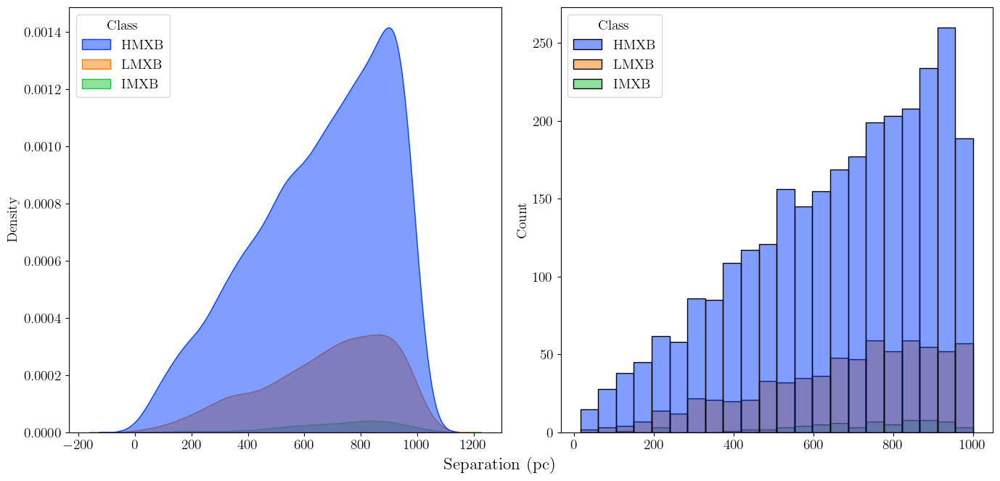

In [26]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(14, 7))

sns.kdeplot(
    data=parent_cluster,
    x='Cluster Separation (pc)',
    fill=True, 
    ax=ax[0], 
    alpha=0.5,
    hue='Class',
    palette='bright'
)
ax[0].set(xlabel=None)
sns.histplot(
    data=parent_cluster,
    x='Cluster Separation (pc)',
    hue='Class',
    legend=True,
    # kind='hist',
    palette='bright',
    alpha=0.5,
    ax=ax[1]
)
ax[1].set(xlabel=None)

# ax[1].hist(x=velocity['Cluster Separation (pc)'].values, bins=30)
# ax[1].set_ylabel('Counts')

fig.supxlabel("Separation (pc)", x=0.5, y=0.05)
plt.tight_layout()
# plt.savefig(M66_dir+'M66_XRB_ejection_compact_association_cat_separation.png')
plt.show()

# Minimum Velocity and Velocity of Ejection

In [27]:
parent_cluster.columns

Index(['CSC RA', 'CSC Dec', 'Auxiliary ID', 'Cluster ID', 'CSC ID', 'ID',
       'Class', 'JWST ID', 'HST ID', 'JWST RA', 'JWST Dec', 'F2000W ID',
       'F3000M ID', 'F3350M ID', 'F3600M ID', 'JWST X', 'JWST Y', 'HST X',
       'HST Y', 'F555W ID', 'F275W ID', 'F336W ID', 'F438W ID', 'F814W ID',
       'HST RA', 'HST Dec', 'F2000W', 'F2000W Err', 'F3000M', 'F3000M Err',
       'F3350M', 'F3350M Err', 'F3600M', 'F3600M Err', 'F275W', 'F275W Err',
       'F438W', 'F438W Err', 'F555W', 'F555W Err', 'F814W', 'F814W Err',
       'logAge', 'Star Age (Myr)', 'Star Age (s)', 'Mass', 'Test Statistic',
       '2 Sig (arcsec)', '2 Sig (pix)', 'Cluster RA', 'Cluster Dec',
       'Cluster Separation (arcsecs)', 'Cluster Separation (pc)',
       'Cluster Separation (km)', 'Cluster CI', 'Cluster Age (Myr)',
       'Cluster Age Err (Myr)', 'Cluster Mass (M_sun)',
       'Cluster Mass Err (M_sun)', 'Cluster EBV', 'Cluster EBV Err',
       'Cluster Test Statistic', 'Cluster FWHM', 'Cluster Radius Eff (

In [28]:
sigma2 = parent_cluster['2 Sig (arcsec)'].values
sigma2_km = (sigma2 * 45.4) * u.pc.to(u.km)
parent_cluster.insert(parent_cluster.columns.get_loc('2 Sig (arcsec)') + 1,
                      '2 Sig (km)', sigma2_km)

In [29]:
velocity = calculate_velocity(df=parent_cluster,
                              coordheads=['Cluster Separation (km)', 'Star Age (s)'])

velocity[['CSC ID', 'Cluster ID', 'Cluster Separation (km)', 'Star Age (s)', 'Star Age (Myr)', 'Cluster Age (Myr)', 'Cluster Age Err (Myr)', 'Min Cluster Velocity (km/s)']]

Make sure that the distances and ages are in km and seconds respectively...


,CSC ID,Cluster ID,Cluster Separation (km),Star Age (s),Star Age (Myr),Cluster Age (Myr),Cluster Age Err (Myr),Min Cluster Velocity (km/s)
0,2CXO J112014.9+125933,6740,2.494858e+16,151044170014808.8125,4.786301,5.0,153.0,165.174075
1,2CXO J112014.9+125933,6788,2.363037e+16,151044170014808.8125,4.786301,890.0,120.0,156.446772
2,2CXO J112014.9+125933,6969,2.710597e+16,151044170014808.8125,4.786301,500.0,77.0,179.457232
3,2CXO J112014.9+125933,7009,2.870432e+16,151044170014808.8125,4.786301,158.0,48.0,190.039235
4,2CXO J112014.9+125933,7020,2.513496e+16,151044170014808.8125,4.786301,110.0,34.0,166.407980
...,...,...,...,...,...,...,...,...
3613,2CXO J112013.0+125736,1555,2.601167e+16,239388876817409.59375,7.585776,375.0,26.0,108.658639
3614,2CXO J112013.0+125736,1581,2.616587e+16,239388876817409.59375,7.585776,465.0,204.0,109.302798
3615,2CXO J112013.0+125736,1596,2.793753e+16,239388876817409.59375,7.585776,102.0,56.0,116.703562
3616,2CXO J112013.0+125736,1611,2.934579e+16,239388876817409.59375,7.585776,243.0,203.0,122.586282


In [30]:
velocity.columns

Index(['CSC RA', 'CSC Dec', 'Auxiliary ID', 'Cluster ID', 'CSC ID', 'ID',
       'Class', 'JWST ID', 'HST ID', 'JWST RA', 'JWST Dec', 'F2000W ID',
       'F3000M ID', 'F3350M ID', 'F3600M ID', 'JWST X', 'JWST Y', 'HST X',
       'HST Y', 'F555W ID', 'F275W ID', 'F336W ID', 'F438W ID', 'F814W ID',
       'HST RA', 'HST Dec', 'F2000W', 'F2000W Err', 'F3000M', 'F3000M Err',
       'F3350M', 'F3350M Err', 'F3600M', 'F3600M Err', 'F275W', 'F275W Err',
       'F438W', 'F438W Err', 'F555W', 'F555W Err', 'F814W', 'F814W Err',
       'logAge', 'Star Age (Myr)', 'Star Age (s)', 'Mass', 'Test Statistic',
       '2 Sig (arcsec)', '2 Sig (km)', '2 Sig (pix)', 'Cluster RA',
       'Cluster Dec', 'Cluster Separation (arcsecs)',
       'Cluster Separation (pc)', 'Cluster Separation (km)', 'Cluster CI',
       'Cluster Age (Myr)', 'Cluster Age Err (Myr)', 'Cluster Mass (M_sun)',
       'Cluster Mass Err (M_sun)', 'Cluster EBV', 'Cluster EBV Err',
       'Cluster Test Statistic', 'Cluster FWHM', 'Cluste

In [31]:
velocity.iloc[[22]][['Star Age (Myr)', 'Star Age (s)', 'Mass', 
                     'Cluster Age (Myr)', 'Cluster Separation (pc)',
                     'Min Cluster Velocity (km/s)']]

,Star Age (Myr),Star Age (s),Mass,Cluster Age (Myr),Cluster Separation (pc),Min Cluster Velocity (km/s)
22,4.786301,151044170014808.8125,31.619,828.0,935.269444,191.065961


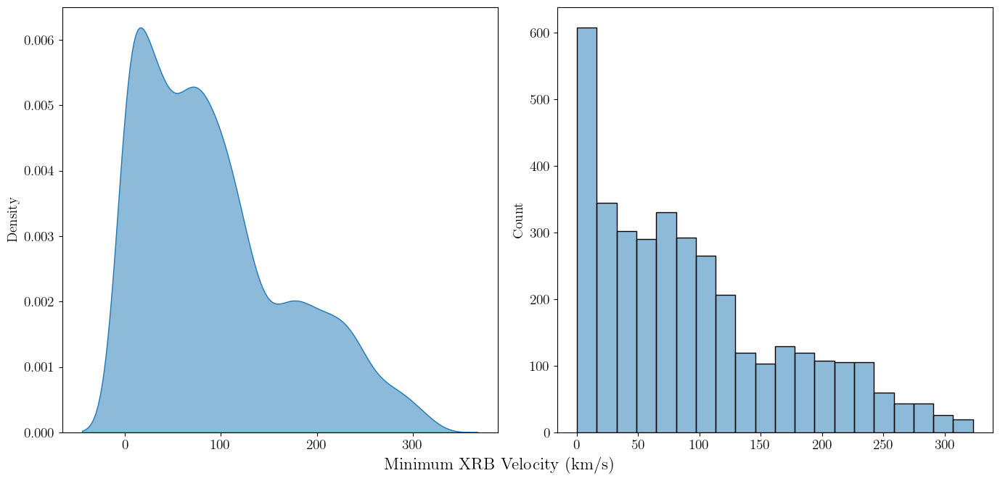

In [32]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(14, 7))

sns.kdeplot(
    data=velocity,
    x='Min Cluster Velocity (km/s)',
    fill=True, 
    ax=ax[0], 
    alpha=0.5,
    # hue='Class',
    palette='bright'
)
ax[0].set(xlabel=None)
sns.histplot(
    data=velocity,
    bins=20,
    x='Min Cluster Velocity (km/s)',
    # hue='Class',
    legend=True,
    # kind='hist',
    palette='bright',
    alpha=0.5,
    ax=ax[1]
)
ax[1].set(xlabel=None)

# ax[1].hist(x=velocity['Cluster Separation (pc)'].values, bins=30)
# ax[1].set_ylabel('Counts')

fig.supxlabel("Minimum XRB Velocity (km/s)", x=0.5, y=0.05)
plt.tight_layout()
# plt.savefig(M66_dir+'M66_XRB_ejection_compact_association_cat_separation.png')
plt.show()

In [33]:
velocity.columns

Index(['CSC RA', 'CSC Dec', 'Auxiliary ID', 'Cluster ID', 'CSC ID', 'ID',
       'Class', 'JWST ID', 'HST ID', 'JWST RA', 'JWST Dec', 'F2000W ID',
       'F3000M ID', 'F3350M ID', 'F3600M ID', 'JWST X', 'JWST Y', 'HST X',
       'HST Y', 'F555W ID', 'F275W ID', 'F336W ID', 'F438W ID', 'F814W ID',
       'HST RA', 'HST Dec', 'F2000W', 'F2000W Err', 'F3000M', 'F3000M Err',
       'F3350M', 'F3350M Err', 'F3600M', 'F3600M Err', 'F275W', 'F275W Err',
       'F438W', 'F438W Err', 'F555W', 'F555W Err', 'F814W', 'F814W Err',
       'logAge', 'Star Age (Myr)', 'Star Age (s)', 'Mass', 'Test Statistic',
       '2 Sig (arcsec)', '2 Sig (km)', '2 Sig (pix)', 'Cluster RA',
       'Cluster Dec', 'Cluster Separation (arcsecs)',
       'Cluster Separation (pc)', 'Cluster Separation (km)', 'Cluster CI',
       'Cluster Age (Myr)', 'Cluster Age Err (Myr)', 'Cluster Mass (M_sun)',
       'Cluster Mass Err (M_sun)', 'Cluster EBV', 'Cluster EBV Err',
       'Cluster Test Statistic', 'Cluster FWHM', 'Cluste

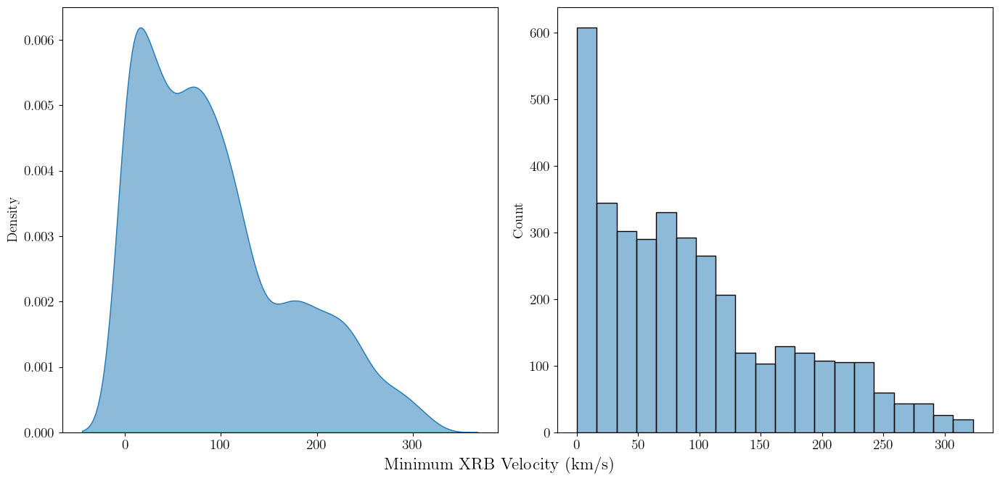

In [34]:
temp = velocity.query('`Min Cluster Velocity (km/s)` < 100000').reset_index(drop=True)
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(14, 7))

sns.kdeplot(
    data=temp,
    x='Min Cluster Velocity (km/s)',
    fill=True, 
    ax=ax[0], 
    alpha=0.5,
    # hue='Class',
    palette='bright'
)
ax[0].set(xlabel=None)
sns.histplot(
    data=temp,
    bins=20,
    x='Min Cluster Velocity (km/s)',
    # hue='Class',
    legend=True,
    palette='bright',
    alpha=0.5,
    ax=ax[1]
)
ax[1].set(xlabel=None)

# ax[1].hist(x=velocity['Cluster Separation (pc)'].values, bins=30)
# ax[1].set_ylabel('Counts')

fig.supxlabel("Minimum XRB Velocity (km/s)", x=0.5, y=0.05)
plt.tight_layout()
# plt.savefig(M66_dir+'M66_XRB_ejection_compact_association_cat_separation.png')
plt.show()

## Escape Velocity

In [35]:
# effective radius of a cluster in km
r_eff = velocity['Cluster Radius Eff (pc)'].values * u.pc
r_h = (4 / 3 * r_eff).to(u.km)
velocity['Cluster half-mass Radius (km)'] = r_h.value

# Now finding the escape velocities
from astropy.constants import G
M = velocity['Cluster Mass (M_sun)'].values * u.Msun # Mass of the cluster
v_esc = np.sqrt(2 * G * M / r_h)
v_esc = v_esc.to(u.km/u.s)
velocity['XRB escape velocity (km/s)'] = v_esc.value

In [36]:
display(velocity)

,CSC RA,CSC Dec,Auxiliary ID,Cluster ID,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,logAge,Star Age (Myr),Star Age (s),Mass,Test Statistic,2 Sig (arcsec),2 Sig (km),2 Sig (pix),Cluster RA,Cluster Dec,Cluster Separation (arcsecs),Cluster Separation (pc),Cluster Separation (km),Cluster CI,Cluster Age (Myr),Cluster Age Err (Myr),Cluster Mass (M_sun),Cluster Mass Err (M_sun),Cluster EBV,Cluster EBV Err,Cluster Test Statistic,Cluster FWHM,Cluster Radius Eff (pix),Cluster Radius Eff (arcsec),Cluster Radius Eff (pc),XRB-Parent Test Statistic,Min Cluster Velocity (km/s),Cluster half-mass Radius (km),XRB escape velocity (km/s)
0,170.062259,12.992633,2CXO J112014.9+125933-3.0-2.0,6740,2CXO J112014.9+125933,CXO003,HMXB,3.0,2.0,170.062307,12.992623,194908.0,45185.0,nan,nan,3105.251503,5907.752641,3743.843919,5833.507868,19247.0,130956.0,nan,36055.0,nan,170.062292,12.992626,-12.159049,-0.904646,-13.902257,-0.287522,nan,nan,nan,nan,-2.974469,-1.372681,-7.711479,-0.896442,-8.481385,-0.973168,nan,nan,6.68,4.786301,151044170014808.8125,31.619,36.436988,0.235415,329792523495880.9375,5.941826,170.061849,12.987713,17.769856,808.528449,2.494858e+16,1.613909,5.0,153.0,32159.451166,67739.414328,0.80,0.50,23.386633,0.96,1.4208,0.056832,3.113757,0.241329,165.174075,1.281073e+14,8.162781
1,170.062259,12.992633,2CXO J112014.9+125933-3.0-2.0,6788,2CXO J112014.9+125933,CXO003,HMXB,3.0,2.0,170.062307,12.992623,194908.0,45185.0,nan,nan,3105.251503,5907.752641,3743.843919,5833.507868,19247.0,130956.0,nan,36055.0,nan,170.062292,12.992626,-12.159049,-0.904646,-13.902257,-0.287522,nan,nan,nan,nan,-2.974469,-1.372681,-7.711479,-0.896442,-8.481385,-0.973168,nan,nan,6.68,4.786301,151044170014808.8125,31.619,36.436988,0.235415,329792523495880.9375,5.941826,170.061836,12.987976,16.830950,765.808229,2.363037e+16,1.423196,890.0,120.0,174363.656114,17070.864641,0.00,0.01,3.086535,0.39,0.5772,0.023088,1.264964,5000748.752251,156.446772,5.204361e+13,29.820513
2,170.062259,12.992633,2CXO J112014.9+125933-3.0-2.0,6969,2CXO J112014.9+125933,CXO003,HMXB,3.0,2.0,170.062307,12.992623,194908.0,45185.0,nan,nan,3105.251503,5907.752641,3743.843919,5833.507868,19247.0,130956.0,nan,36055.0,nan,170.062292,12.992626,-12.159049,-0.904646,-13.902257,-0.287522,nan,nan,nan,nan,-2.974469,-1.372681,-7.711479,-0.896442,-8.481385,-0.973168,nan,nan,6.68,4.786301,151044170014808.8125,31.619,36.436988,0.235415,329792523495880.9375,5.941826,170.058290,12.988918,19.306475,878.444618,2.710597e+16,1.750547,500.0,77.0,69972.213290,11389.178992,0.10,0.09,1.464285,1.91,2.8268,0.113072,6.195079,2797750.365946,179.457232,2.548802e+14,8.536219
3,170.062259,12.992633,2CXO J112014.9+125933-3.0-2.0,7009,2CXO J112014.9+125933,CXO003,HMXB,3.0,2.0,170.062307,12.992623,194908.0,45185.0,nan,nan,3105.251503,5907.752641,3743.843919,5833.507868,19247.0,130956.0,nan,36055.0,nan,170.062292,12.992626,-12.159049,-0.904646,-13.902257,-0.287522,nan,nan,nan,nan,-2.974469,-1.372681,-7.711479,-0.896442,-8.481385,-0.973168,nan,nan,6.68,4.786301,151044170014808.8125,31.619,36.436988,0.235415,329792523495880.9375,5.941826,170.057680,12.989119,20.444914,930.243609,2.870432e+16,1.763707,158.0,48.0,206060.938059,14694.145980,0.01,0.09,0.208602,1.91,2.8268,0.113072,6.195079,454936.365505,190.039235,2.548802e+14,14.648750
4,170.062259,12.992633,2CXO J112014.9+125933-3.0-2.0,7020,2CXO J112014.9+125933,CXO003,HMXB,3.0,2.0,170.062307,12.992623,194908.0,45185.0,nan,nan,3105.251503,5907.752641,3743.843919,5833.507868,19247.0,130956.0,nan,36055.0,nan,170.062292,12.992626,-12.159049,-0.904646,-13.902257,-0.287522,nan,nan,nan,nan,-2.974469,-1.372681,-7.711479,-0.896442,-8.481385,-0.973168,nan,nan,6.68,4.786301,151044170014808.8125,31.619,36.436988,0.235415,329792523495880.9375,5.

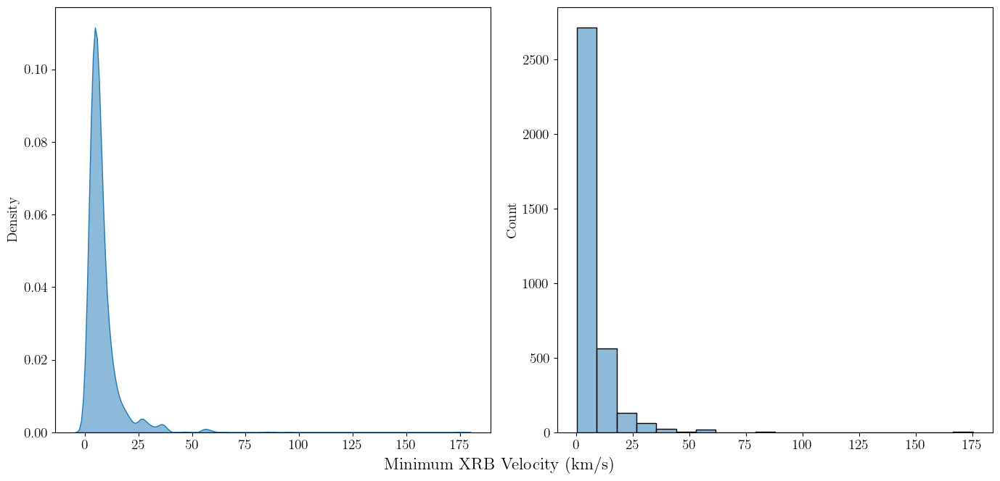

In [37]:
temp = velocity.query('`Min Cluster Velocity (km/s)` < 100000').reset_index(drop=True)
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(14, 7))

sns.kdeplot(
    data=velocity,
    x='XRB escape velocity (km/s)',
    fill=True, 
    ax=ax[0], 
    alpha=0.5,
    # hue='Class',
    palette='bright'
)
ax[0].set(xlabel=None)
sns.histplot(
    data=velocity,
    bins=20,
    x='XRB escape velocity (km/s)',
    # hue='Class',
    legend=True,
    palette='bright',
    alpha=0.5,
    ax=ax[1]
)
ax[1].set(xlabel=None)

# ax[1].hist(x=velocity['Cluster Separation (pc)'].values, bins=30)
# ax[1].set_ylabel('Counts')

fig.supxlabel("Minimum XRB Velocity (km/s)", x=0.5, y=0.05)
plt.tight_layout()
# plt.savefig(M66_dir+'M66_XRB_ejection_compact_association_cat_separation.png')
plt.show()

# Plots

# XRB Lx vs Distance

In [38]:
velocity = velocity.merge(M66_best[['CSC ID', 'LogLx']], on='CSC ID', how='left')

<Axes: xlabel='Cluster Separation (pc)', ylabel='LogLx'>

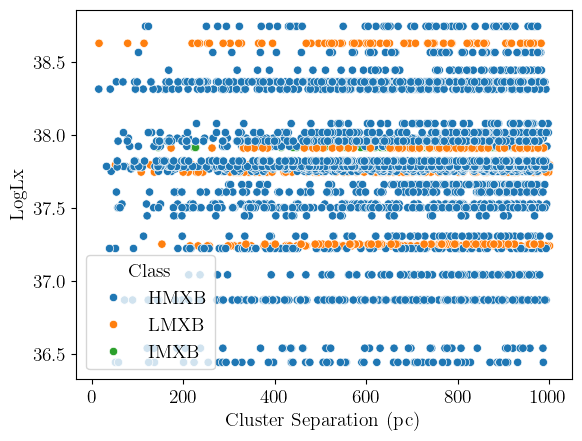

In [39]:
sns.scatterplot(
    data=velocity, 
    x="Cluster Separation (pc)", 
    y="LogLx",
    hue='Class'
)

Text(0.5, 0, 'Minimum Cluster Velocity (km/s)')

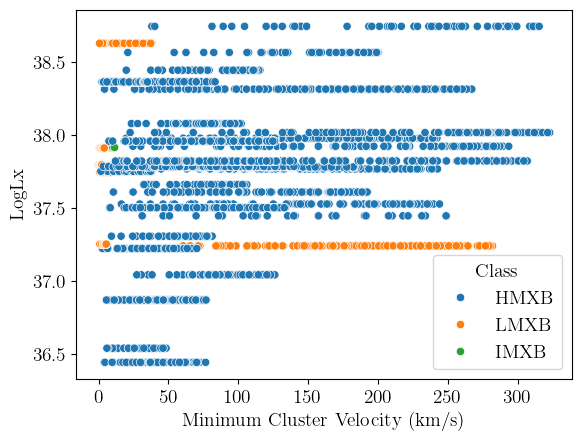

In [40]:
sns.scatterplot(
    data=velocity, 
    x="Min Cluster Velocity (km/s)", 
    y="LogLx",
    hue='Class'
)
plt.xlabel('Minimum Cluster Velocity (km/s)')

Text(0.5, 0, 'Minimum Cluster Velocity (km/s)')

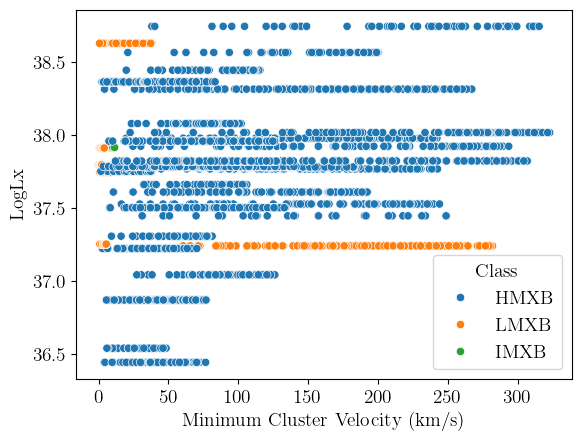

In [41]:
sns.scatterplot(
    data=velocity.query('`Min Cluster Velocity (km/s)` < 10000').reset_index(drop=True), 
    x="Min Cluster Velocity (km/s)", 
    y="LogLx",
    hue='Class'
)
plt.xlabel('Minimum Cluster Velocity (km/s)')

# XRB donor star age vs Cluster age

(-20.0, 450.0)

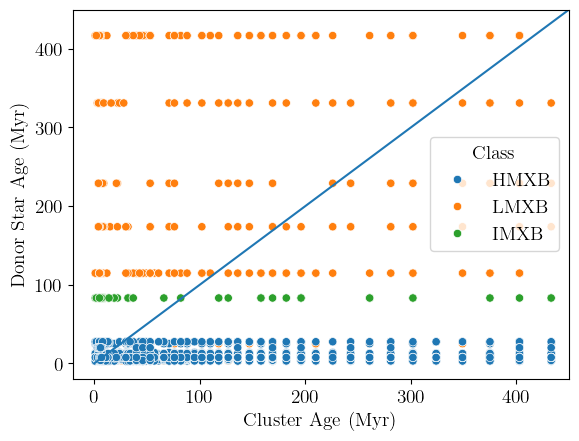

In [42]:
sns.scatterplot(
    data=parent_cluster,
    x='Cluster Age (Myr)',
    y='Star Age (Myr)',
    hue='Class'
)
x = np.linspace(0, 500)
y = x
plt.plot(x, y)
plt.ylabel('Donor Star Age (Myr)')
# plt.errorbar(
#     x=parent_cluster['Cluster Age (Myr)'],
#     y=parent_cluster['Star Age (Myr)'],
#     xerr=parent_cluster['Cluster Age Err (Myr)'],
#     linestyle='None'
# )
plt.xlim(-20, 450)
plt.ylim(-20, 450)

In [43]:
clustercat

,Cluster ID,Cluster CI,Cluster Age (Myr),Cluster Age Err (Myr),Cluster Mass (M_sun),Cluster Mass Err (M_sun),Cluster EBV,Cluster EBV Err,Cluster Test Statistic,Cluster FWHM,Cluster Radius Eff (pix),Cluster Radius Eff (arcsec),Cluster Radius Eff (pc)
0,14,1.440696,1.0,1.0,8719.629994,2694.287932,0.31,0.04,0.155719,0.48,0.7104,0.028416,1.556879
1,46,1.652545,2440.0,1412.0,435789.158150,132243.181503,0.15,0.17,0.675790,1.32,1.9536,0.078144,4.281416
2,55,1.554934,182.0,28.0,17467.385090,2360.828542,0.00,0.01,0.798219,0.96,1.4208,0.056832,3.113757
3,68,1.723422,210.0,0.0,80145.110419,9281.609214,0.01,0.03,0.181574,1.55,2.2940,0.091760,5.027420
4,90,1.869660,500.0,151.0,55569.664342,1130.107884,0.00,0.10,0.702583,2.50,3.7000,0.148000,8.108742
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2707,10668,1.837798,1028.0,625.0,15243.314080,6490.579020,0.04,0.37,0.141133,1.32,1.9536,0.078144,4.281416
2708,10670,1.626464,5.0,2.0,8629.588626,2126.057035,0.92,0.13,0.060492,1.18,1.7464,0.069856,3.827326
2709,10671,1.739450,118.0,347.0,11339.952560,1688.263020,0.35,0.24,0.026141,1.55,2.2940,0.091760,5.027420
2710,10672,1.906561,667.0,557.0,15856.958755,2760.559736,0.08,0.33,0.046162,3.09,4.5732,0.182928,10.022406


In [44]:
clustercat['Cluster Age Err (Myr)'].max()

13744.0

In [45]:
count = 0
for i,id in enumerate(clustercat['Cluster ID'].values):
    try: count += clustercat["Cluster Age Err (Myr)"][i] != Find(cluster_cat, f"ID_PHANGS_CLUSTERS = {id}")["PHANGS_AGE_MINCHISQ_ERR"][0]
    except: pass;

count


0

In [46]:
Find(clustercat, 'Cluster Age Err (Myr) == 13744.0')

,Cluster ID,Cluster CI,Cluster Age (Myr),Cluster Age Err (Myr),Cluster Mass (M_sun),Cluster Mass Err (M_sun),Cluster EBV,Cluster EBV Err,Cluster Test Statistic,Cluster FWHM,Cluster Radius Eff (pix),Cluster Radius Eff (arcsec),Cluster Radius Eff (pc)
0,8059,1.559057,13750.0,13744.0,1.349085e+06,1.305569e+06,0.48,0.91,1.012172,0.77,1.1396,0.045584,2.497493


In [47]:
cluster_cat = remove_unnamed(pd.read_csv(M66_dir+'ngc3627_cluster_catalog/M66_phangs_wfc3_cluster_catalog.frame'))
cluster_cat
Find(cluster_cat, 'ID_PHANGS_CLUSTERS == 8059')

,INDEX,ID_PHANGS_CLUSTERS,PHANGS_X,PHANGS_Y,PHANGS_RA,PHANGS_DEC,PHANGS_CLUSTER_CLASS_HUMAN,PHANGS_CLUSTER_CLASS_ML_VGG,PHANGS_CLUSTER_CLASS_ML_VGG_QUAL,PHANGS_F275W_VEGA_TOT,PHANGS_F275W_VEGA_TOT_ERR,PHANGS_F336W_VEGA_TOT,PHANGS_F336W_VEGA_TOT_ERR,PHANGS_F438W_VEGA_TOT,PHANGS_F438W_VEGA_TOT_ERR,PHANGS_F555W_VEGA_TOT,PHANGS_F555W_VEGA_TOT_ERR,PHANGS_F814W_VEGA_TOT,PHANGS_F814W_VEGA_TOT_ERR,PHANGS_F275W_mJy_TOT,PHANGS_F275W_mJy_TOT_ERR,PHANGS_F336W_mJy_TOT,PHANGS_F336W_mJy_TOT_ERR,PHANGS_F438W_mJy_TOT,PHANGS_F438W_mJy_TOT_ERR,PHANGS_F555W_mJy_TOT,PHANGS_F555W_mJy_TOT_ERR,PHANGS_F814W_mJy_TOT,PHANGS_F814W_mJy_TOT_ERR,PHANGS_CI,PHANGS_AGE_MINCHISQ,PHANGS_AGE_MINCHISQ_ERR,PHANGS_MASS_MINCHISQ,PHANGS_MASS_MINCHISQ_ERR,PHANGS_EBV_MINCHISQ,PHANGS_EBV_MINCHISQ_ERR,PHANGS_REDUCED_MINCHISQ,NO_DETECTION_FLAG,RA,Dec


In [48]:
cluster_cat

,INDEX,ID_PHANGS_CLUSTERS,PHANGS_X,PHANGS_Y,PHANGS_RA,PHANGS_DEC,PHANGS_CLUSTER_CLASS_HUMAN,PHANGS_CLUSTER_CLASS_ML_VGG,PHANGS_CLUSTER_CLASS_ML_VGG_QUAL,PHANGS_F275W_VEGA_TOT,PHANGS_F275W_VEGA_TOT_ERR,PHANGS_F336W_VEGA_TOT,PHANGS_F336W_VEGA_TOT_ERR,PHANGS_F438W_VEGA_TOT,PHANGS_F438W_VEGA_TOT_ERR,PHANGS_F555W_VEGA_TOT,PHANGS_F555W_VEGA_TOT_ERR,PHANGS_F814W_VEGA_TOT,PHANGS_F814W_VEGA_TOT_ERR,PHANGS_F275W_mJy_TOT,PHANGS_F275W_mJy_TOT_ERR,PHANGS_F336W_mJy_TOT,PHANGS_F336W_mJy_TOT_ERR,PHANGS_F438W_mJy_TOT,PHANGS_F438W_mJy_TOT_ERR,PHANGS_F555W_mJy_TOT,PHANGS_F555W_mJy_TOT_ERR,PHANGS_F814W_mJy_TOT,PHANGS_F814W_mJy_TOT_ERR,PHANGS_CI,PHANGS_AGE_MINCHISQ,PHANGS_AGE_MINCHISQ_ERR,PHANGS_MASS_MINCHISQ,PHANGS_MASS_MINCHISQ_ERR,PHANGS_EBV_MINCHISQ,PHANGS_EBV_MINCHISQ_ERR,PHANGS_REDUCED_MINCHISQ,NO_DETECTION_FLAG,RA,Dec
0,1,14,6614.89,3239.51,170.066136,12.939566,1.0,2,0.9,20.644782,0.026597,20.939790,0.030189,22.250655,0.031346,22.278594,0.016876,22.110648,0.039019,0.004895,0.000120,0.005149,0.000143,0.005185,0.000150,0.004488,0.000070,0.003450,0.000124,1.440696,1.0,1.0,8719.629994,2694.287932,0.31,0.04,0.155719,0.0,170.066141,12.939562
1,2,46,7284.40,3396.34,170.058575,12.941292,1.0,1,0.8,24.105332,0.370370,22.714208,0.089647,22.519652,0.027672,21.668955,0.009359,20.217371,0.008529,0.000202,0.000069,0.001005,0.000083,0.004047,0.000103,0.007869,0.000068,0.019730,0.000155,1.652545,2440.0,1412.0,435789.158150,132243.181503,0.15,0.17,0.675790,0.0,170.058580,12.941288
2,3,55,6620.99,3457.63,170.066067,12.941966,1.0,1,1.0,22.281919,0.077378,22.221694,0.061685,22.469884,0.027247,22.442269,0.014601,21.988124,0.029593,0.001084,0.000077,0.001581,0.000090,0.004237,0.000106,0.003860,0.000052,0.003862,0.000105,1.554934,182.0,28.0,17467.385090,2360.828542,0.00,0.01,0.798219,0.0,170.066072,12.941963
3,4,68,6698.34,3482.21,170.065193,12.942237,1.0,1,1.0,20.826262,0.026111,20.815261,0.022290,21.009604,0.010733,20.914521,0.006501,20.380509,0.009989,0.004141,0.000100,0.005775,0.000119,0.016263,0.000161,0.015766,0.000094,0.016978,0.000156,1.723422,210.0,0.0,80145.110419,9281.609214,0.01,0.03,0.181574,0.0,170.065198,12.942233
4,5,90,6745.89,3520.91,170.064656,12.942663,1.0,1,1.0,22.925218,0.134522,22.279132,0.066309,22.105465,0.022063,21.881796,0.012212,21.189384,0.016662,0.000599,0.000074,0.001500,0.000092,0.005927,0.000121,0.006468,0.000073,0.008060,0.000124,1.869660,500.0,151.0,55569.664342,1130.107884,0.00,0.10,0.702583,0.0,170.064661,12.942659
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
769,770,10586,6948.57,10474.60,170.062368,13.019192,1.0,1,1.0,24.035996,0.327509,22.592605,0.089407,22.445723,0.027915,21.710779,0.015843,20.390391,0.013467,0.000215,0.000065,0.001124,0.000093,0.004333,0.000112,0.007572,0.000111,0.016824,0.000209,1.918178,2440.0,1903.0,313359.153368,166080.309093,0.05,0.02,0.552583,0.0,170.062373,13.019188
770,771,10588,7652.35,10475.41,170.054418,13.019201,1.0,1,1.0,-999.000000,-999.000000,23.750919,0.238751,22.916678,0.037355,22.376106,0.022763,21.378458,0.024224,-999.000000,-999.000000,0.000387,0.000085,0.002808,0.000097,0.004103,0.000086,0.006772,0.000151,1.766977,577.0,313.0,78050.953887,14334.049089,0.25,0.06,1.785513,1.0,170.054423,13.019197
771,772,10604,7564.38,10544.56,170.055412,13.019962,1.0,1,1.0,22.309889,0.079582,22.273963,0.063365,22.513126,0.027613,22.459880,0.023643,22.166422,0.048225,0.001056,0.000077,0.001507,0.000088,0.004072,0.000104,0.003798,0.000083,0.003277,0.000146,1.554051,182.0,35.0,16453.259019,2658.032012,0.00,0.00,2.090234,0.0,170.055417,13.019958
772,773,10665,6132.20,10861.57,170.071589,13.023451,1.0,1,1.0,24.321418,0.464568,22.917070,0.109558,22.758682,0.034490,22.408541,0.023065,21.715242,0.029941,0.000166,0.000071,0.000833,0.000084,0.003248,0.000103,0.003982,0.000085,0.004966,0.000137,1.658193,667.0,50.0,40800.976507,6367.856392,0.00,0.03,1.468957,0.0,170.071595,13.023447


# Stellar Age vs Cluster Age

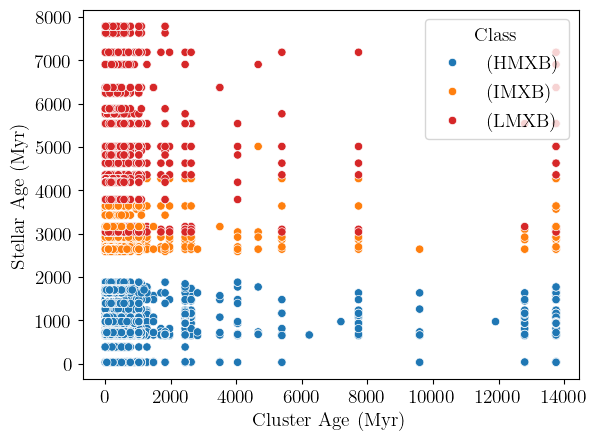

In [49]:
temp = remove_unnamed(pd.read_csv("/Users/undergradstudent/Downloads/temp_all_info.txt"))
temp['Class'] = ''
for index, row in temp.iterrows():
    if temp['Star Mass (M_sun)'][index] <= 3.0:
        temp['Class'][index] = "(LMXB)"
    elif 8.0 >= temp['Star Mass (M_sun)'][index] >= 3.0:
        temp['Class'][index] = "(IMXB)"
    elif temp['Star Mass (M_sun)'][index] >= 8.0:
        temp['Class'][index] = "(HMXB)"
ax = sns.scatterplot(
    data=temp,
    x='Cluster Age (Myr)',
    y='Star Age (Myr)',
    hue='Class',
    legend=True
)
ax.set_ylabel("Stellar Age (Myr)")
sns.move_legend(ax, "upper right")

# Looking at all the info

In [50]:
velocity.columns

Index(['CSC RA', 'CSC Dec', 'Auxiliary ID', 'Cluster ID', 'CSC ID', 'ID',
       'Class', 'JWST ID', 'HST ID', 'JWST RA', 'JWST Dec', 'F2000W ID',
       'F3000M ID', 'F3350M ID', 'F3600M ID', 'JWST X', 'JWST Y', 'HST X',
       'HST Y', 'F555W ID', 'F275W ID', 'F336W ID', 'F438W ID', 'F814W ID',
       'HST RA', 'HST Dec', 'F2000W', 'F2000W Err', 'F3000M', 'F3000M Err',
       'F3350M', 'F3350M Err', 'F3600M', 'F3600M Err', 'F275W', 'F275W Err',
       'F438W', 'F438W Err', 'F555W', 'F555W Err', 'F814W', 'F814W Err',
       'logAge', 'Star Age (Myr)', 'Star Age (s)', 'Mass', 'Test Statistic',
       '2 Sig (arcsec)', '2 Sig (km)', '2 Sig (pix)', 'Cluster RA',
       'Cluster Dec', 'Cluster Separation (arcsecs)',
       'Cluster Separation (pc)', 'Cluster Separation (km)', 'Cluster CI',
       'Cluster Age (Myr)', 'Cluster Age Err (Myr)', 'Cluster Mass (M_sun)',
       'Cluster Mass Err (M_sun)', 'Cluster EBV', 'Cluster EBV Err',
       'Cluster Test Statistic', 'Cluster FWHM', 'Cluste

	2CXO J112018.8+125924, 27	2CXO J112016.7+125830

In [51]:
velocity[['CSC ID', 'Class', 'Cluster ID', 'Cluster Separation (pc)',
          'Cluster Separation (km)', 'Star Age (Myr)', 'Star Age (s)',
          'Cluster Age (Myr)','Cluster Age Err (Myr)','Star Age (s)',
          'Cluster Mass (M_sun)', 'Min Cluster Velocity (km/s)', 
          'XRB escape velocity (km/s)', 'Test Statistic']].iloc[[31]]

,CSC ID,Class,Cluster ID,Cluster Separation (pc),Cluster Separation (km),Star Age (Myr),Star Age (s),Cluster Age (Myr),Cluster Age Err (Myr),Star Age (s),Cluster Mass (M_sun),Min Cluster Velocity (km/s),XRB escape velocity (km/s),Test Statistic
31,2CXO J112014.9+125933,HMXB,6588,962.017703,2.968476e+16,4.786301,151044170014808.8125,1.0,4.0,151044170014808.8125,13513.270462,196.530356,3.278911,36.436988


2CXO J112019.5+125958


,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID,logAge,Star Age (Myr),Mass,Test Statistic,CSC RA,CSC Dec,2 Sig (arcsec),2 Sig (pix)
0,2CXO J112019.5+125958,CXO047,HMXB,9.0,1.0,170.081608,12.999365,244795.0,NaN,NaN,NaN,903.458791,6697.090415,2033.527984,6447.470681,24140.0,NaN,114984.0,43873.0,23724.0,170.08161,12.999382,-9.680275,-0.169765,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-6.536957,-0.100646,-6.74558,-0.111699,-7.376535,-0.160387,2CXO J112019.5+125958-9.0-1.0,7.1,12.589254,15.021,52.798197,170.081516,12.999423,0.832043,21.000582


,Auxiliary ID,CSC ID,Class,logAge,Star Age (Myr),Mass,Test Statistic
0,2CXO J112019.5+125958-9.0-1.0,2CXO J112019.5+125958,HMXB,7.1,12.589254,15.021,52.798197


Finding best-fit model(s)...
DONE


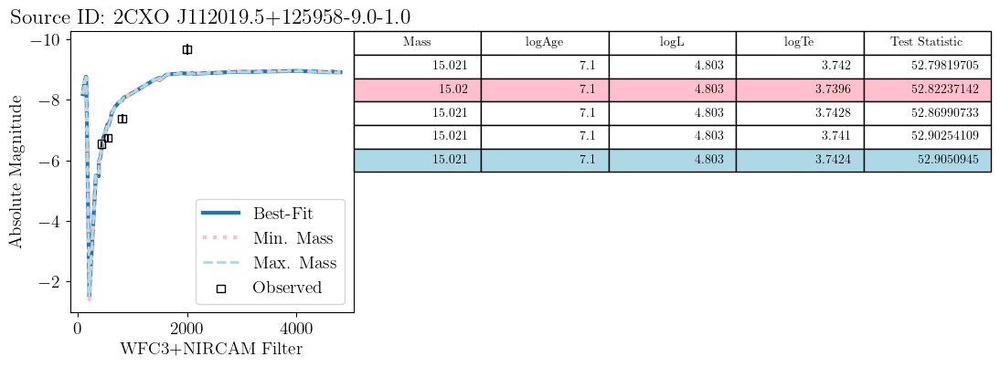

,Unnamed: 0,Zini,MH,logAge,Mini,int_IMF,Mass,logL,logTe,logg,label,McoreTP,C_O,period0,period1,period2,period3,period4,pmode,Mloss,tau1m,X,Y,Xc,Xn,Xo,Cexcess,Z,mbol,F390M,F410M,F467M,F547M,F621M,F689M,F763M,F845M,F098M,F127M,F139M,F153M,F218W,F225W,F275W,F336W,F390W,F438W,F475W,F555W,F606W,F625W,F775W,F814W,F105W,F110W,F125W,F140W,F160W,F700W,F900W,F1150W,F1500W,F2000W,F2770W,F3560W,F4440W,F1500W2,F3220W2,F1400M,F1620M,F1820M,F2100M,F2500M,F3000M,F3350M,F3600M,F4100M,F4300M,F4600M,F4800M,F1640N,F1870N,F2120N,F3230N,F4050N,F4660N,F4700N,Test Statistic,Auxiliary ID
0,51282,0.0152,0.01508,7.1,15.432424,2.629347,15.020,4.803,3.7396,0.722,1,0.0,0.399,0.0,0.0,0.0,0.0,0.0,-1,-5.050000e-07,0.0,0.6641,0.3206,0.001657,0.003005,0.00553,-1.0,0.0153,-7.237,-5.422,-6.015,-6.716,-7.178,-7.558,-7.784,-7.941,-8.087,-8.197,-8.568,-8.663,-8.784,-1.385,-1.796,-3.402,-5.457,-5.917,-6.270,-6.717,-7.090,-7.377,-7.555,-7.941,-7.993,-8.275,-8.378,-8.510,-8.651,-8.780,-7.8,-8.124,-8.398,-8.749,-8.893,-8.940,-8.962,-8.951,-8.666,-8.950,-8.677,-8.850,-8.884,-8.903,-8.913,-8.953,-8.960,-8.964,-8.971,-8.961,-8.926,-8.932,-8.868,-8.903,-8.887,-8.949,-8.984,-8.958,-8.928,52.822371,2CXO J112019.5+125958-9.0-1.0
1,51283,0.0152,0.01508,7.1,15.433179,2.629347,15.021,4.803,3.7410,0.728,1,0.0,0.399,0.0,0.0,0.0,0.0,0.0,-1,-5.040000e-07,0.0,0.6641,0.3206,0.001657,0.003005,0.00553,-1.0,0.0153,-7.238,-5.453,-6.036,-6.727,-7.184,-7.560,-7.784,-7.940,-8.085,-8.194,-8.562,-8.655,-8.775,-1.441,-1.851,-3.444,-5.484,-5.941,-6.287,-6.728,-7.097,-7.381,-7.557,-7.940,-7.992,-8.271,-8.373,-8.504,-8.643,-8.771,-7.8,-8.122,-8.393,-8.740,-8.882,-8.929,-8.952,-8.941,-8.658,-8.939,-8.669,-8.840,-8.874,-8.892,-8.904,-8.942,-8.949,-8.953,-8.961,-8.950,-8.918,-8.924,-8.858,-8.893,-8.876,-8.938,-8.973,-8.950,-8.919,52.902541,2CXO J112019.5+125958-9.0-1.0
2,51284,0.0152,0.01508,7.1,15.433688,2.629347,15.021,4.803,3.7420,0.731,1,0.0,0.399,0.0,0.0,0.0,0.0,0.0,-1,-5.040000e-07,0.0,0.6641,0.3206,0.001657,0.003005,0.00553,-1.0,0.0153,-7.238,-5.476,-6.051,-6.735,-7.189,-7.561,-7.784,-7.939,-8.083,-8.191,-8.557,-8.649,-8.768,-1.482,-1.892,-3.476,-5.504,-5.958,-6.300,-6.736,-7.101,-7.383,-7.559,-7.939,-7.990,-8.268,-8.369,-8.499,-8.638,-8.765,-7.8,-8.120,-8.390,-8.733,-8.875,-8.922,-8.944,-8.934,-8.652,-8.931,-8.664,-8.833,-8.866,-8.885,-8.897,-8.934,-8.941,-8.945,-8.953,-8.943,-8.912,-8.917,-8.850,-8.885,-8.868,-8.930,-8.965,-8.943,-8.913,52.798197,2CXO J112019.5+125958-9.0-1.0
3,51285,0.0152,0.01508,7.1,15.433898,2.629347,15.021,4.803,3.7424,0.733,1,0.0,0.399,0.0,0.0,0.0,0.0,0.0,-1,-5.040000e-07,0.0,0.6641,0.3206,0.001657,0.003005,0.00553,-1.0,0.0153,-7.238,-5.485,-6.057,-6.738,-7.190,-7.562,-7.784,-7.939,-8.082,-8.190,-8.554,-8.647,-8.765,-1.498,-1.909,-3.489,-5.513,-5.965,-6.305,-6.740,-7.103,-7.384,-7.559,-7.938,-7.990,-8.266,-8.368,-8.497,-8.635,-8.762,-7.8,-8.119,-8.388,-8.731,-8.871,-8.918,-8.940,-8.931,-8.649,-8.928,-8.661,-8.830,-8.863,-8.882,-8.894,-8.931,-8.938,-8.942,-8.950,-8.940,-8.909,-8.915,-8.847,-8.882,-8.865,-8.927,-8.962,-8.941,-8.910,52.905095,2CXO J112019.5+125958-9.0-1.0
4,51286,0.0152,0.01508,7.1,15.434118,2.629347,15.021,4.803,3.7428,0.734,1,0.0,0.399,0.0,0.0,0.0,0.0,0.0,-1,-5.030000e-07,0.0,0.6641,0.3206,0.001657,0.003005,0.00553,-1.0,0.0153,-7.239,-5.495,-6.064,-6.741,-7.192,-7.563,-7.784,-7.938,-8.081,-8.189,-8.552,-8.644,-8.762,-1.516,-1.927,-3.503,-5.522,-5.973,-6.311,-6.743,-7.105,-7.385,-7.560,-7.938,-7.989,-8.265,-8.366,-8.495,-8.633,-8.759,-7.8,-8.118,-8.386,-8.728,-8.868,-8.915,-8.937,-8.928,-8.647,-8.925,-8.658,-8.827,-8.860,-8.878,-8.891,-8.928,-8.934,-8.939,-8.946,-8.937,-8.906,-8.912,-8.844,-8.878,-8.862,-8.923,-8.958,-8.938,-8.908,52.869907,2CXO J112019.5+125958-9.0-1.0


In [52]:
# csclist = M66_notes['CSC ID'].tolist()
cscid = "2CXO J112019.5+125958"
print(cscid)
display(M66_xrbs.query(f'`CSC ID` == "{cscid}"').reset_index(drop=True))
display(tempfit.query(f'`CSC ID` == "{cscid}"').reset_index(drop=True))
FitSED(
    df=M66_xrbs.query(f'`CSC ID` == "{cscid}"').reset_index(drop=True),
    instrument='wfc3+nircam',
    idheader='Auxiliary ID',
    min_models=5
)

##################### WFC3 + NIRCAM ###############################
Finding best-fit model(s)...
DONE


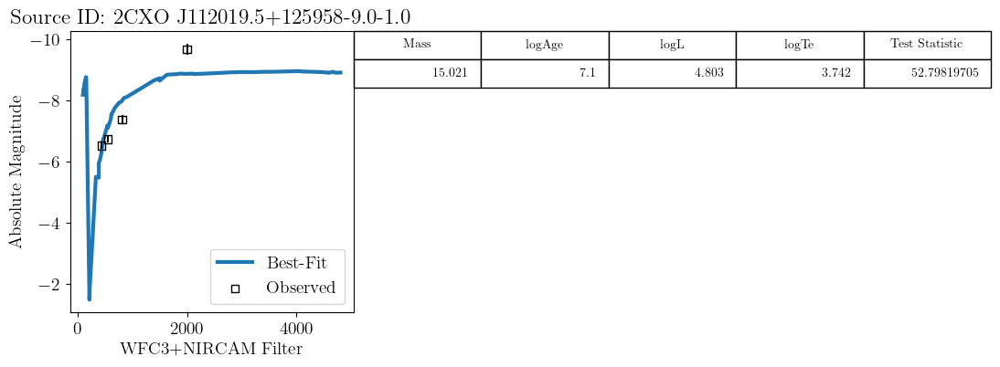

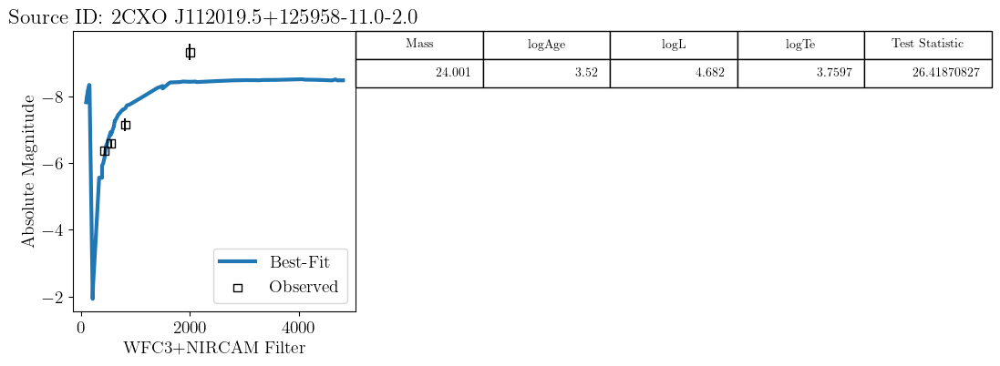

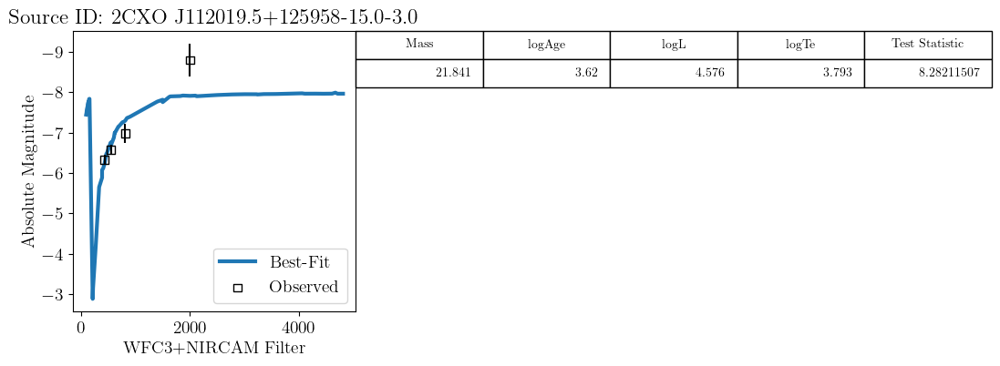

##################### WFC3 + NIRCAM ###############################
Finding best-fit model(s)...
DONE


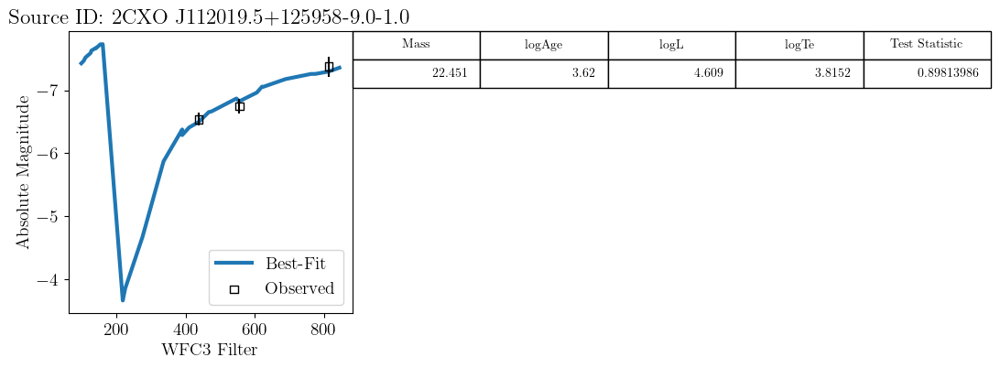

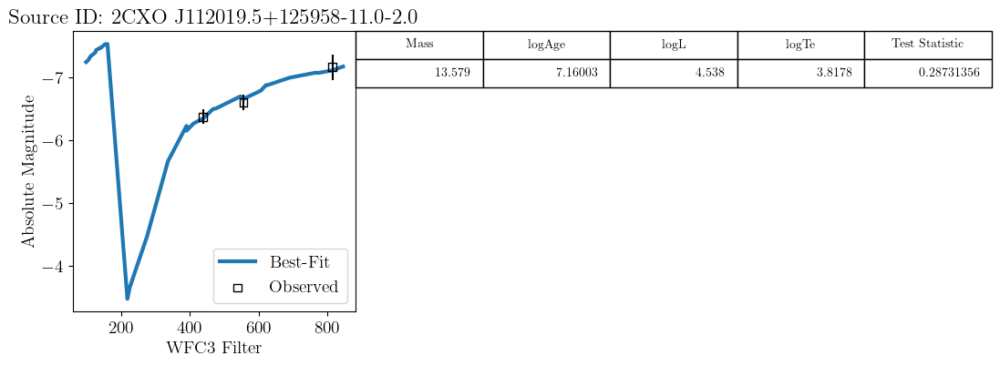

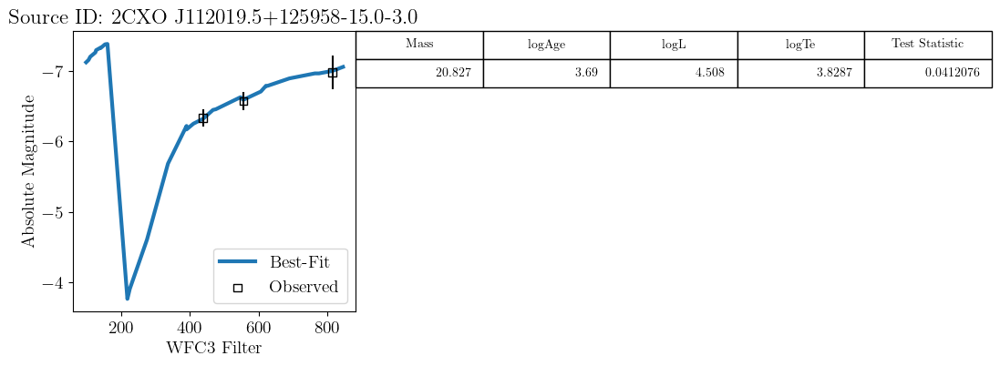

(<Figure size 600x400 with 1 Axes>,
 <Axes: xlabel='F555W - F814W', ylabel='F438W'>)

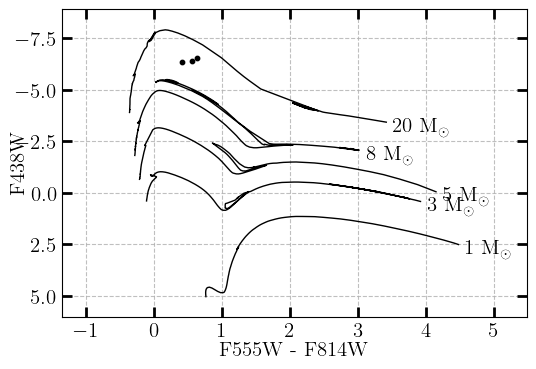

In [53]:
from XRBID.CMDs import MakeCMD

temp = M66_daoclean.query('`CSC ID` == "2CXO J112019.5+125958"').drop(columns=['F336W', 'F336W Err']).reset_index(drop=True)
print("##################### WFC3 + NIRCAM ###############################")
tempfit = FitSED(
    df=temp,
    instrument='wfc3+nircam',
    idheader='Auxiliary ID',
    # min_models=5
)

print("##################### WFC3 + NIRCAM ###############################")
FitSED(
    df=temp,
    instrument='wfc3',
    idheader='Auxiliary ID',
    # min_models=5
)

MakeCMD(
    sources=temp,
    instrument='wfc3',
    xcolor=['F555W', 'F814W'],
    ycolor='F438W'
)

In [54]:
temp

,JWST RA,JWST Dec,JWST ID,HST ID,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,CSC ID,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID
0,170.081608,12.999365,9.0,1.0,244795.0,NaN,NaN,NaN,903.458791,6697.090415,2CXO J112019.5+125958,2033.527984,6447.470681,24140.0,NaN,114984.0,43873.0,23724.0,170.081610,12.999382,-9.680275,-0.169765,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-6.536957,-0.100646,-6.745580,-0.111699,-7.376535,-0.160387,2CXO J112019.5+125958-9.0-1.0
1,170.081429,12.999398,11.0,2.0,245024.0,NaN,NaN,NaN,923.888013,6700.932831,2CXO J112019.5+125958,2050.820440,6449.156391,24147.0,NaN,115009.0,43885.0,23744.0,170.081415,12.999401,-9.336476,-0.241826,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-6.368705,-0.114843,-6.599518,-0.126428,-7.156636,-0.199201,2CXO J112019.5+125958-11.0-2.0
2,170.081446,12.999474,15.0,3.0,245597.0,NaN,NaN,NaN,921.840364,6709.771009,2CXO J112019.5+125958,2048.855626,6455.911540,24210.0,NaN,115223.0,43987.0,23799.0,170.081437,12.999475,-8.794556,-0.397466,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-6.332219,-0.119687,-6.570463,-0.130914,-6.973384,-0.237587,2CXO J112019.5+125958-15.0-3.0


(<Figure size 600x400 with 1 Axes>,
 <Axes: xlabel='F555W - F814W', ylabel='F438W'>)

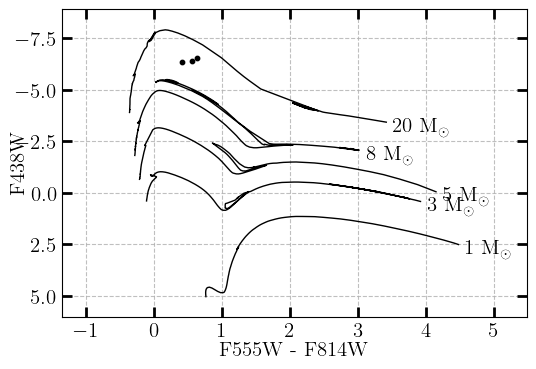

In [55]:
from XRBID.CMDs import MakeCMD

MakeCMD(
    sources=temp,
    instrument='wfc3',
    xcolor=['F555W', 'F814W'],
    ycolor='F438W'
)

In [56]:
M66_xrbs.query('`CSC ID` == "2CXO J112014.1+125923"')

,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID,logAge,Star Age (Myr),Mass,Test Statistic,CSC RA,CSC Dec,2 Sig (arcsec),2 Sig (pix)
7,2CXO J112014.1+125923,CXO012,LMXB,3.0,NaN,170.058784,12.989716,173327.0,40534.0,36971.0,42428.0,3507.120121,5567.361186,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-9.280691,-1.46272,-8.043054,-10.280138,-8.293276,-9.718285,-7.756413,-15.82994,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2CXO J112014.1+125923-3.0-nan,8.62001,416.878982,1.309,0.023351,170.058772,12.989771,0.361474,9.123531


In [57]:
from helpers.regions import make_regions
make_regions(
    sources=parent_cluster,
    hdu=f555w,
    reg_type='vector',
    outfile='/Users/undergradstudent/Downloads/parent_cluster_regions_final.reg',
    coordheads=['CSC RA', 'CSC Dec'],
    additional_coords=['Cluster RA', 'Cluster Dec'],
    coordsys='fk5',
    radunit='arcsec',
    idheader='Cluster Separation (pc)'
)

Saving /Users/undergradstudent/Downloads/parent_cluster_regions_final.reg
/Users/undergradstudent/Downloads/parent_cluster_regions_final.reg saved!


# Testing if all the ages match up properly

In [58]:
Find(M66_xrbs, f'CSC ID == 2CXO J112015.0+125936  ')

,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID,logAge,Star Age (Myr),Mass,Test Statistic,CSC RA,CSC Dec,2 Sig (arcsec),2 Sig (pix)
0,2CXO J112015.0+125936,CXO006,HMXB,2.0,1.0,170.062808,12.993437,200852.0,46417.0,42593.0,48557.0,3048.131145,6003.004427,3700.317585,5908.701948,19792.0,NaN,NaN,36916.0,NaN,170.062784,12.993454,NaN,184.978557,-11.584072,-1.756274,-12.044657,-1.388903,-12.183175,-1.228733,NaN,NaN,NaN,1.142291,NaN,1.536468,NaN,NaN,2CXO J112015.0+125936-2.0-1.0,6.92,8.317638,19.61,0.057004,170.062785,12.993429,0.243913,6.156299


In [59]:
M66_xrbs['Auxiliary ID'].values

array(['2CXO J112014.9+125933-3.0-2.0', '2CXO J112015.0+125936-2.0-1.0',
       '2CXO J112015.0+125921-7.0-1.0', '2CXO J112015.2+125921-7.0-3.0',
       '2CXO J112014.7+125937-7.0-1.0', '2CXO J112015.0+125938-6.0-1.0',
       '2CXO J112014.2+125927-3.0-nan', '2CXO J112014.1+125923-3.0-nan',
       '2CXO J112014.3+125918-4.0-nan', '2CXO J112015.3+125944-4.0-1.0',
       '2CXO J112015.8+125910-1.0-nan', '2CXO J112013.9+125913-3.0-nan',
       '2CXO J112013.4+125928-4.0-nan', '2CXO J112015.5+125955-7.0-nan',
       '2CXO J112015.8+125904-6.0-nan', '2CXO J112012.8+125947-4.0-1.0',
       '2CXO J112012.6+125947-4.0-nan', '2CXO J112016.8+125959-6.0-3.0',
       '2CXO J112017.1+130003-4.0-nan', '2CXO J112012.2+125952-6.0-nan',
       '2CXO J112012.0+125910-3.0-nan', '2CXO J112015.8+130019-2.0-nan',
       '2CXO J112016.6+125844-6.0-nan', '2CXO J112018.2+125959-1.0-nan',
       '2CXO J112018.8+125924-6.0-2.0', '2CXO J112013.7+130025-16.0-4.0',
       '2CXO J112012.3+125846-2.0-nan', '2CXO J112

####################   2CXO J112014.9+125933   #############################


,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID,logAge,Star Age (Myr),Mass,Test Statistic,CSC RA,CSC Dec,2 Sig (arcsec),2 Sig (pix)
0,2CXO J112014.9+125933,CXO003,HMXB,3.0,2.0,170.062307,12.992623,194908.0,45185.0,NaN,NaN,3105.251503,5907.752641,3743.843919,5833.507868,19247.0,130956.0,NaN,36055.0,NaN,170.062292,12.992626,-12.159049,-0.904646,-13.902257,-0.287522,NaN,NaN,NaN,NaN,-2.974469,-1.372681,-7.711479,-0.896442,-8.481385,-0.973168,NaN,NaN,2CXO J112014.9+125933-3.0-2.0,6.68,4.786301,31.619,36.436988,170.062259,12.992633,0.235415,5.941826


Finding best-fit model(s)...
DONE


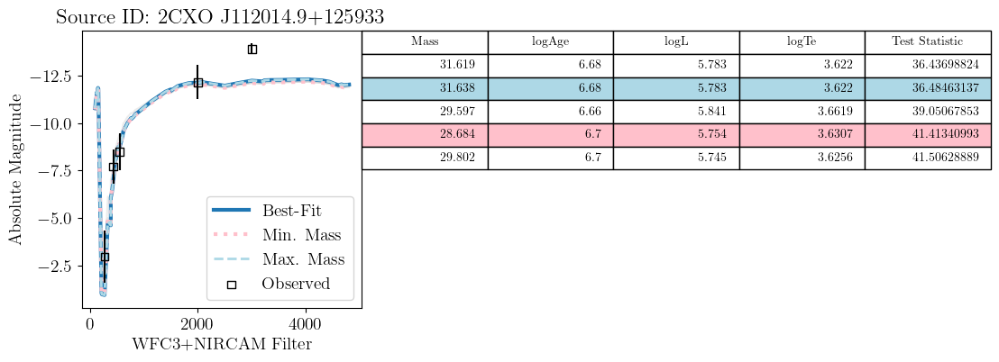

WFC3
Finding best-fit model(s)...
DONE


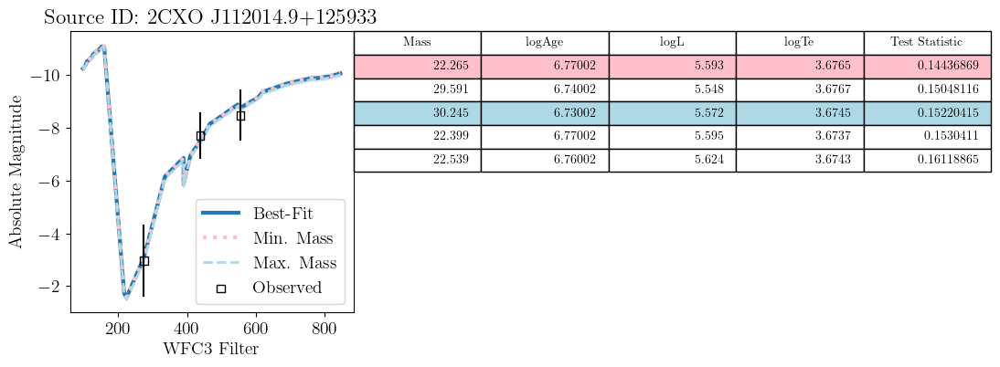

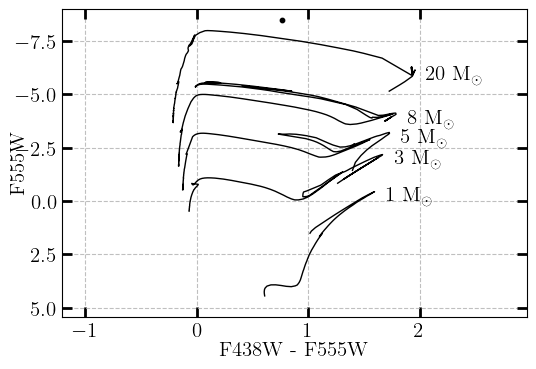

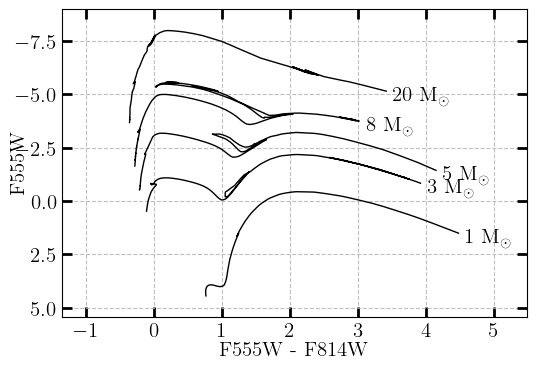

####################################################################
####################   2CXO J112015.0+125936   #############################


,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID,logAge,Star Age (Myr),Mass,Test Statistic,CSC RA,CSC Dec,2 Sig (arcsec),2 Sig (pix)
0,2CXO J112015.0+125936,CXO006,HMXB,2.0,1.0,170.062808,12.993437,200852.0,46417.0,42593.0,48557.0,3048.131145,6003.004427,3700.317585,5908.701948,19792.0,NaN,NaN,36916.0,NaN,170.062784,12.993454,NaN,184.978557,-11.584072,-1.756274,-12.044657,-1.388903,-12.183175,-1.228733,NaN,NaN,NaN,1.142291,NaN,1.536468,NaN,NaN,2CXO J112015.0+125936-2.0-1.0,6.92,8.317638,19.61,0.057004,170.062785,12.993429,0.243913,6.156299


Finding best-fit model(s)...
DONE


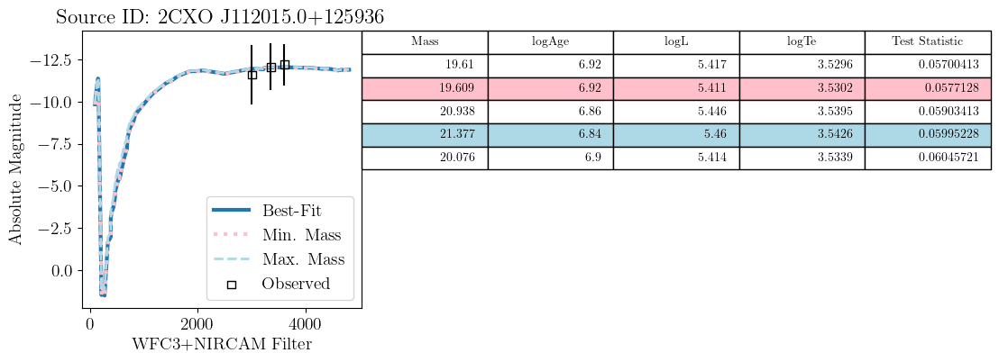

WFC3
Finding best-fit model(s)...
DONE
No best-fit model available for Source ID 2CXO J112015.0+125936.


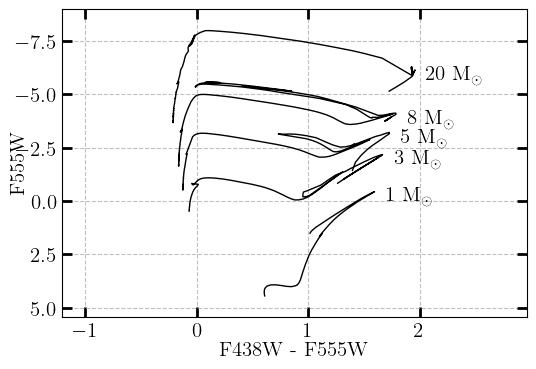

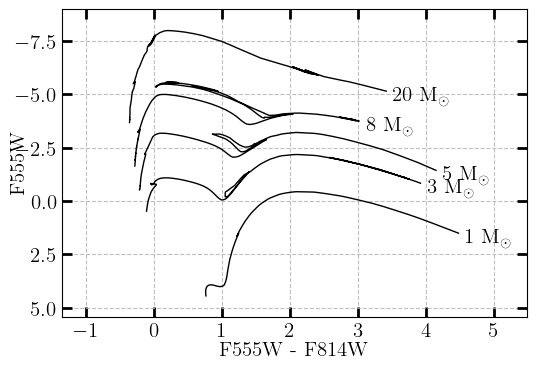

####################################################################
####################   2CXO J112015.0+125921   #############################


,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID,logAge,Star Age (Myr),Mass,Test Statistic,CSC RA,CSC Dec,2 Sig (arcsec),2 Sig (pix)
0,2CXO J112015.0+125921,CXO007,HMXB,7.0,1.0,170.062475,12.989191,169350.0,39698.0,36199.0,41583.0,3086.128147,5505.907098,3727.624318,5519.646556,16435.0,NaN,NaN,NaN,NaN,170.062475,12.989172,NaN,13.846357,-10.932239,-2.894194,-11.094335,-2.970991,-11.154931,-2.804088,NaN,NaN,NaN,NaN,-6.695964,-2.693151,NaN,NaN,2CXO J112015.0+125921-7.0-1.0,6.88,7.585776,22.278,0.003592,170.062538,12.989251,0.467468,11.798781


Finding best-fit model(s)...
DONE


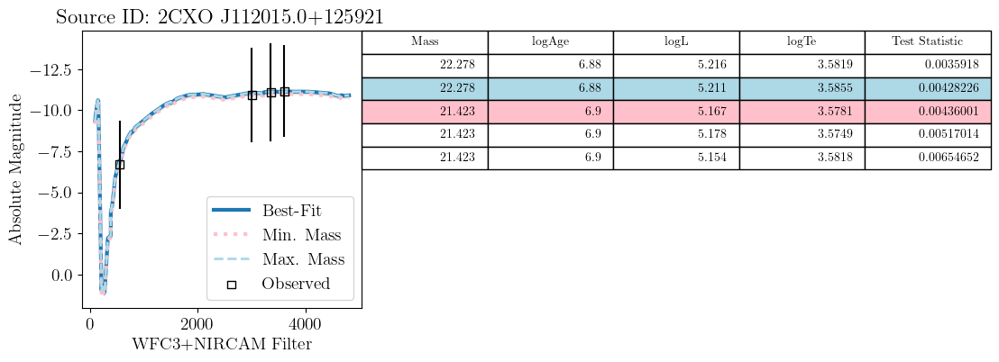

WFC3
Finding best-fit model(s)...
DONE
No best-fit model available for Source ID 2CXO J112015.0+125921.


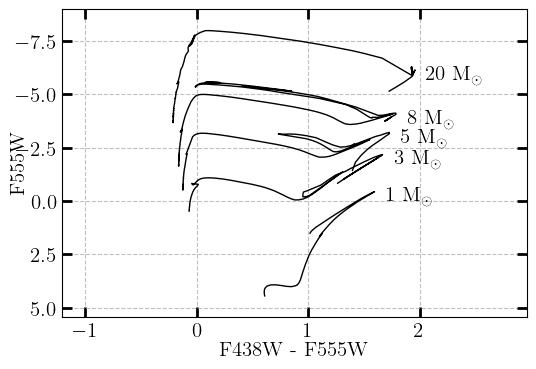

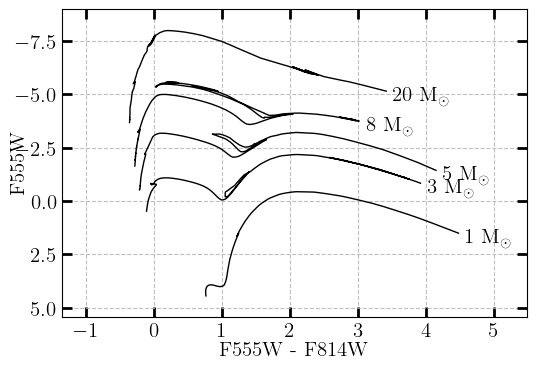

####################################################################
####################   2CXO J112015.2+125921   #############################


,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID,logAge,Star Age (Myr),Mass,Test Statistic,CSC RA,CSC Dec,2 Sig (arcsec),2 Sig (pix)
0,2CXO J112015.2+125921,CXO008,HMXB,7.0,3.0,170.063489,12.98946,171191.0,NaN,NaN,NaN,2970.358329,5537.339696,3640.75491,5546.285666,16686.0,NaN,NaN,NaN,NaN,170.063456,12.989465,-10.401179,-2.258856,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-6.551823,-3.289136,NaN,NaN,2CXO J112015.2+125921-7.0-3.0,6.96,9.120108,19.088,0.000272,170.063419,12.989393,0.375305,9.47261


Finding best-fit model(s)...
DONE


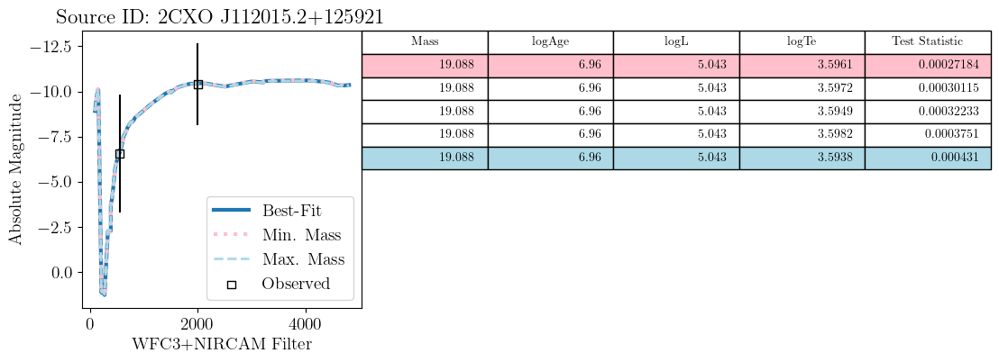

WFC3
Finding best-fit model(s)...
DONE
No best-fit model available for Source ID 2CXO J112015.2+125921.


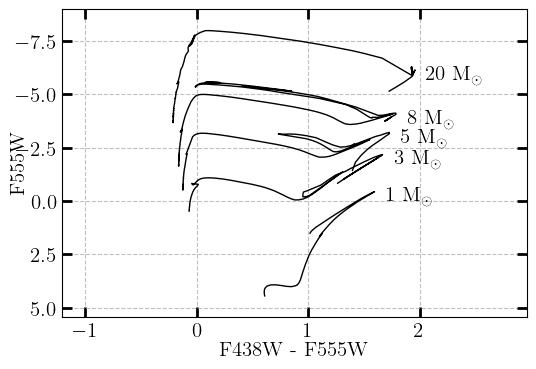

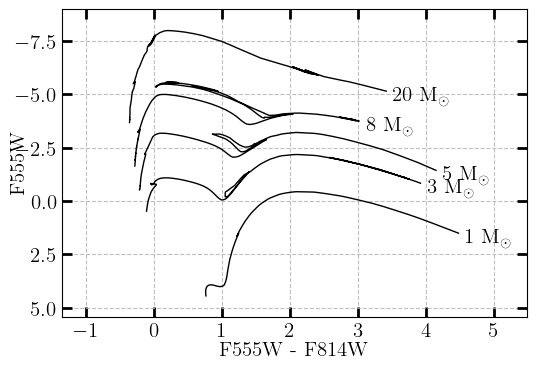

####################################################################
####################   2CXO J112014.7+125937   #############################


,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID,logAge,Star Age (Myr),Mass,Test Statistic,CSC RA,CSC Dec,2 Sig (arcsec),2 Sig (pix)
0,2CXO J112014.7+125937,CXO009,HMXB,7.0,1.0,170.061275,12.993558,201863.0,NaN,NaN,NaN,3222.967034,6017.205864,3834.343555,5918.287693,19852.0,NaN,NaN,37022.0,NaN,170.06127,12.993559,-9.975986,-3.230107,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-4.744178,-7.880962,-6.233019,-4.222578,NaN,NaN,2CXO J112014.7+125937-7.0-1.0,7.08,12.022644,15.293,0.001145,170.061339,12.993597,0.465134,11.739872


Finding best-fit model(s)...
DONE


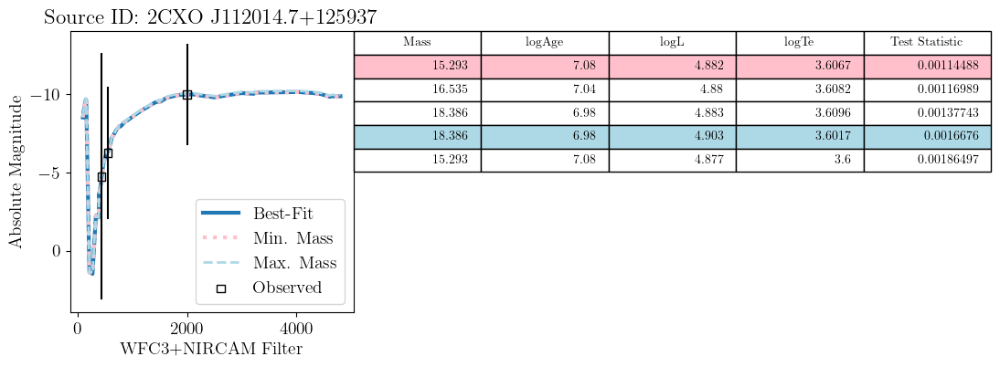

WFC3
Finding best-fit model(s)...
DONE


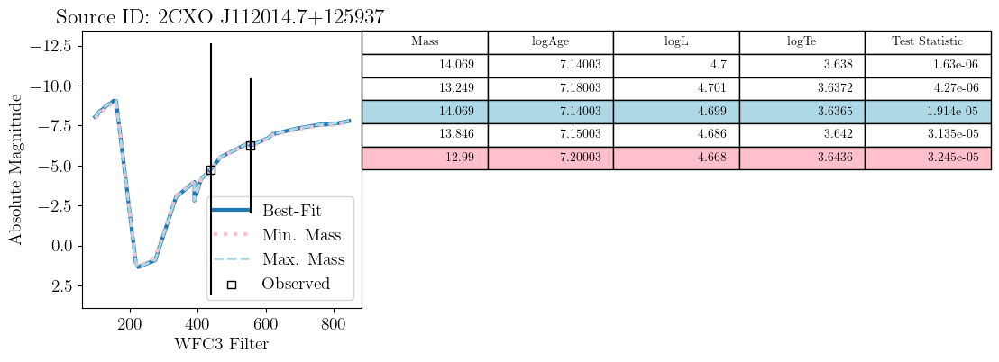

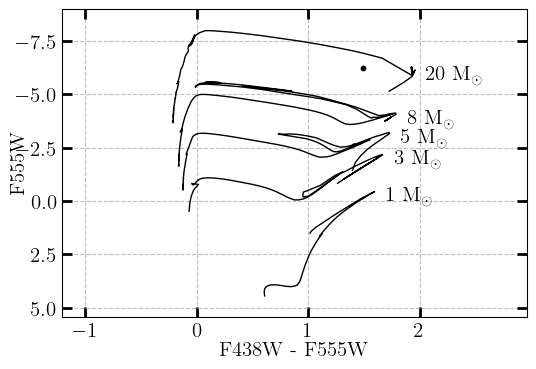

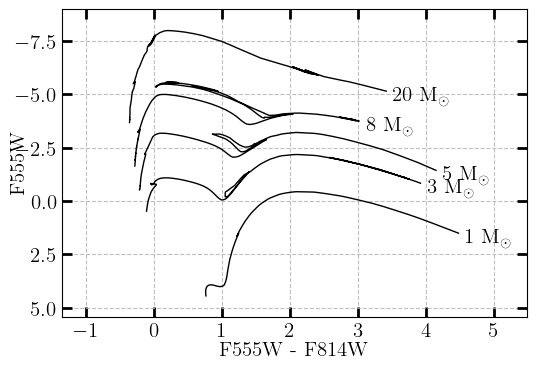

####################################################################
####################   2CXO J112015.0+125938   #############################


,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID,logAge,Star Age (Myr),Mass,Test Statistic,CSC RA,CSC Dec,2 Sig (arcsec),2 Sig (pix)
0,2CXO J112015.0+125938,CXO010,HMXB,6.0,1.0,170.062865,12.993964,204900.0,NaN,NaN,NaN,3041.554415,6064.707748,3694.780748,5952.563551,20110.0,134991.0,NaN,NaN,NaN,170.062846,12.993936,-9.586088,-4.277069,NaN,NaN,NaN,NaN,NaN,NaN,-5.450522,-0.102546,NaN,NaN,-5.292991,-6.290347,NaN,NaN,2CXO J112015.0+125938-6.0-1.0,6.98,9.549926,18.409,0.199694,170.062887,12.993977,0.343588,8.672081


Finding best-fit model(s)...
DONE


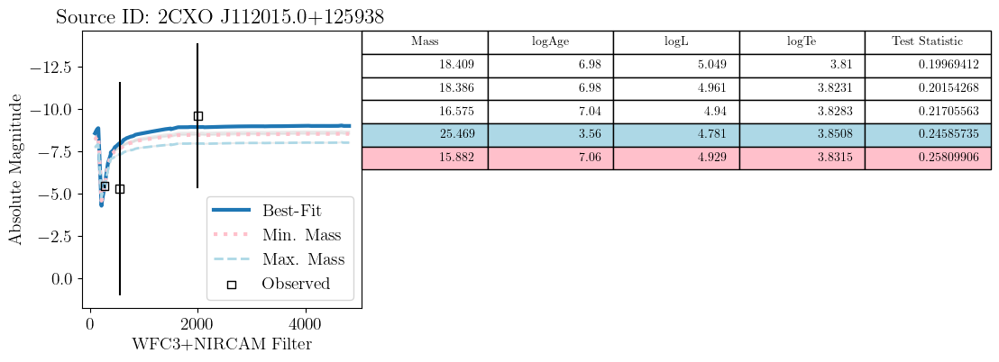

WFC3
Finding best-fit model(s)...
DONE


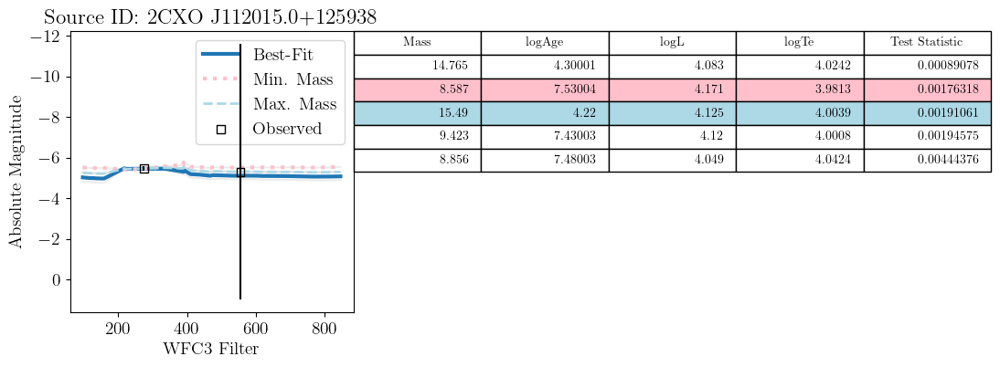

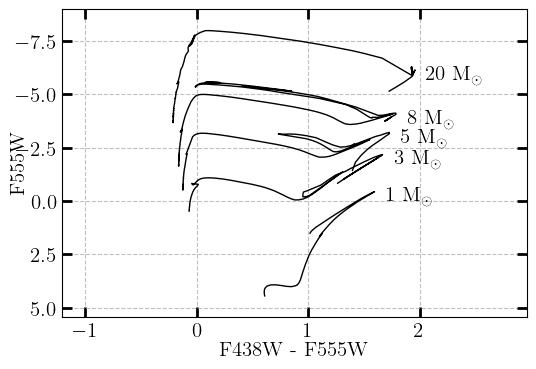

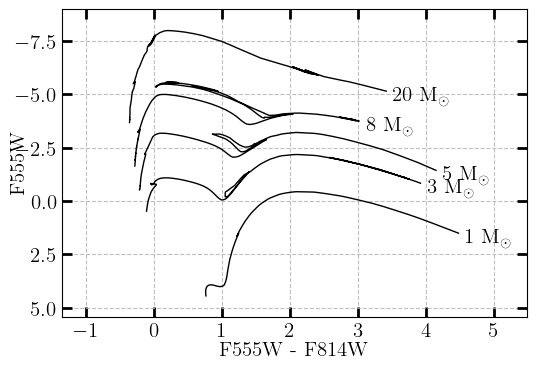

####################################################################
####################   2CXO J112014.2+125927   #############################


,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID,logAge,Star Age (Myr),Mass,Test Statistic,CSC RA,CSC Dec,2 Sig (arcsec),2 Sig (pix)
0,2CXO J112014.2+125927,CXO011,LMXB,3.0,NaN,170.059328,12.99091,182257.0,42409.0,38745.0,44337.0,3445.041678,5707.156183,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-10.365068,-0.780651,-9.906455,-2.639223,-10.491327,-1.836659,-10.608536,-1.645945,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2CXO J112014.2+125927-3.0-nan,7.4,25.118864,10.26,0.046999,170.05938,12.990875,0.228792,5.774667


Finding best-fit model(s)...
DONE


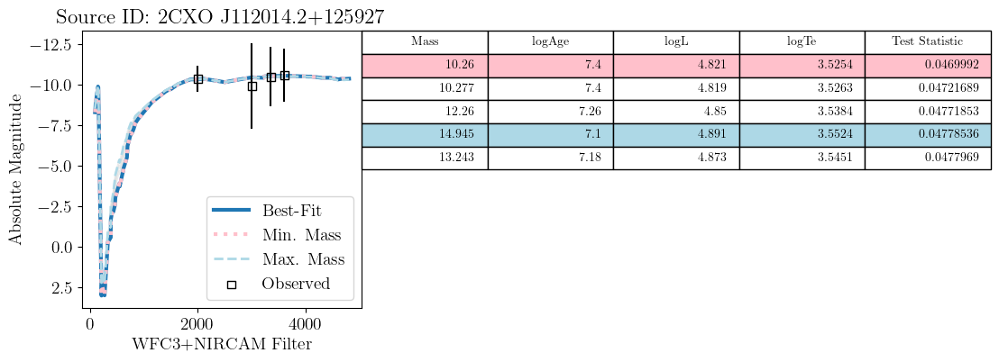

WFC3
Finding best-fit model(s)...
DONE
No best-fit model available for Source ID 2CXO J112014.2+125927.


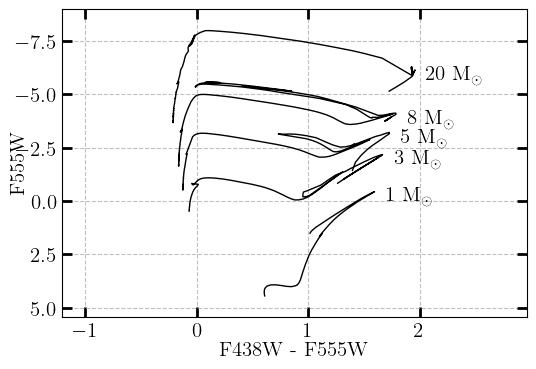

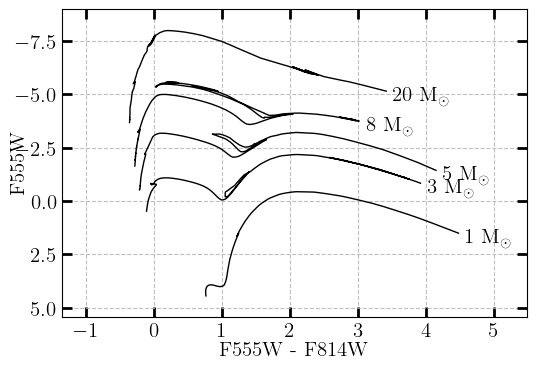

####################################################################
####################   2CXO J112014.1+125923   #############################


,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID,logAge,Star Age (Myr),Mass,Test Statistic,CSC RA,CSC Dec,2 Sig (arcsec),2 Sig (pix)
0,2CXO J112014.1+125923,CXO012,LMXB,3.0,NaN,170.058784,12.989716,173327.0,40534.0,36971.0,42428.0,3507.120121,5567.361186,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-9.280691,-1.46272,-8.043054,-10.280138,-8.293276,-9.718285,-7.756413,-15.82994,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2CXO J112014.1+125923-3.0-nan,8.62001,416.878982,1.309,0.023351,170.058772,12.989771,0.361474,9.123531


Finding best-fit model(s)...
DONE


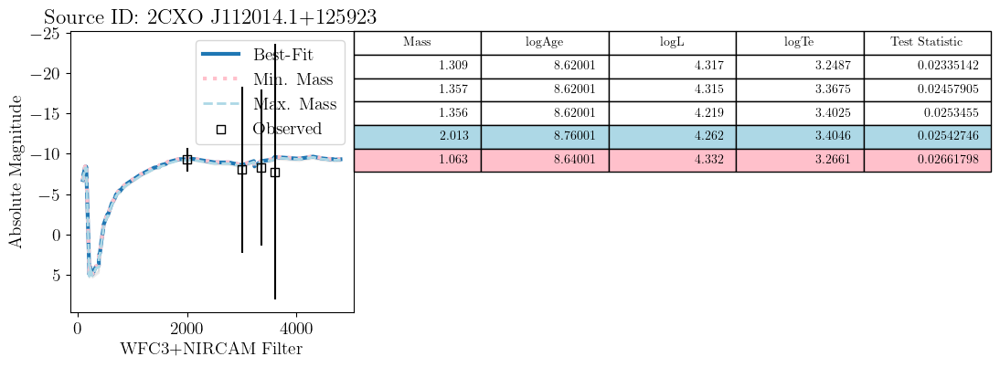

WFC3
Finding best-fit model(s)...
DONE
No best-fit model available for Source ID 2CXO J112014.1+125923.


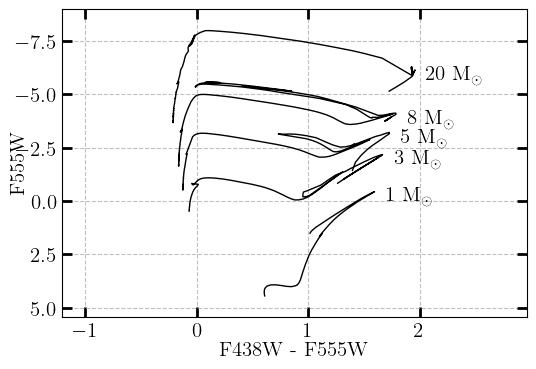

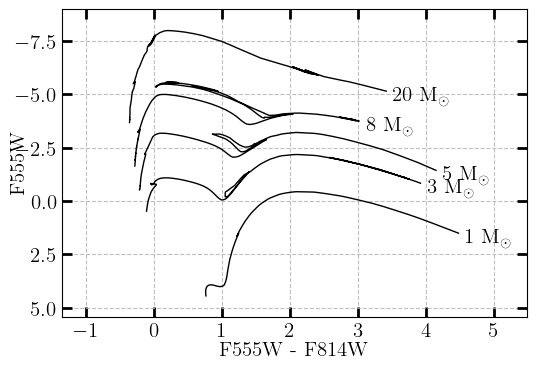

####################################################################
####################   2CXO J112014.3+125918   #############################


,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID,logAge,Star Age (Myr),Mass,Test Statistic,CSC RA,CSC Dec,2 Sig (arcsec),2 Sig (pix)
0,2CXO J112014.3+125918,CXO013,LMXB,4.0,NaN,170.05973,12.988352,163096.0,38416.0,34983.0,NaN,3399.258592,5407.640929,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-8.930437,-2.478914,-10.142517,-1.846408,-10.349826,-1.832567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2CXO J112014.3+125918-4.0-nan,8.06,114.815362,2.699,0.023714,170.059709,12.988377,0.337231,8.511648


Finding best-fit model(s)...
DONE


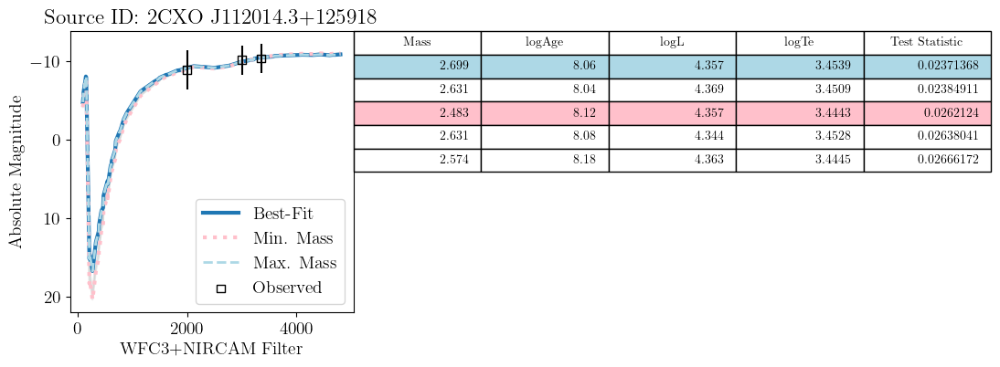

WFC3
Finding best-fit model(s)...
DONE
No best-fit model available for Source ID 2CXO J112014.3+125918.


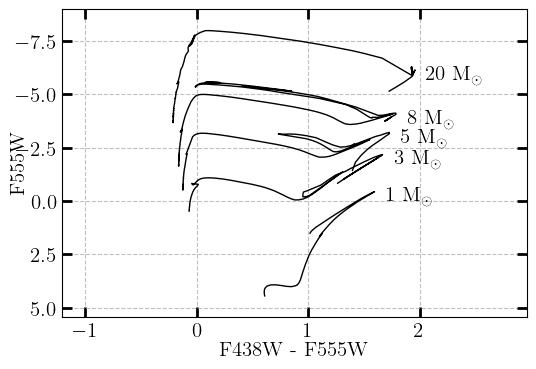

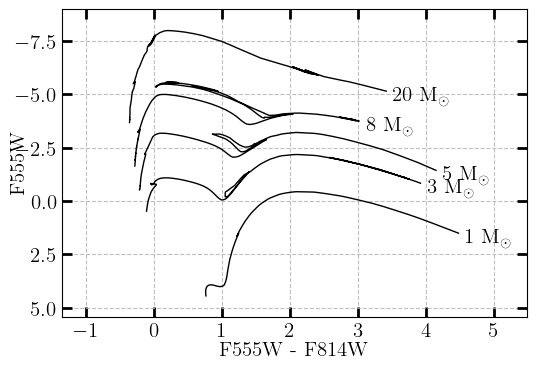

####################################################################
####################   2CXO J112015.3+125944   #############################


,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID,logAge,Star Age (Myr),Mass,Test Statistic,CSC RA,CSC Dec,2 Sig (arcsec),2 Sig (pix)
0,2CXO J112015.3+125944,CXO014,IMXB,4.0,1.0,170.063985,12.995572,216832.0,49711.0,45791.0,52056.0,2913.795733,6252.941324,3595.444164,6102.186159,21187.0,NaN,NaN,39199.0,20615.0,170.063968,12.995583,-10.221039,-1.048329,-10.633835,-1.60661,-11.244849,-1.150606,-11.360179,-1.027819,NaN,NaN,NaN,0.855513,NaN,0.943308,NaN,2.461638,2CXO J112015.3+125944-4.0-1.0,7.92,83.176377,5.502,0.139757,170.064028,12.995589,0.346187,8.737676


Finding best-fit model(s)...
DONE


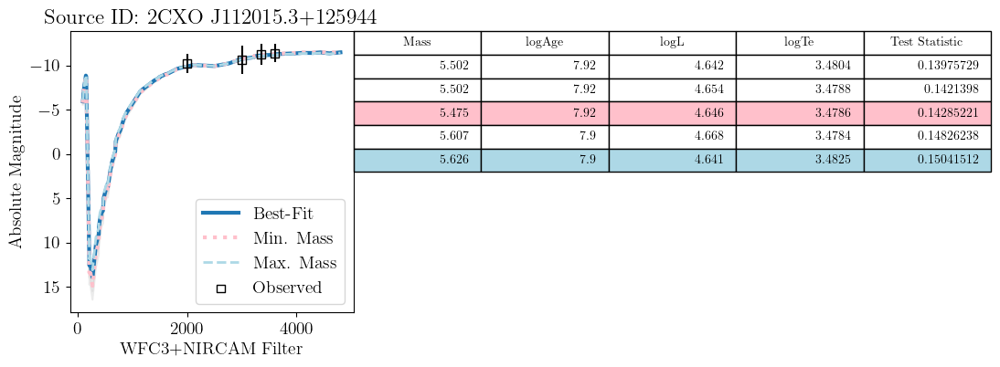

WFC3
Finding best-fit model(s)...
DONE
No best-fit model available for Source ID 2CXO J112015.3+125944.


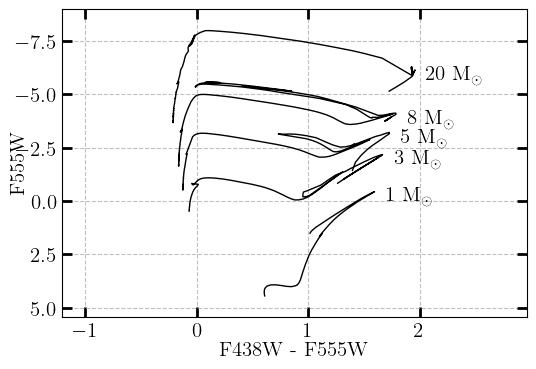

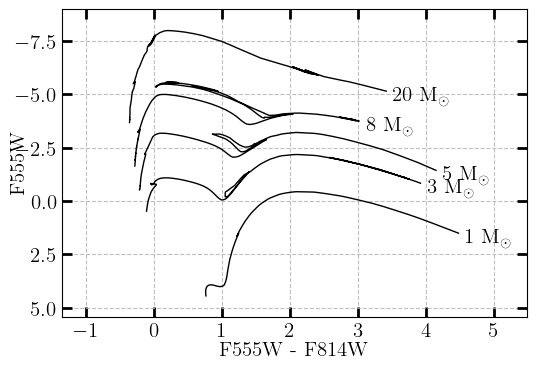

####################################################################
####################   2CXO J112015.8+125910   #############################


,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID,logAge,Star Age (Myr),Mass,Test Statistic,CSC RA,CSC Dec,2 Sig (arcsec),2 Sig (pix)
0,2CXO J112015.8+125910,CXO016,HMXB,1.0,NaN,170.066045,12.986178,147752.0,35005.0,NaN,36715.0,2678.832602,5153.128239,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-10.204121,-0.925091,-7.28476,-30.551206,NaN,NaN,NaN,6.559191,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2CXO J112015.8+125910-1.0-nan,6.6,3.981072,28.841,0.009149,170.065983,12.986237,0.364787,9.207138


Finding best-fit model(s)...
DONE


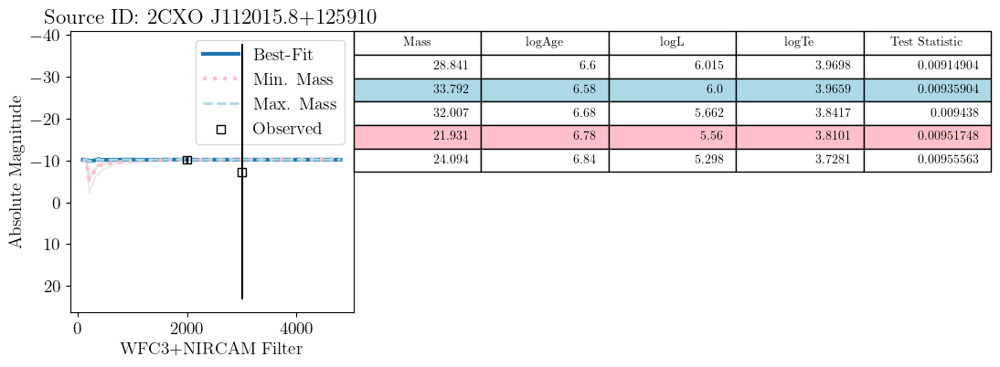

WFC3
Finding best-fit model(s)...
DONE
No best-fit model available for Source ID 2CXO J112015.8+125910.


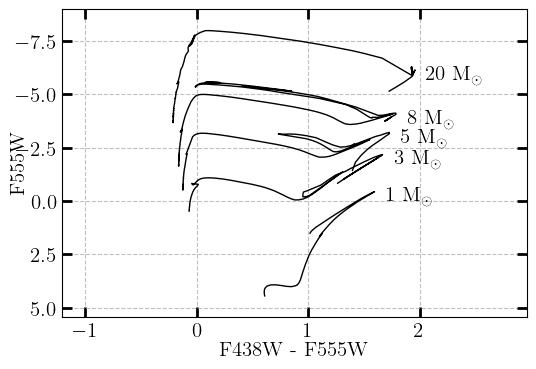

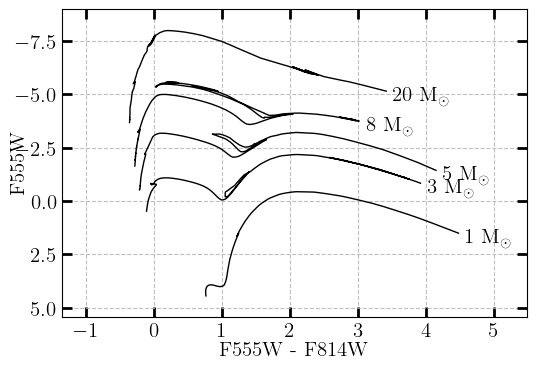

####################################################################
####################   2CXO J112013.9+125913   #############################


,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID,logAge,Star Age (Myr),Mass,Test Statistic,CSC RA,CSC Dec,2 Sig (arcsec),2 Sig (pix)
0,2CXO J112013.9+125913,CXO017,HMXB,3.0,NaN,170.058003,12.986984,153479.0,NaN,32892.0,37961.0,3596.252309,5247.56024,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-10.274073,-0.349452,NaN,NaN,-10.0732,-1.175925,-10.14711,-1.063174,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2CXO J112013.9+125913-3.0-nan,6.56,3.630781,34.16,0.032395,170.058048,12.986939,0.246783,6.228739


Finding best-fit model(s)...
DONE


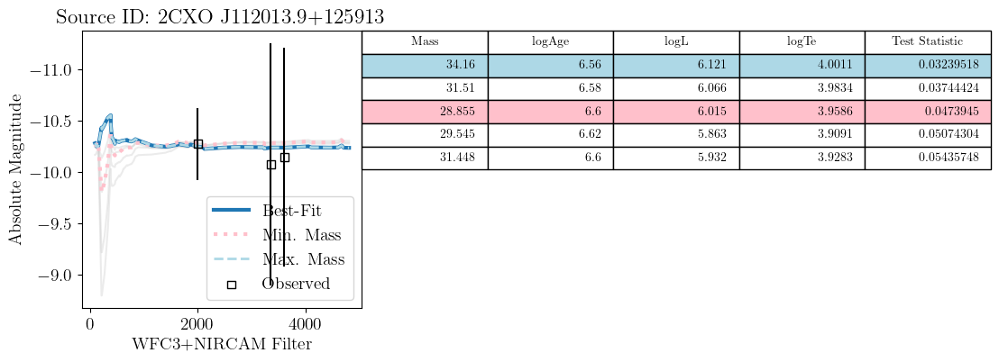

WFC3
Finding best-fit model(s)...
DONE
No best-fit model available for Source ID 2CXO J112013.9+125913.


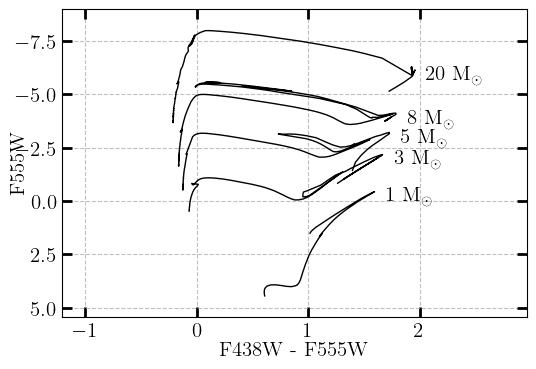

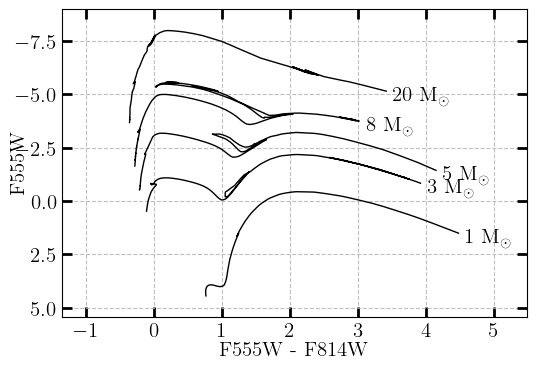

####################################################################
####################   2CXO J112013.4+125928   #############################


,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID,logAge,Star Age (Myr),Mass,Test Statistic,CSC RA,CSC Dec,2 Sig (arcsec),2 Sig (pix)
0,2CXO J112013.4+125928,CXO018,HMXB,4.0,NaN,170.055929,12.991159,184067.0,42835.0,39143.0,44782.0,3832.808537,5736.304391,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-9.572425,-0.565246,-8.794682,-2.636908,-9.373745,-2.17292,-8.71689,-3.680299,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2CXO J112013.4+125928-4.0-nan,6.48,3.019952,54.379,0.119369,170.055921,12.991105,0.265307,6.696285


Finding best-fit model(s)...
DONE


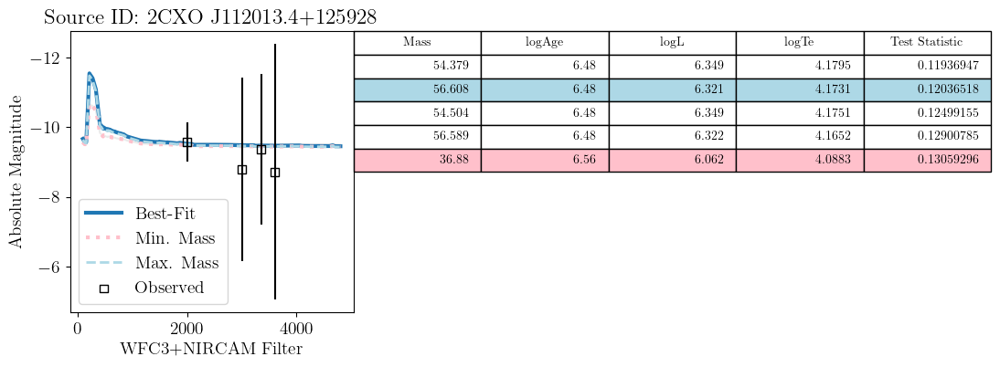

WFC3
Finding best-fit model(s)...
DONE
No best-fit model available for Source ID 2CXO J112013.4+125928.


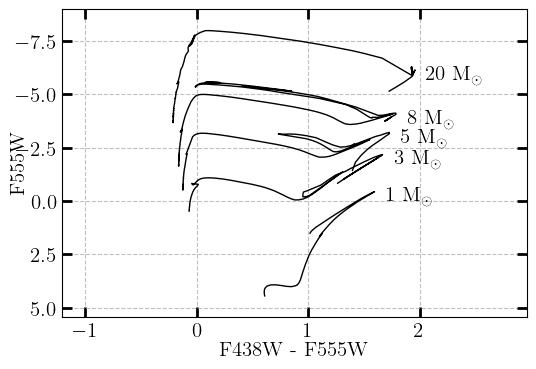

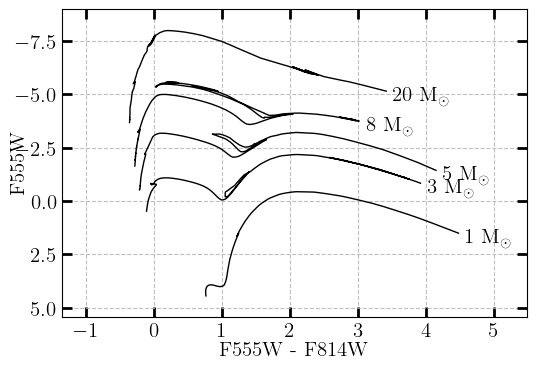

####################################################################
####################   2CXO J112015.5+125955   #############################


,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID,logAge,Star Age (Myr),Mass,Test Statistic,CSC RA,CSC Dec,2 Sig (arcsec),2 Sig (pix)
0,2CXO J112015.5+125955,CXO020,HMXB,7.0,NaN,170.064734,12.998624,239464.0,54587.0,50473.0,57228.0,2828.392104,6610.326118,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-10.304551,-0.370154,-10.282667,-0.915928,-10.605715,-0.887099,-10.653834,-0.811141,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2CXO J112015.5+125955-7.0-nan,7.4,25.118864,10.277,0.059239,170.064793,12.998581,0.377741,9.534111


Finding best-fit model(s)...
DONE


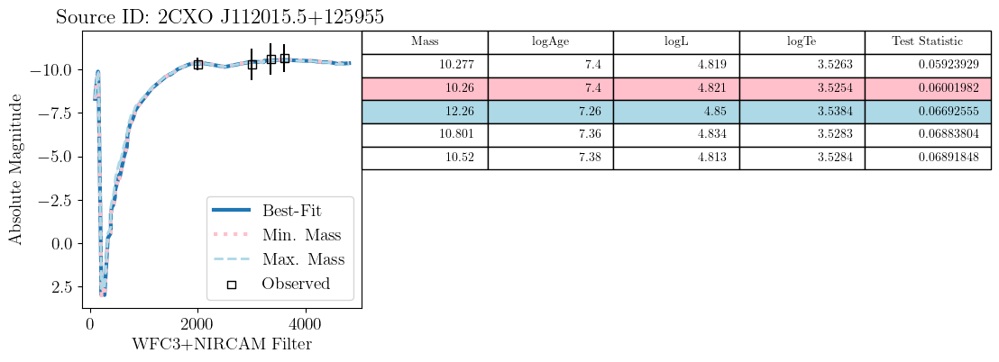

WFC3
Finding best-fit model(s)...
DONE
No best-fit model available for Source ID 2CXO J112015.5+125955.


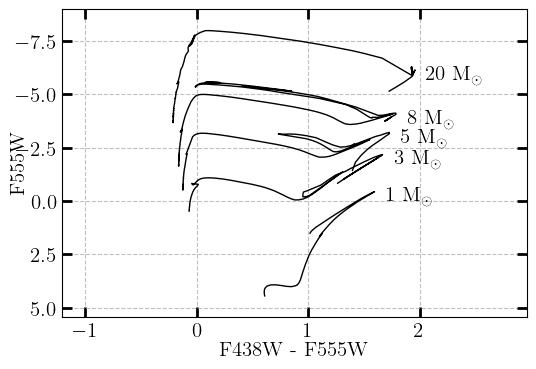

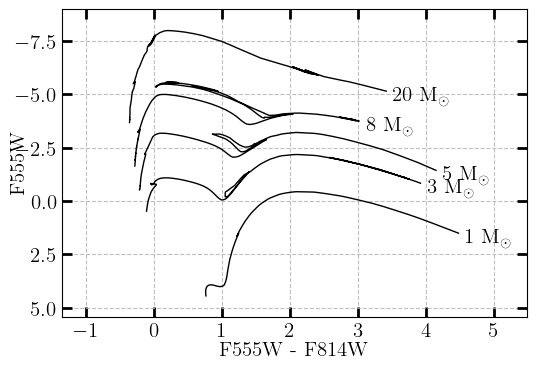

####################################################################
####################   2CXO J112015.8+125904   #############################


,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID,logAge,Star Age (Myr),Mass,Test Statistic,CSC RA,CSC Dec,2 Sig (arcsec),2 Sig (pix)
0,2CXO J112015.8+125904,CXO021,LMXB,6.0,NaN,170.065936,12.984379,135487.0,32336.0,29245.0,33990.0,2691.261638,4942.465526,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-10.460925,-0.701169,-10.152196,-2.097601,-10.256005,-2.385946,-10.433765,-1.995826,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2CXO J112015.8+125904-6.0-nan,6.54,3.467369,40.809,0.024986,170.065903,12.984421,0.471858,11.909593


Finding best-fit model(s)...
DONE


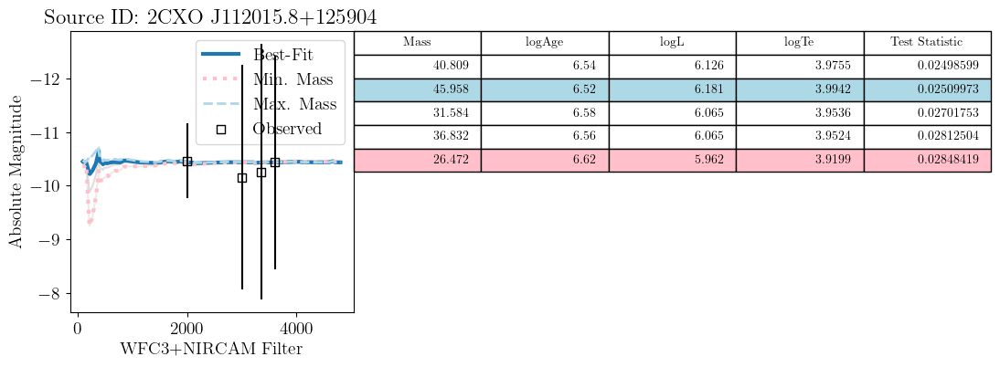

WFC3
Finding best-fit model(s)...
DONE
No best-fit model available for Source ID 2CXO J112015.8+125904.


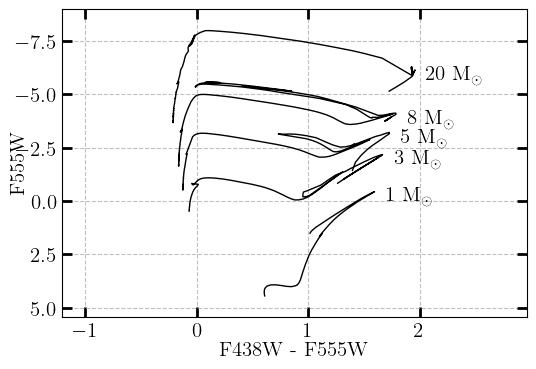

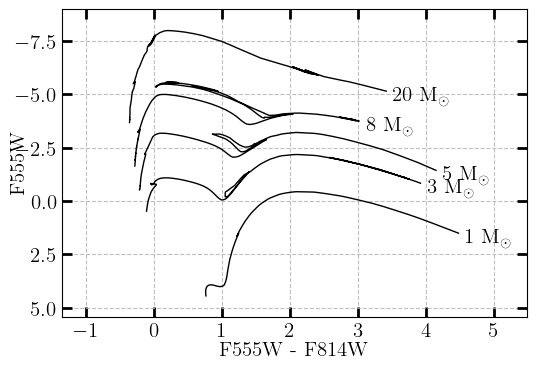

####################################################################
####################   2CXO J112012.8+125947   #############################


,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID,logAge,Star Age (Myr),Mass,Test Statistic,CSC RA,CSC Dec,2 Sig (arcsec),2 Sig (pix)
0,2CXO J112012.8+125947,CXO022,HMXB,4.0,1.0,170.053558,12.996615,224657.0,51455.0,47459.0,NaN,4103.271323,6375.107213,4518.077121,6197.146311,21971.0,NaN,NaN,40508.0,21529.0,170.053547,12.996628,-9.218737,-0.706499,-9.363036,-1.405187,-9.131833,-2.243986,NaN,NaN,NaN,NaN,-4.940801,-0.800427,-5.463151,-0.92218,-6.661469,-0.94139,2CXO J112012.8+125947-4.0-1.0,7.06,11.481536,15.974,1.341157,170.053614,12.996594,0.277362,7.000563


Finding best-fit model(s)...
DONE


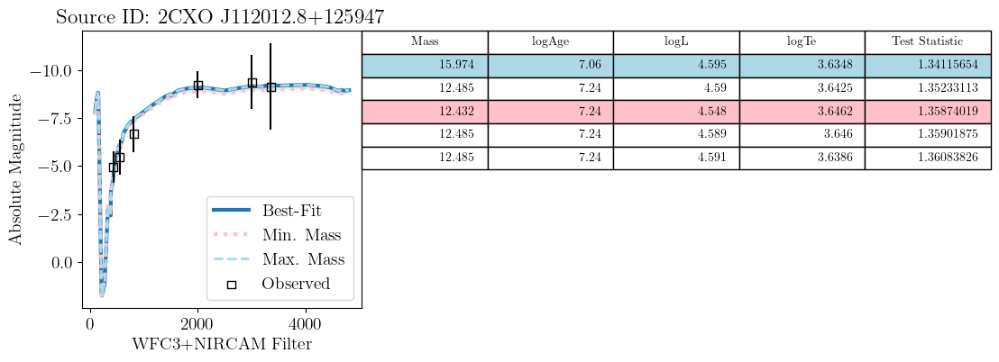

WFC3
Finding best-fit model(s)...
DONE


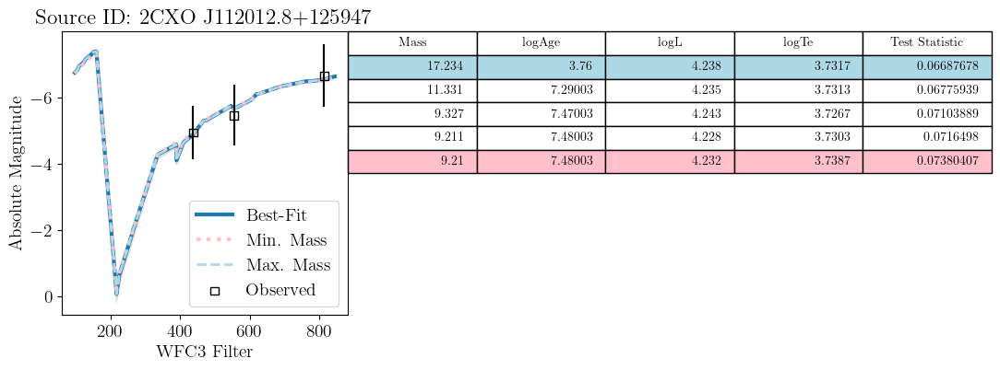

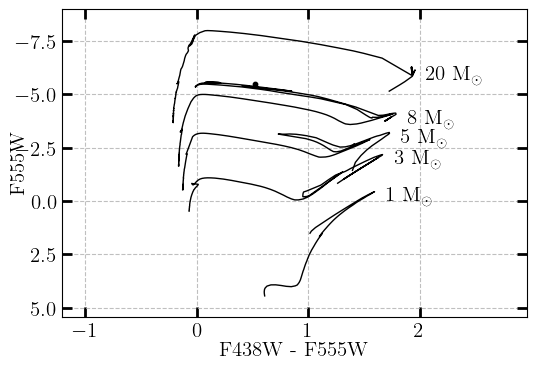

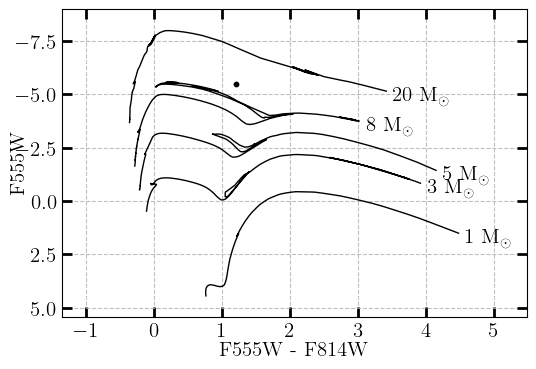

####################################################################
####################   2CXO J112012.6+125947   #############################


,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID,logAge,Star Age (Myr),Mass,Test Statistic,CSC RA,CSC Dec,2 Sig (arcsec),2 Sig (pix)
0,2CXO J112012.6+125947,CXO023,HMXB,4.0,NaN,170.052608,12.996508,223905.0,51210.0,47199.0,53624.0,4211.609078,6362.600736,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-11.008535,-0.136912,-10.699193,-0.404519,-10.967849,-0.415866,-11.00149,-0.376322,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2CXO J112012.6+125947-4.0-nan,6.52,3.311311,43.206,0.607539,170.052527,12.996542,0.385212,9.722662


Finding best-fit model(s)...
DONE


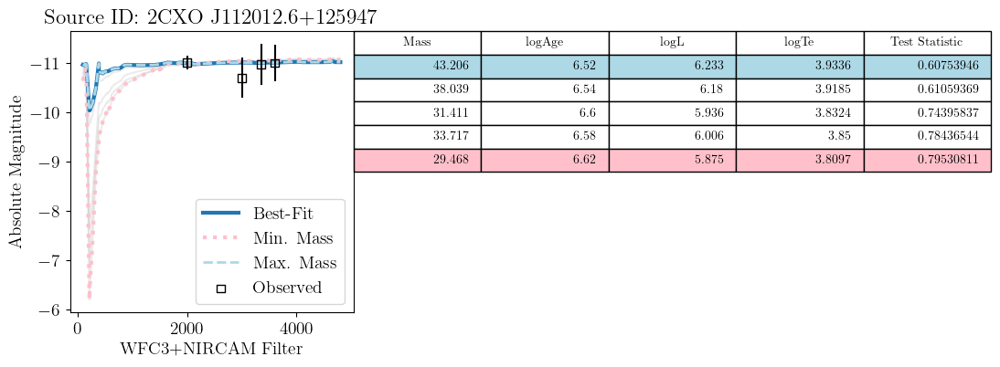

WFC3
Finding best-fit model(s)...
DONE
No best-fit model available for Source ID 2CXO J112012.6+125947.


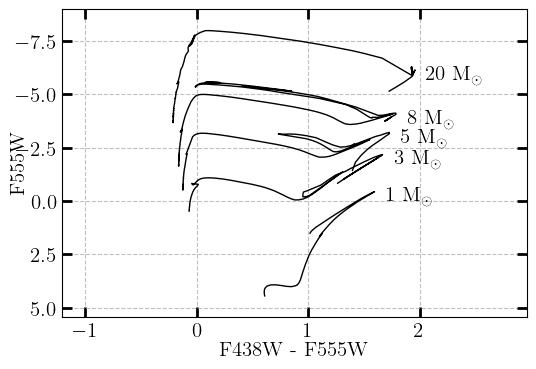

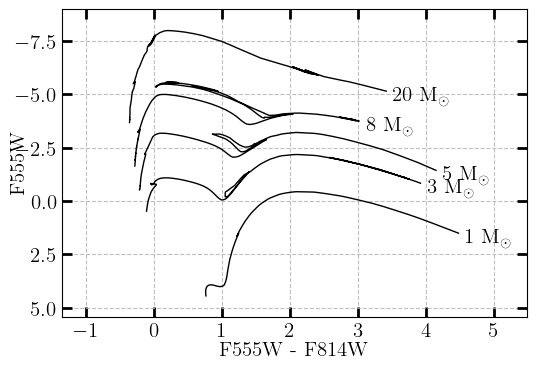

####################################################################
####################   2CXO J112016.8+125959   #############################


,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID,logAge,Star Age (Myr),Mass,Test Statistic,CSC RA,CSC Dec,2 Sig (arcsec),2 Sig (pix)
0,2CXO J112016.8+125959,CXO024,HMXB,6.0,3.0,170.070216,12.999862,248309.0,NaN,NaN,NaN,2203.009986,6755.242243,3042.724778,6490.637342,24541.0,NaN,116238.0,44454.0,24097.0,170.070211,12.999858,-10.044437,-0.209579,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-7.299592,-0.143603,-7.509858,-0.157759,-7.958255,-0.220121,2CXO J112016.8+125959-6.0-3.0,6.98,9.549926,18.411,23.38841,170.070149,12.999835,0.502163,12.674487


Finding best-fit model(s)...
DONE


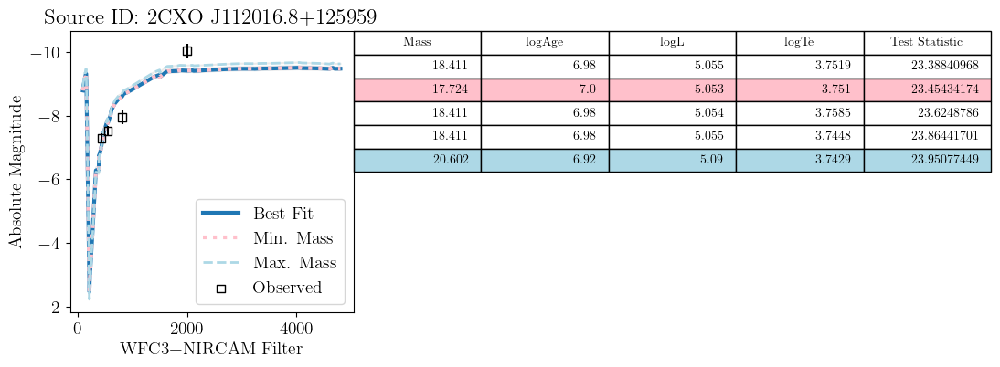

WFC3
Finding best-fit model(s)...
DONE


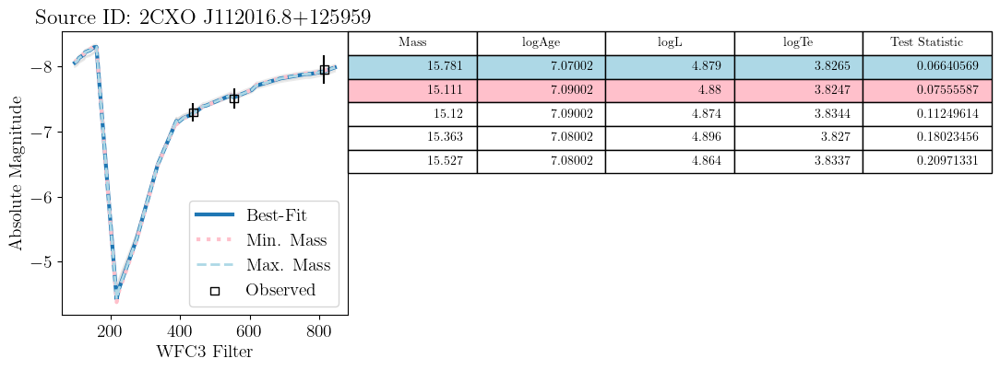

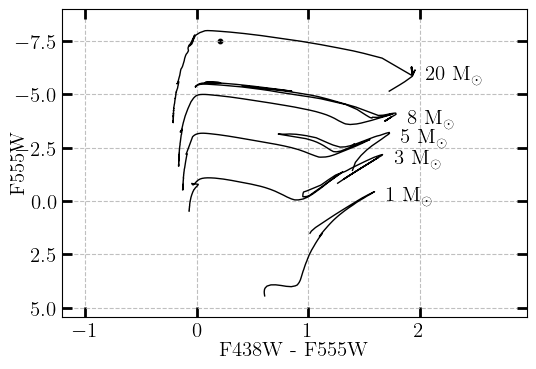

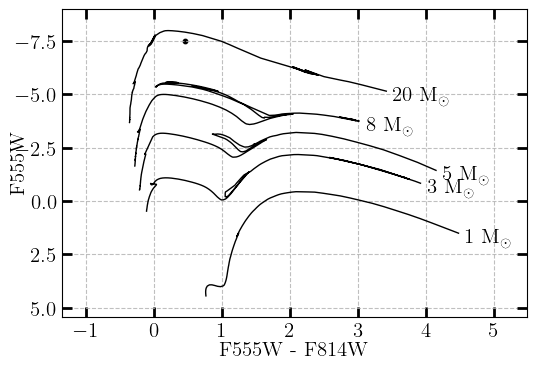

####################################################################
####################   2CXO J112017.1+130003   #############################


,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID,logAge,Star Age (Myr),Mass,Test Statistic,CSC RA,CSC Dec,2 Sig (arcsec),2 Sig (pix)
0,2CXO J112017.1+130003,CXO026,HMXB,4.0,NaN,170.071453,13.000873,255316.0,58116.0,NaN,60911.0,2061.844318,6873.548629,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-10.126549,-0.158148,-10.085103,-0.417186,NaN,NaN,-10.218882,-0.473753,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2CXO J112017.1+130003-4.0-nan,6.6,3.981072,31.462,0.046034,170.071585,13.000886,0.504647,12.737185


Finding best-fit model(s)...
DONE


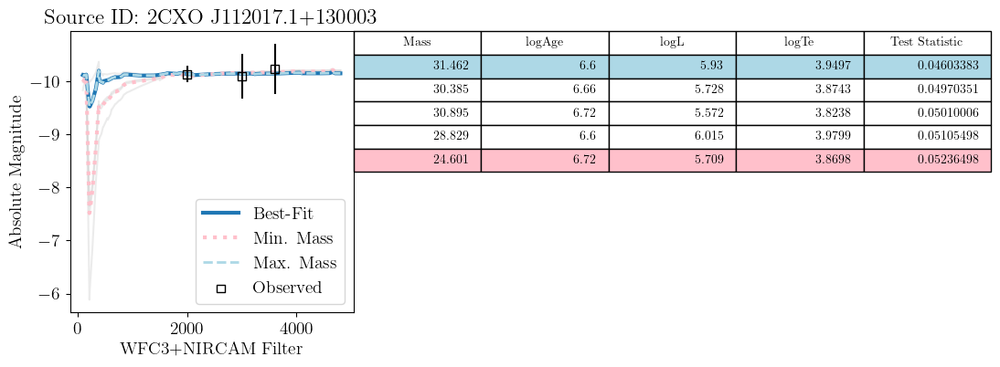

WFC3
Finding best-fit model(s)...
DONE
No best-fit model available for Source ID 2CXO J112017.1+130003.


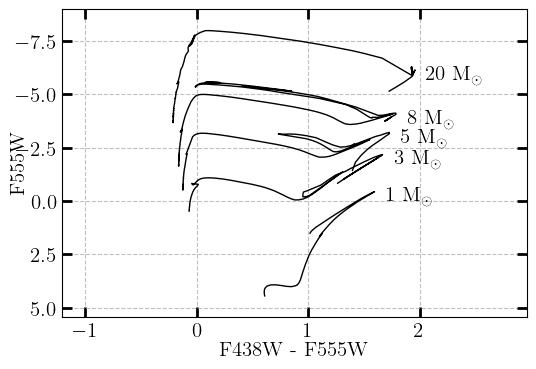

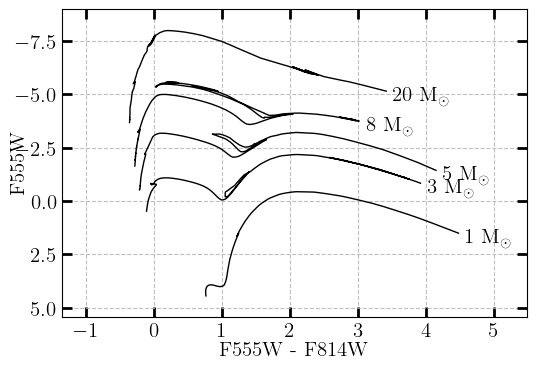

####################################################################
####################   2CXO J112012.2+125952   #############################


,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID,logAge,Star Age (Myr),Mass,Test Statistic,CSC RA,CSC Dec,2 Sig (arcsec),2 Sig (pix)
0,2CXO J112012.2+125952,CXO027,HMXB,6.0,NaN,170.051044,12.997753,233090.0,53280.0,NaN,NaN,4390.093089,6508.342481,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-9.839481,-0.386967,-9.869611,-0.866321,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2CXO J112012.2+125952-6.0-nan,6.7,5.011872,31.457,0.000089,170.050873,12.997819,0.708494,17.882237


Finding best-fit model(s)...
DONE


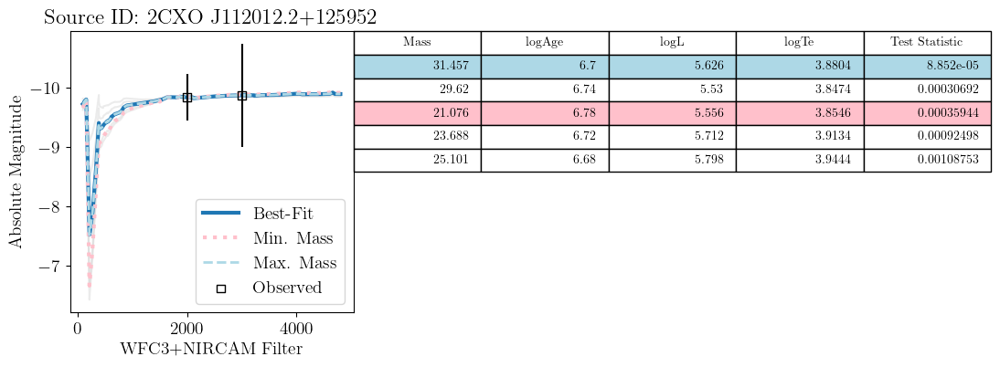

WFC3
Finding best-fit model(s)...
DONE
No best-fit model available for Source ID 2CXO J112012.2+125952.


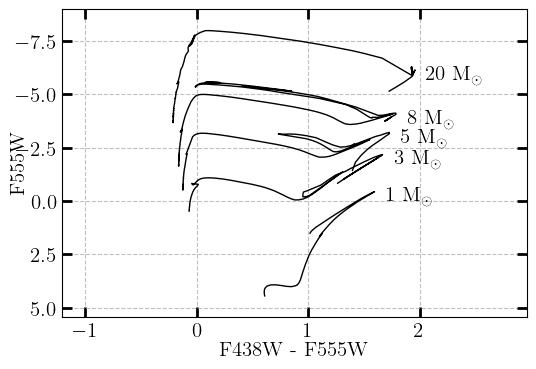

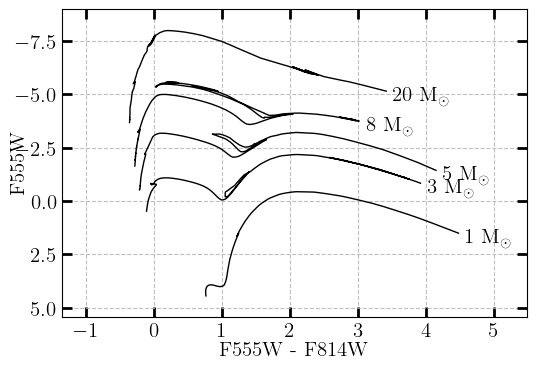

####################################################################
####################   2CXO J112012.0+125910   #############################


,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID,logAge,Star Age (Myr),Mass,Test Statistic,CSC RA,CSC Dec,2 Sig (arcsec),2 Sig (pix)
0,2CXO J112012.0+125910,CXO028,HMXB,3.0,NaN,170.05011,12.986288,148537.0,35278.0,NaN,NaN,4496.766521,5166.09034,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-10.176965,-0.15492,-9.847543,-0.50322,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2CXO J112012.0+125910-3.0-nan,6.6,3.981072,28.829,0.41242,170.050187,12.986338,0.412952,10.422811


Finding best-fit model(s)...
DONE


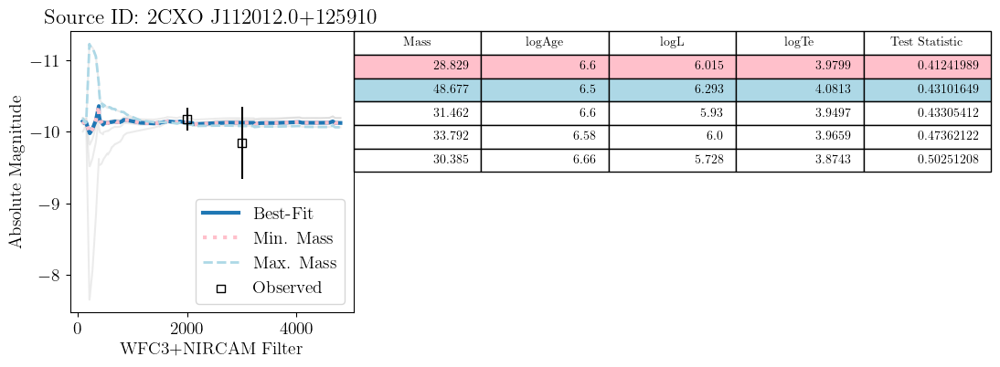

WFC3
Finding best-fit model(s)...
DONE
No best-fit model available for Source ID 2CXO J112012.0+125910.


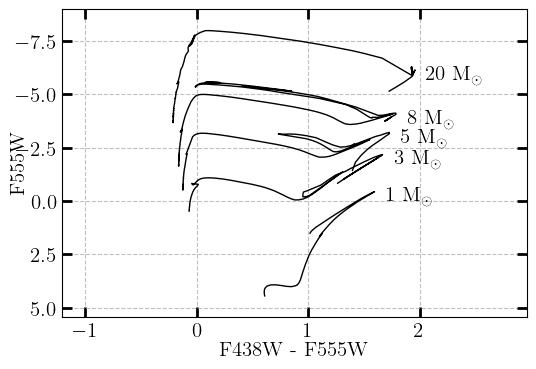

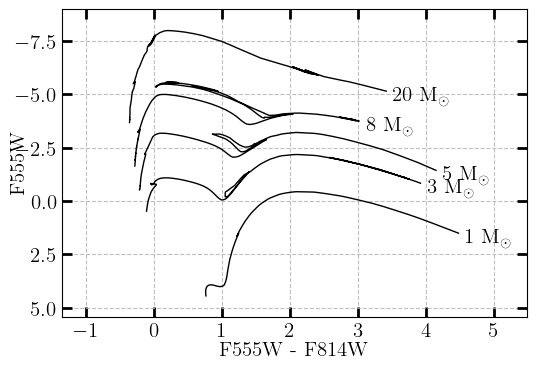

####################################################################
####################   2CXO J112015.8+130019   #############################


,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID,logAge,Star Age (Myr),Mass,Test Statistic,CSC RA,CSC Dec,2 Sig (arcsec),2 Sig (pix)
0,2CXO J112015.8+130019,CXO030,HMXB,2.0,NaN,170.066076,13.005265,284290.0,64718.0,60042.0,67749.0,2675.265634,7387.748535,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-9.779057,-0.260593,-8.974987,-1.34406,-10.020604,-0.722522,-9.752864,-0.841923,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2CXO J112015.8+130019-2.0-nan,6.72,5.248075,23.52,0.472883,170.066003,13.00528,0.381587,9.631166


Finding best-fit model(s)...
DONE


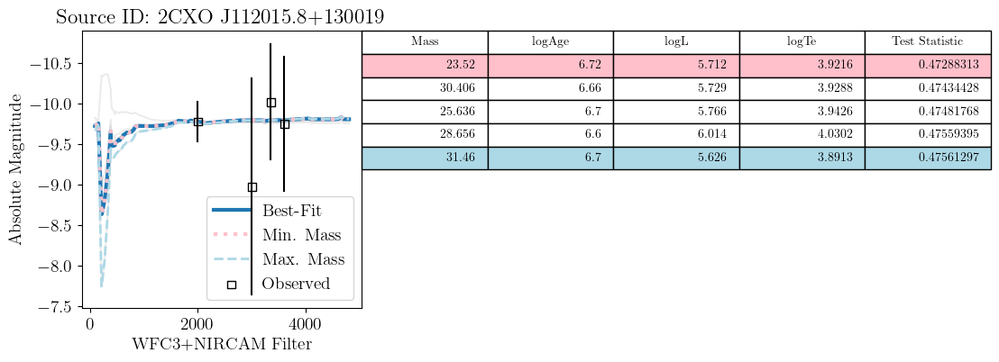

WFC3
Finding best-fit model(s)...
DONE
No best-fit model available for Source ID 2CXO J112015.8+130019.


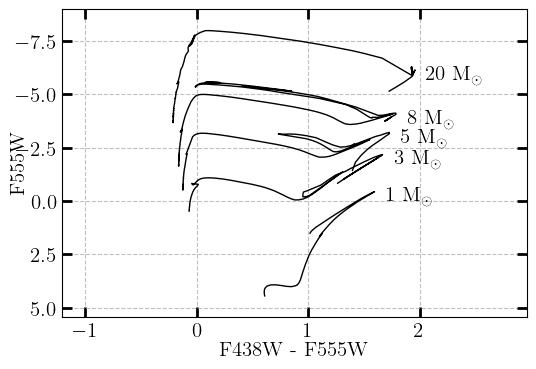

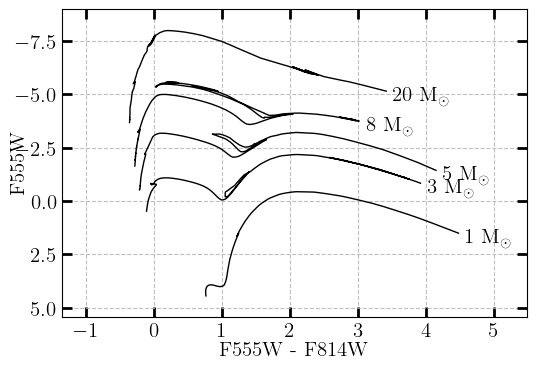

####################################################################
####################   2CXO J112016.6+125844   #############################


,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID,logAge,Star Age (Myr),Mass,Test Statistic,CSC RA,CSC Dec,2 Sig (arcsec),2 Sig (pix)
0,2CXO J112016.6+125844,CXO031,HMXB,6.0,NaN,170.069371,12.978862,101165.0,NaN,NaN,26036.0,2299.387087,4296.600671,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-11.25514,-0.200289,NaN,NaN,NaN,NaN,-13.84939,-0.078584,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2CXO J112016.6+125844-6.0-nan,6.84,6.91831,21.346,371.56878,170.069365,12.978872,0.428412,10.813034


Finding best-fit model(s)...
DONE


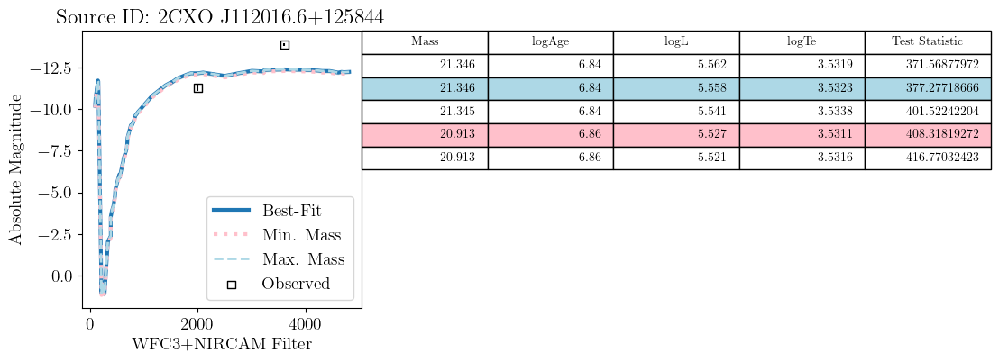

WFC3
Finding best-fit model(s)...
DONE
No best-fit model available for Source ID 2CXO J112016.6+125844.


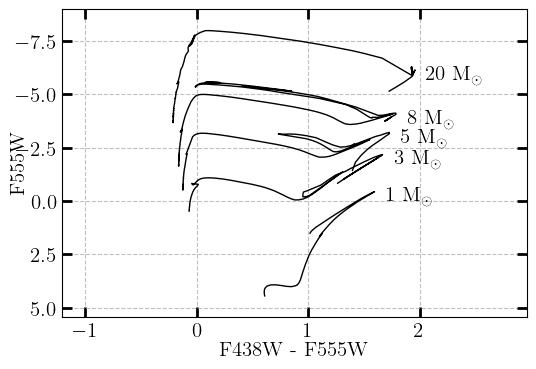

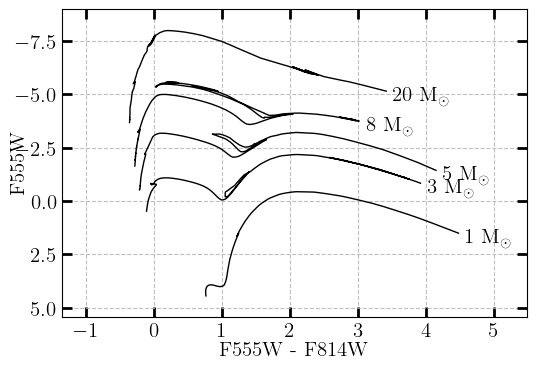

####################################################################
####################   2CXO J112018.2+125959   #############################


,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID,logAge,Star Age (Myr),Mass,Test Statistic,CSC RA,CSC Dec,2 Sig (arcsec),2 Sig (pix)
0,2CXO J112018.2+125959,CXO032,HMXB,1.0,NaN,170.075866,12.999778,247702.0,56316.0,NaN,NaN,1558.432674,6745.348133,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-9.553562,-0.227423,-9.129029,-0.825713,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2CXO J112018.2+125959-1.0-nan,6.48,3.019952,54.379,0.200668,170.07588,12.999774,0.245355,6.192698


Finding best-fit model(s)...
DONE


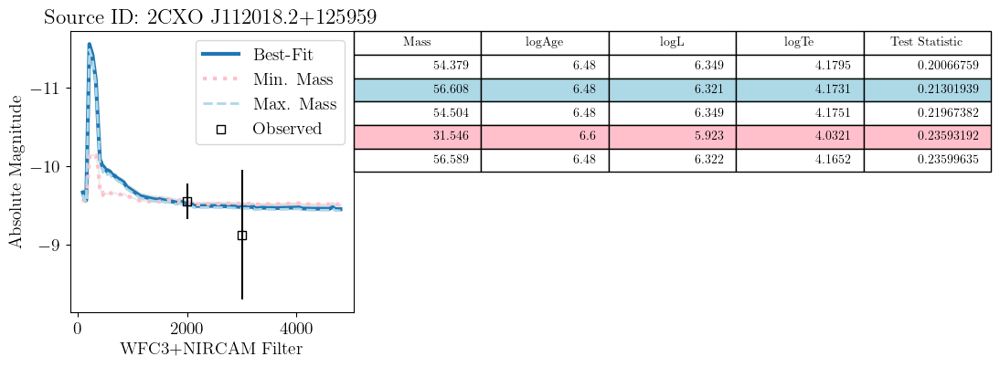

WFC3
Finding best-fit model(s)...
DONE
No best-fit model available for Source ID 2CXO J112018.2+125959.


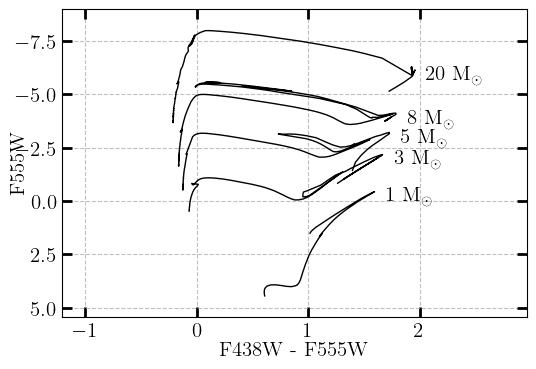

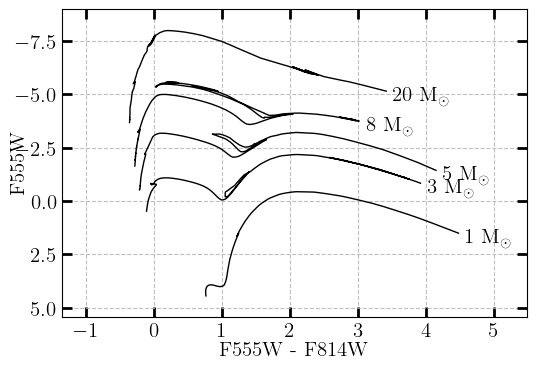

####################################################################
####################   2CXO J112018.8+125924   #############################


,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID,logAge,Star Age (Myr),Mass,Test Statistic,CSC RA,CSC Dec,2 Sig (arcsec),2 Sig (pix)
0,2CXO J112018.8+125924,CXO035,HMXB,6.0,2.0,170.078486,12.990244,177274.0,NaN,NaN,NaN,1259.48282,5629.210226,2312.165203,5616.540985,17424.0,NaN,92649.0,33396.0,NaN,170.078462,12.990238,-9.351096,-0.414785,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-4.756697,-0.675113,-6.102001,-0.284258,NaN,NaN,2CXO J112018.8+125924-6.0-2.0,7.14,13.803843,14.068,0.100069,170.078512,12.990211,0.478708,12.082486


Finding best-fit model(s)...
DONE


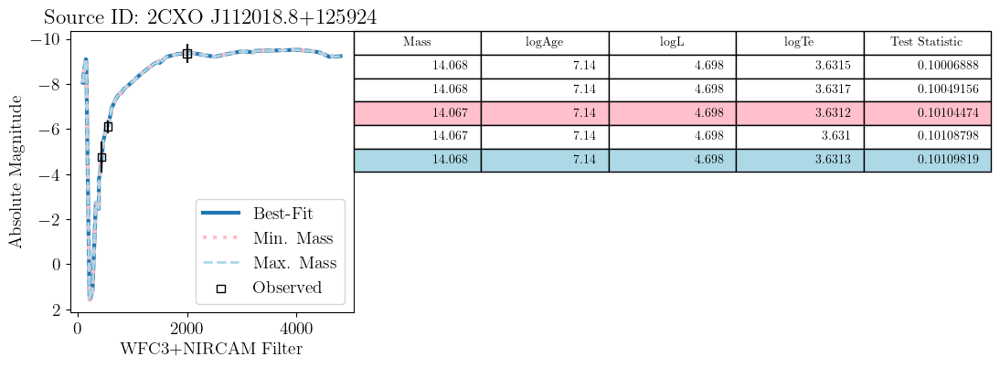

WFC3
Finding best-fit model(s)...
DONE


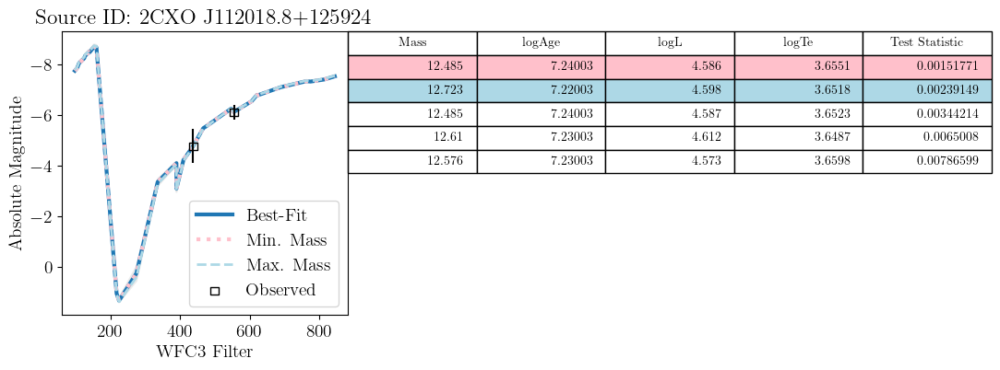

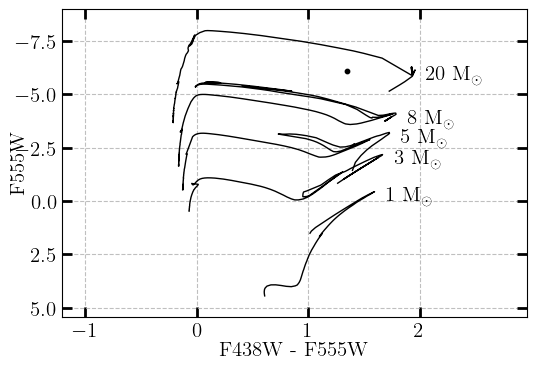

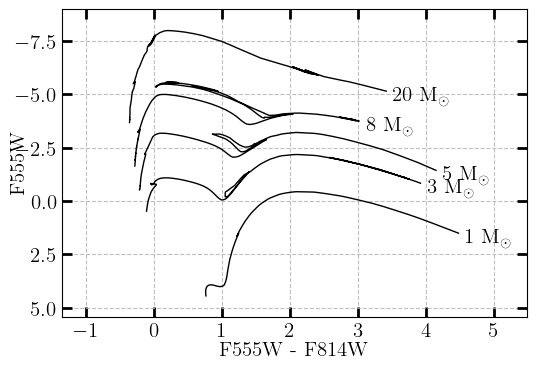

####################################################################
####################   2CXO J112013.7+130025   #############################


,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID,logAge,Star Age (Myr),Mass,Test Statistic,CSC RA,CSC Dec,2 Sig (arcsec),2 Sig (pix)
0,2CXO J112013.7+130025,CXO036,HMXB,16.0,4.0,170.057402,13.006979,294456.0,67042.0,62189.0,70144.0,3664.758816,7588.520552,4177.240381,7137.975463,30737.0,174040.0,133869.0,53074.0,29563.0,170.057397,13.006982,-10.612429,-0.313634,-9.793925,-1.654899,NaN,2.873029,-7.749557,-15.585417,-4.727788,-0.169028,-7.753705,-0.116986,-8.069923,-0.150042,-8.955618,-0.187991,2CXO J112013.7+130025-16.0-4.0,6.86,7.24436,23.172,11.061017,170.05733,13.006947,0.597313,15.076052


Finding best-fit model(s)...
DONE


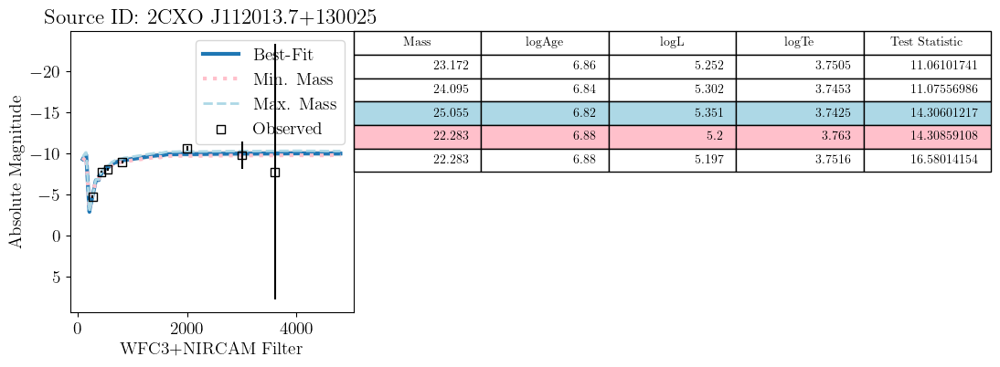

WFC3
Finding best-fit model(s)...
DONE


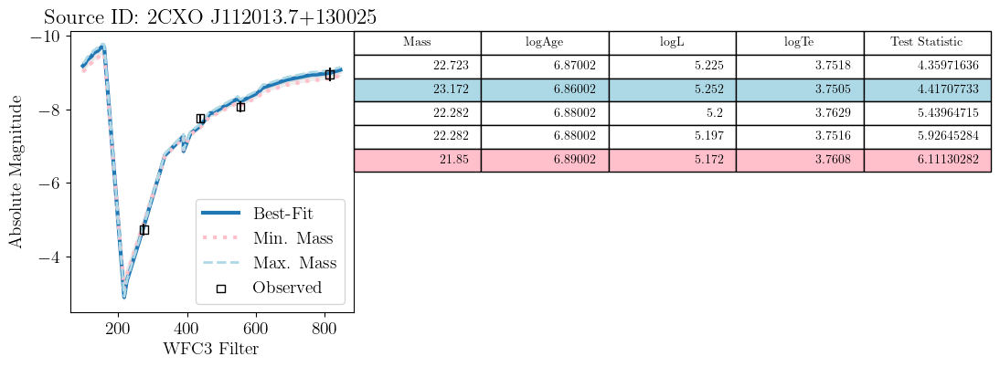

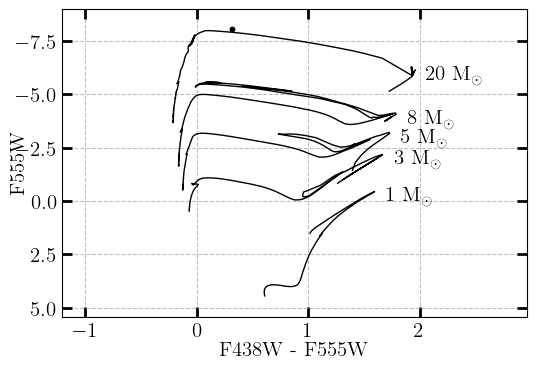

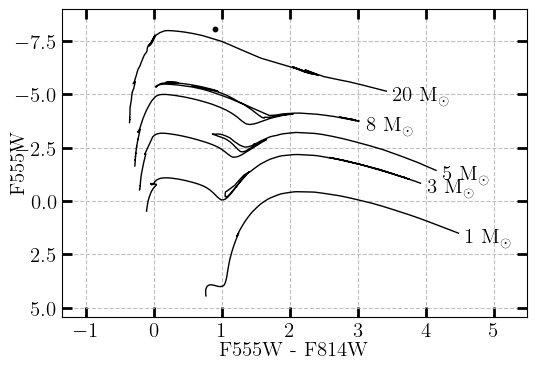

####################################################################
####################   2CXO J112012.3+125846   #############################


,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID,logAge,Star Age (Myr),Mass,Test Statistic,CSC RA,CSC Dec,2 Sig (arcsec),2 Sig (pix)
0,2CXO J112012.3+125846,CXO037,HMXB,2.0,NaN,170.051249,12.979516,105009.0,25466.0,NaN,NaN,4366.88079,4373.259361,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-9.422291,-0.32285,-9.151606,-0.982712,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2CXO J112012.3+125846-2.0-nan,6.5,3.162278,48.295,0.049318,170.05125,12.979514,0.339635,8.5723


Finding best-fit model(s)...
DONE


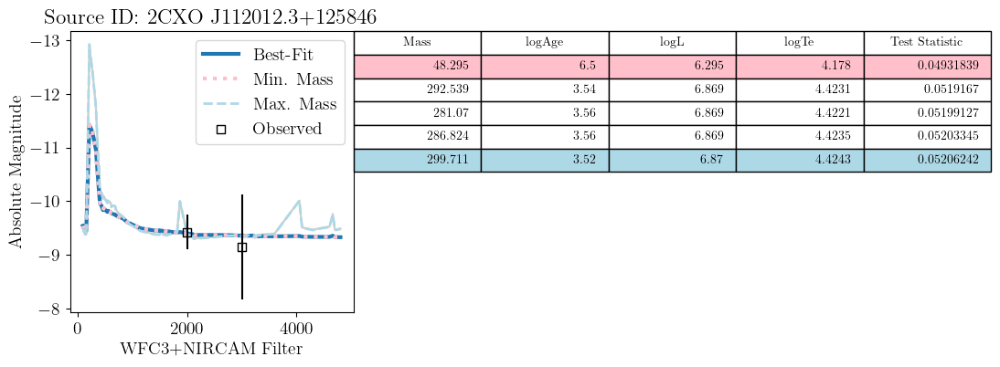

WFC3
Finding best-fit model(s)...
DONE
No best-fit model available for Source ID 2CXO J112012.3+125846.


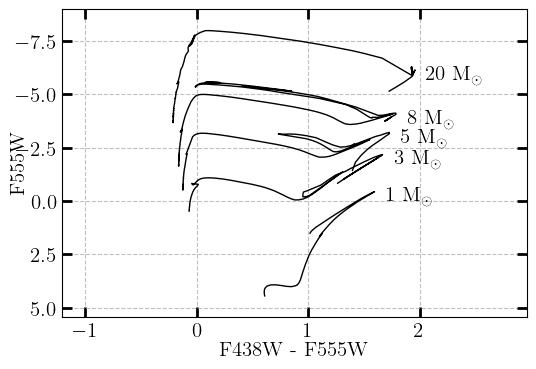

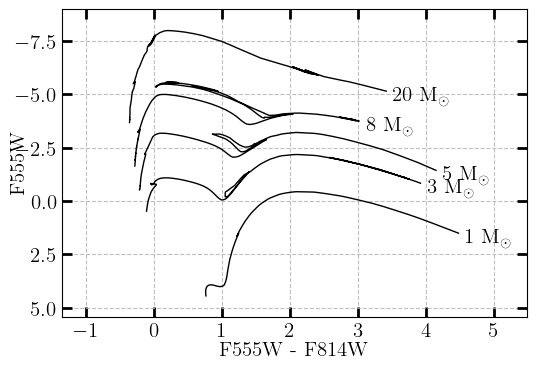

####################################################################
####################   2CXO J112017.3+130019   #############################


,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID,logAge,Star Age (Myr),Mass,Test Statistic,CSC RA,CSC Dec,2 Sig (arcsec),2 Sig (pix)
0,2CXO J112017.3+130019,CXO039,LMXB,7.0,NaN,170.072467,13.005485,285580.0,65085.0,NaN,NaN,1946.228482,7413.54611,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-8.738424,-0.45862,-9.792106,-0.41587,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2CXO J112017.3+130019-7.0-nan,8.24,173.780083,2.205,0.004421,170.072362,13.005469,0.780295,19.694482


Finding best-fit model(s)...
DONE


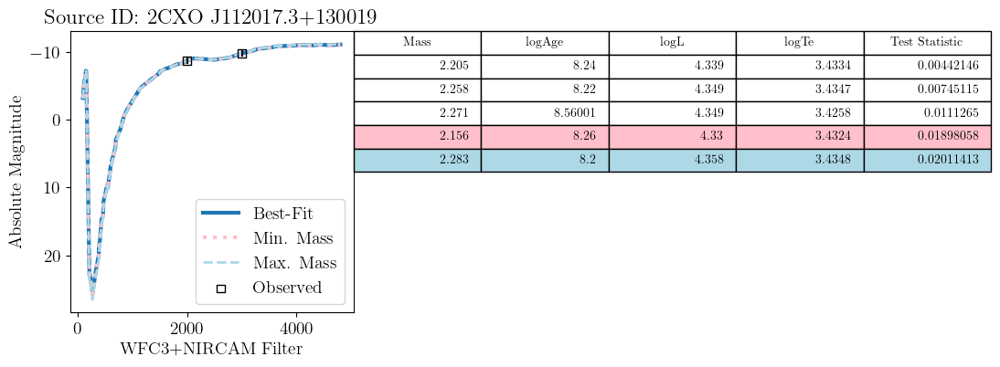

WFC3
Finding best-fit model(s)...
DONE
No best-fit model available for Source ID 2CXO J112017.3+130019.


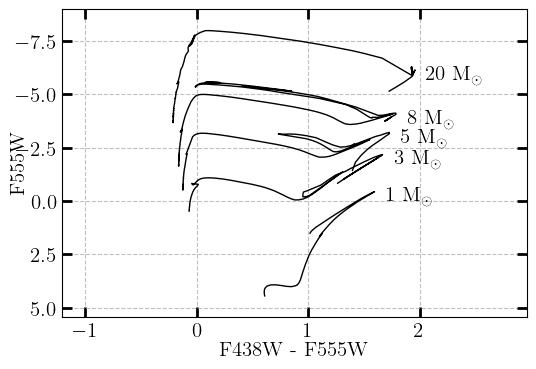

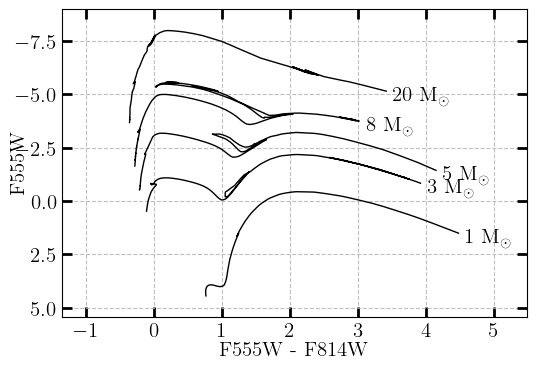

####################################################################
####################   2CXO J112017.1+130025   #############################


,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID,logAge,Star Age (Myr),Mass,Test Statistic,CSC RA,CSC Dec,2 Sig (arcsec),2 Sig (pix)
0,2CXO J112017.1+130025,CXO043,LMXB,4.0,NaN,170.071501,13.007211,295775.0,67348.0,62482.0,70482.0,2056.351326,7615.653061,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-8.904805,-0.394295,-9.773001,-0.409687,-10.600129,-0.290637,-10.657383,-0.241274,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2CXO J112017.1+130025-4.0-nan,8.36,229.086765,2.387,0.3138,170.071464,13.007172,0.425717,10.745008


Finding best-fit model(s)...
DONE


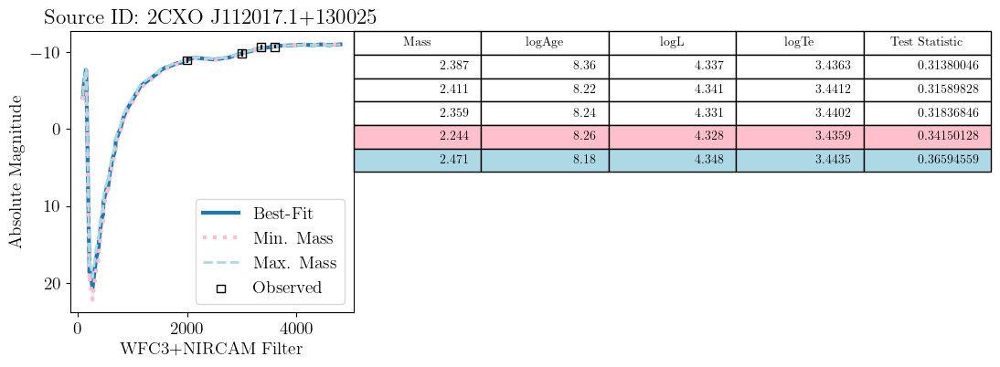

WFC3
Finding best-fit model(s)...
DONE
No best-fit model available for Source ID 2CXO J112017.1+130025.


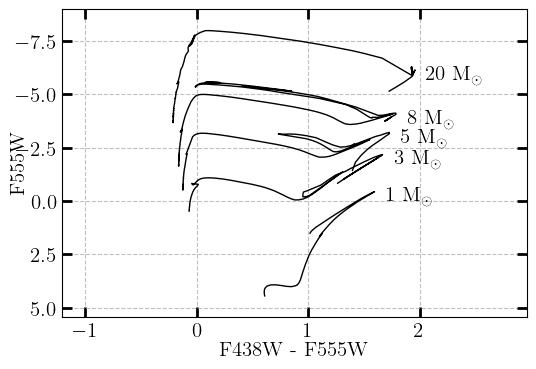

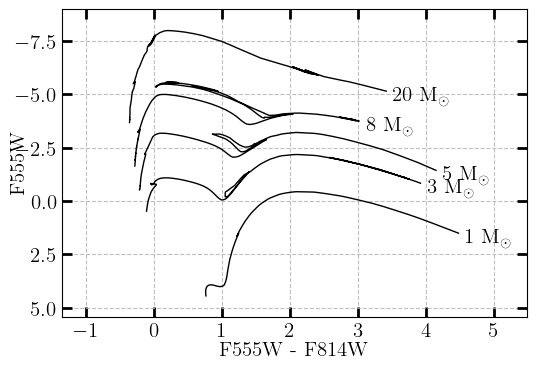

####################################################################
####################   2CXO J112016.7+125830   #############################


,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID,logAge,Star Age (Myr),Mass,Test Statistic,CSC RA,CSC Dec,2 Sig (arcsec),2 Sig (pix)
0,2CXO J112016.7+125830,CXO044,HMXB,1.0,1.0,170.069948,12.974921,79731.0,19653.0,17375.0,20801.0,2233.583519,3835.162196,3067.397243,4222.603316,5919.0,NaN,66663.0,16517.0,NaN,170.069932,12.974897,-9.329462,-0.576828,-9.106587,-1.638459,-8.940307,-2.754479,-9.38324,-1.64572,NaN,NaN,-6.160134,-0.295242,-6.319988,-0.412467,NaN,NaN,2CXO J112016.7+125830-1.0-1.0,7.1,12.589254,15.016,3.011261,170.069903,12.975028,0.542665,13.696748


Finding best-fit model(s)...
DONE


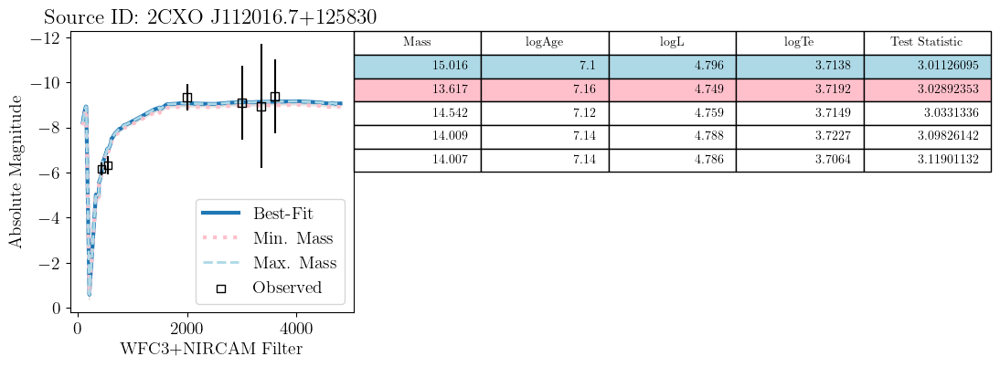

WFC3
Finding best-fit model(s)...
DONE


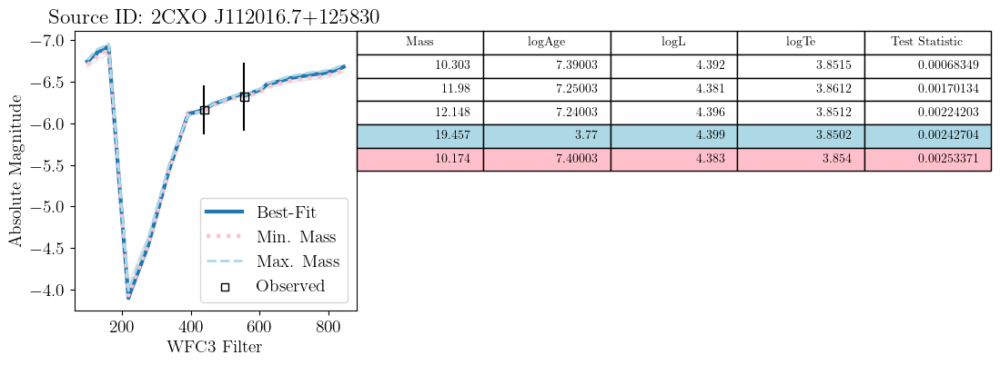

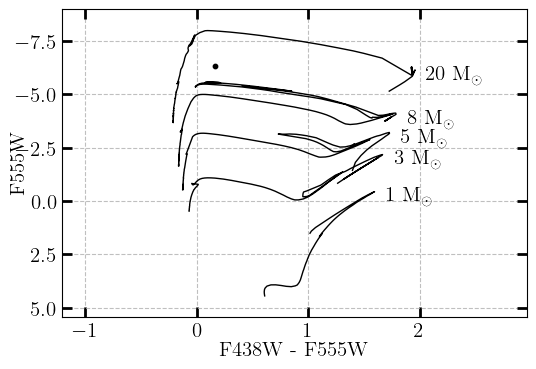

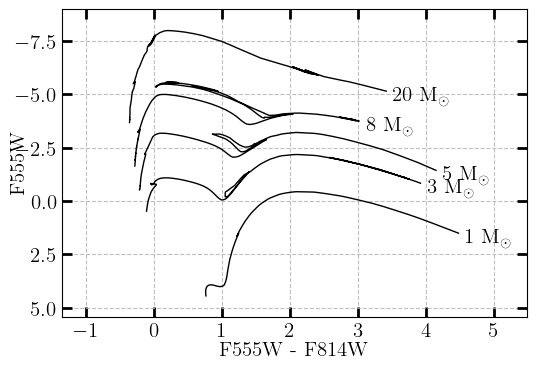

####################################################################
####################   2CXO J112016.4+130034   #############################


,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID,logAge,Star Age (Myr),Mass,Test Statistic,CSC RA,CSC Dec,2 Sig (arcsec),2 Sig (pix)
0,2CXO J112016.4+130034,CXO045,LMXB,14.0,NaN,170.068466,13.009603,307999.0,70260.0,65186.0,73526.0,2402.587396,7895.652752,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-9.016942,-0.347649,-9.154422,-0.744549,-9.512408,-0.740751,-9.740253,-0.545933,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2CXO J112016.4+130034-14.0-nan,8.52001,331.138746,2.648,0.016517,170.068581,13.009677,1.077406,27.193498


Finding best-fit model(s)...
DONE


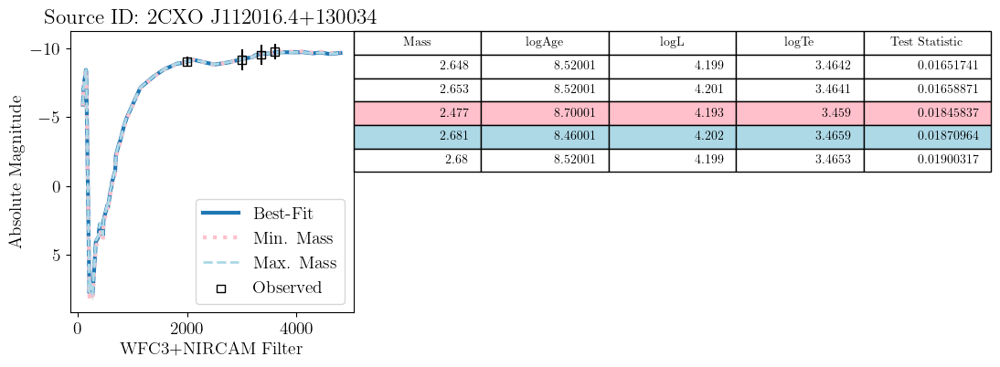

WFC3
Finding best-fit model(s)...
DONE
No best-fit model available for Source ID 2CXO J112016.4+130034.


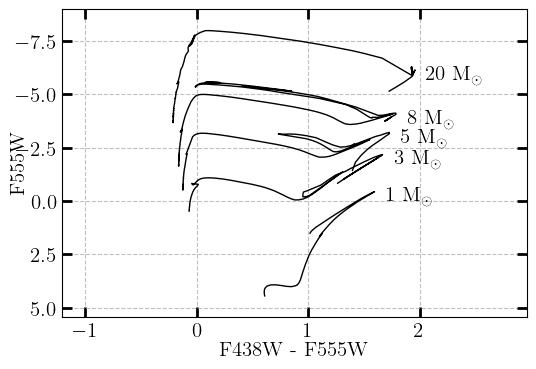

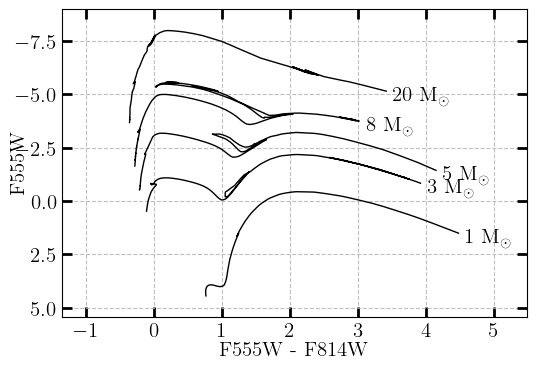

####################################################################
####################   2CXO J112019.5+125958   #############################


,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID,logAge,Star Age (Myr),Mass,Test Statistic,CSC RA,CSC Dec,2 Sig (arcsec),2 Sig (pix)
0,2CXO J112019.5+125958,CXO047,HMXB,9.0,1.0,170.081608,12.999365,244795.0,NaN,NaN,NaN,903.458791,6697.090415,2033.527984,6447.470681,24140.0,NaN,114984.0,43873.0,23724.0,170.08161,12.999382,-9.680275,-0.169765,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-6.536957,-0.100646,-6.74558,-0.111699,-7.376535,-0.160387,2CXO J112019.5+125958-9.0-1.0,7.1,12.589254,15.021,52.798197,170.081516,12.999423,0.832043,21.000582


Finding best-fit model(s)...
DONE


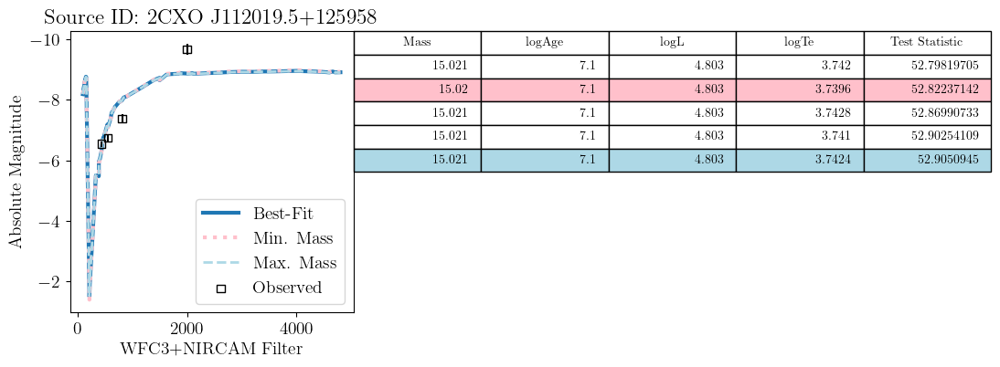

WFC3
Finding best-fit model(s)...
DONE


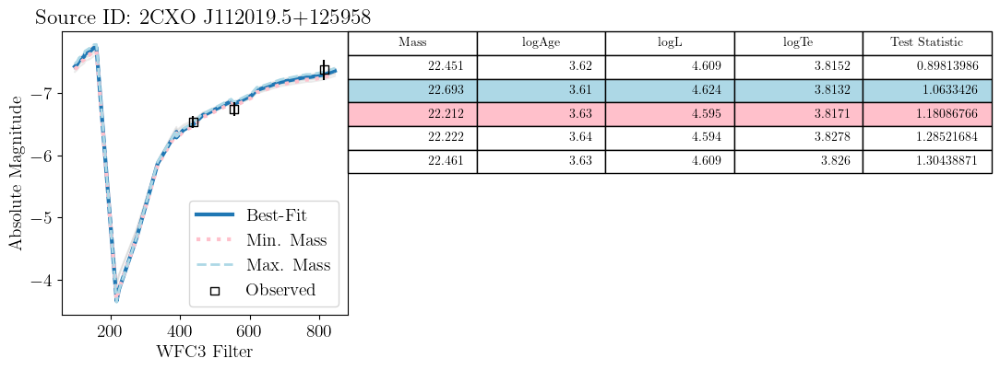

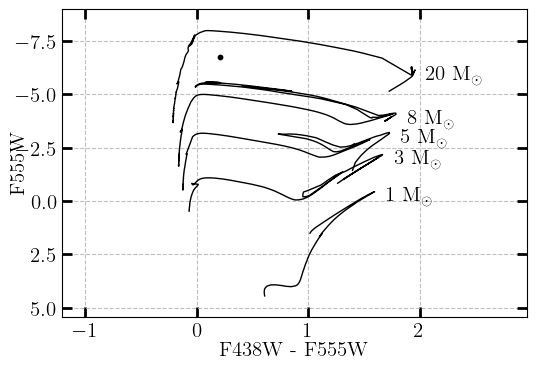

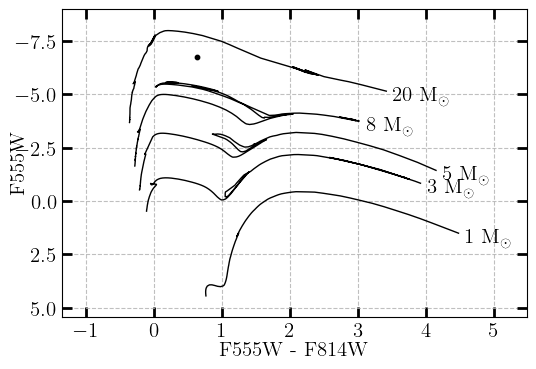

####################################################################
####################   2CXO J112017.5+125818   #############################


,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID,logAge,Star Age (Myr),Mass,Test Statistic,CSC RA,CSC Dec,2 Sig (arcsec),2 Sig (pix)
0,2CXO J112017.5+125818,CXO050,HMXB,2.0,NaN,170.072952,12.971857,66103.0,NaN,14385.0,NaN,1890.868291,3476.508951,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-10.175478,-0.129375,NaN,NaN,-10.663137,-0.306308,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2CXO J112017.5+125818-2.0-nan,7.44,27.542287,9.748,0.724587,170.072942,12.971853,0.246879,6.231177


Finding best-fit model(s)...
DONE


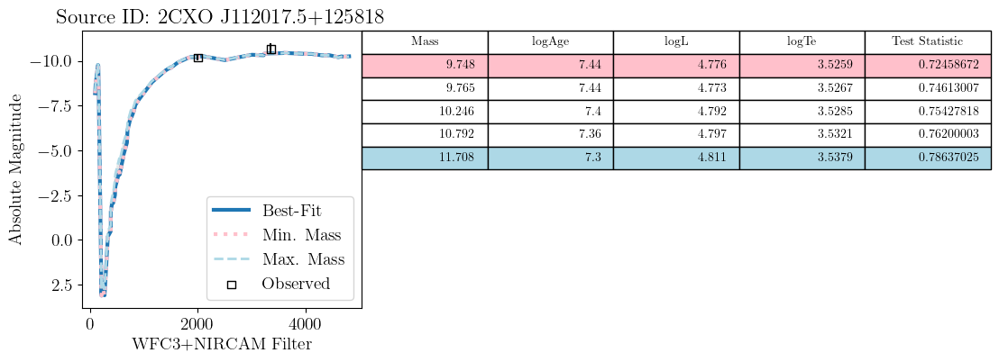

WFC3
Finding best-fit model(s)...
DONE
No best-fit model available for Source ID 2CXO J112017.5+125818.


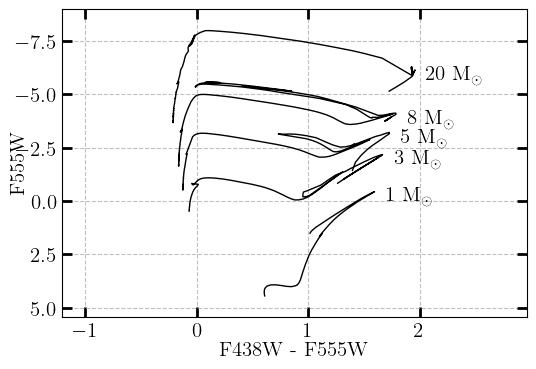

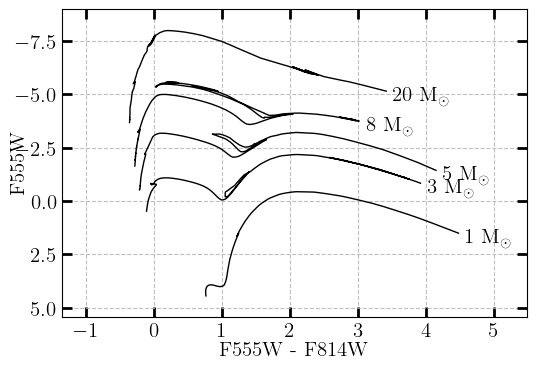

####################################################################
####################   2CXO J112019.0+130027   #############################


,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID,logAge,Star Age (Myr),Mass,Test Statistic,CSC RA,CSC Dec,2 Sig (arcsec),2 Sig (pix)
0,2CXO J112019.0+130027,CXO051,HMXB,1.0,1.0,170.079642,13.007369,296621.0,NaN,NaN,NaN,1127.776068,7634.081597,2208.073734,7173.101932,31056.0,NaN,NaN,NaN,NaN,170.079639,13.007368,-8.826183,-0.356661,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-5.555771,-0.10844,NaN,NaN,2CXO J112019.0+130027-1.0-1.0,7.3,19.952623,11.636,0.006294,170.079541,13.007541,1.011693,25.534906


Finding best-fit model(s)...
DONE


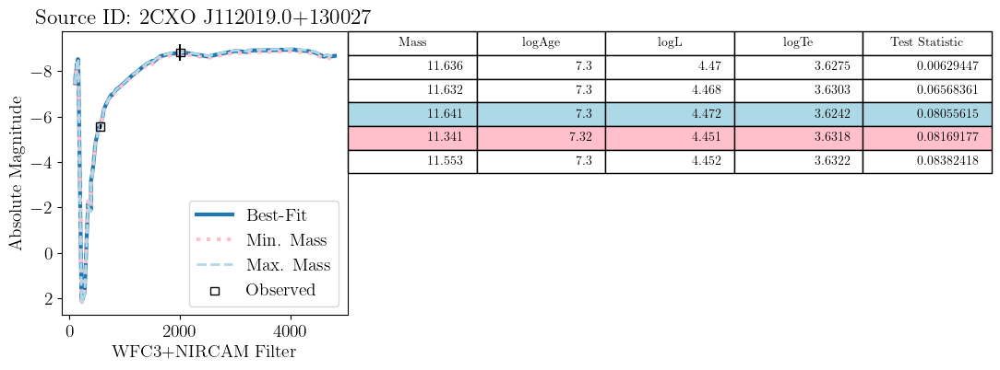

WFC3
Finding best-fit model(s)...
DONE
No best-fit model available for Source ID 2CXO J112019.0+130027.


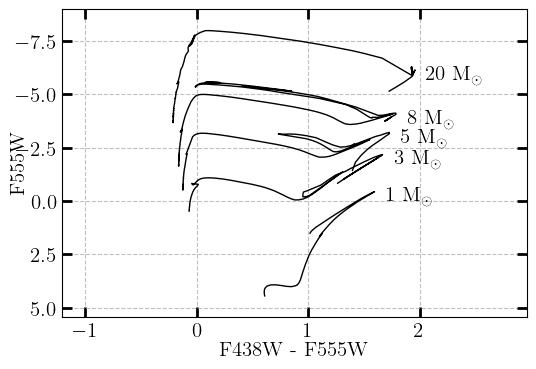

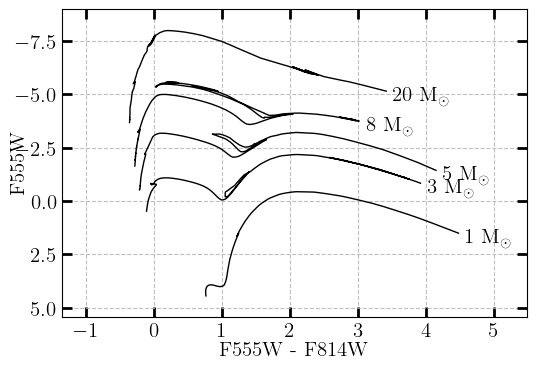

####################################################################
####################   2CXO J112011.8+125811   #############################


,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID,logAge,Star Age (Myr),Mass,Test Statistic,CSC RA,CSC Dec,2 Sig (arcsec),2 Sig (pix)
0,2CXO J112011.8+125811,CXO052,HMXB,2.0,NaN,170.049453,12.969873,58492.0,14498.0,12732.0,15351.0,4571.818194,3244.231991,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-10.427434,-0.136942,-10.339656,-0.359005,-10.527102,-0.426453,-10.621192,-0.356532,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2CXO J112011.8+125811-2.0-nan,6.88,7.585776,22.281,0.298114,170.049536,12.969903,0.387168,9.772034


Finding best-fit model(s)...
DONE


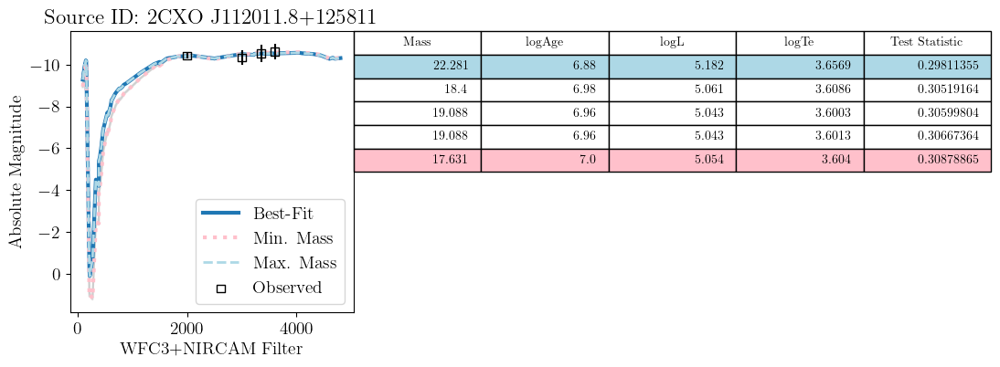

WFC3
Finding best-fit model(s)...
DONE
No best-fit model available for Source ID 2CXO J112011.8+125811.


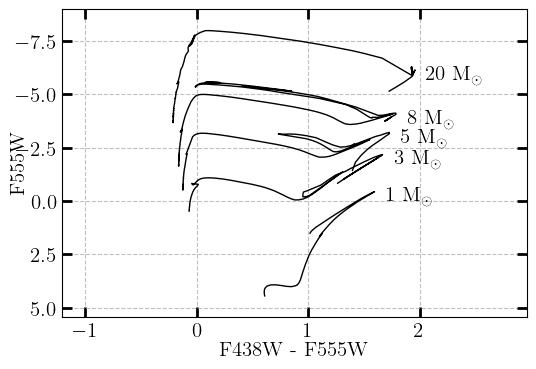

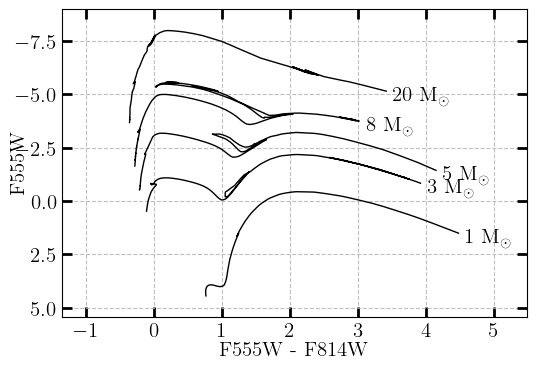

####################################################################
####################   2CXO J112019.7+130030   #############################


,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID,logAge,Star Age (Myr),Mass,Test Statistic,CSC RA,CSC Dec,2 Sig (arcsec),2 Sig (pix)
0,2CXO J112019.7+130030,CXO053,HMXB,5.0,NaN,170.082249,13.008335,301712.0,68734.0,63775.0,71929.0,830.290481,7747.19374,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-10.276548,-0.049398,-9.934312,-0.137687,-10.111382,-0.182441,-10.069338,-0.154806,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2CXO J112019.7+130030-5.0-nan,6.58,3.801894,31.51,6.836738,170.082346,13.008354,0.74784,18.875313


Finding best-fit model(s)...
DONE


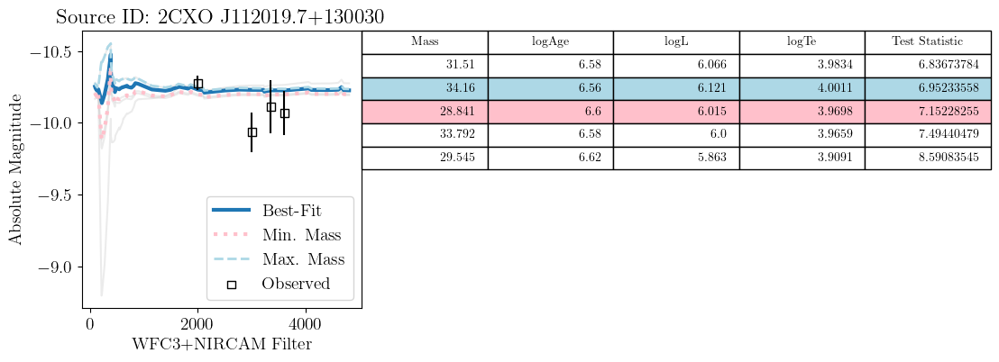

WFC3
Finding best-fit model(s)...
DONE
No best-fit model available for Source ID 2CXO J112019.7+130030.


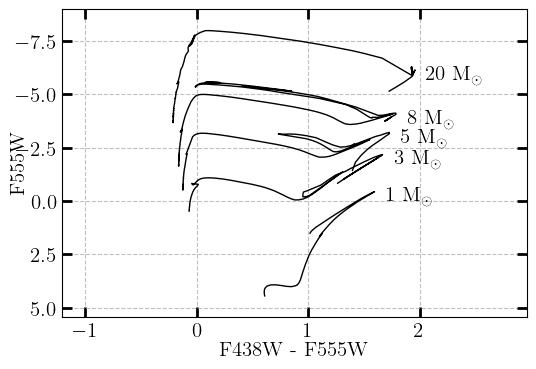

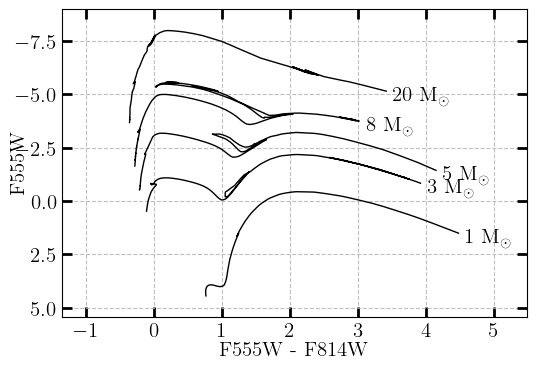

####################################################################
####################   2CXO J112013.0+125736   #############################


,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID,logAge,Star Age (Myr),Mass,Test Statistic,CSC RA,CSC Dec,2 Sig (arcsec),2 Sig (pix)
0,2CXO J112013.0+125736,CXO060,HMXB,4.0,1.0,170.054191,12.960178,26519.0,6497.0,5610.0,6873.0,4031.312552,2109.128343,4463.71084,2888.783967,1804.0,48203.0,NaN,NaN,1718.0,170.054162,12.960218,-9.902529,-0.154548,-9.273787,-0.743486,-9.818036,-0.670797,-9.812694,-0.606542,-5.529296,-0.067507,NaN,NaN,-4.666819,-0.496001,-6.341185,-0.40756,2CXO J112013.0+125736-4.0-1.0,6.88,7.585776,22.284,101.263216,170.054213,12.960156,0.387891,9.790275


Finding best-fit model(s)...
DONE


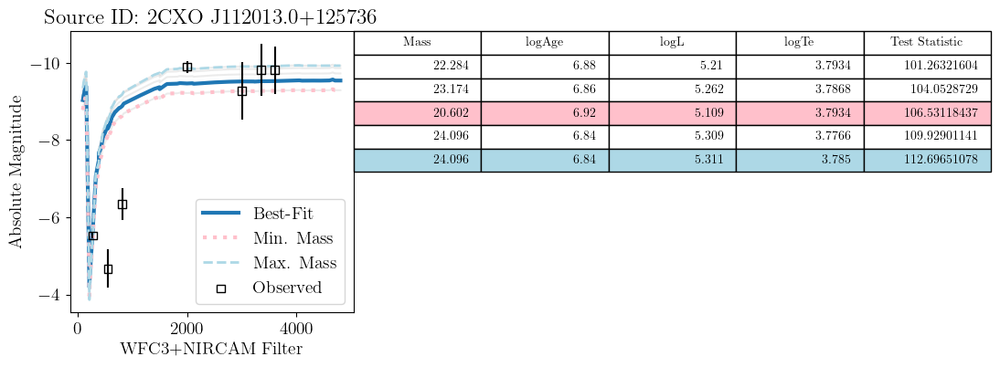

WFC3
Finding best-fit model(s)...
DONE


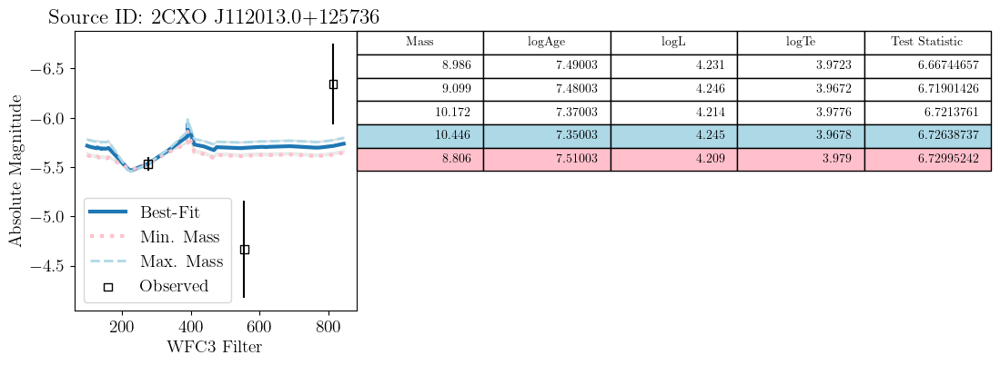

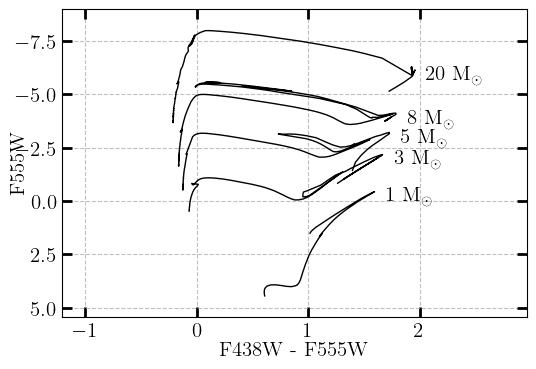

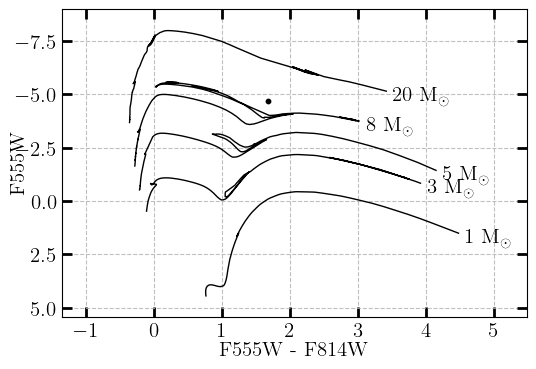

####################################################################


In [60]:
for cscid in M66_xrbs['CSC ID'].values:
    print(f"####################   {cscid}   #############################")
    # print("WFC3 + NIRCAM")
    display(Find(M66_xrbs, f'CSC ID == {cscid}'))
    FitSED(
        df=Find(M66_xrbs, f'CSC ID == {cscid}'),
        instrument='wfc3+nircam',
        idheader='CSC ID',
        plotSED=True,
        min_models=5
    )
    print("WFC3")
    FitSED(
        df=Find(M66_xrbs, f'CSC ID == {cscid}'),
        instrument='wfc3',
        idheader='CSC ID',
        min_models=5,
    )

    MakeCMD(
    sources=Find(M66_xrbs, f'CSC ID == {cscid}'),
    instrument='wfc3',
    xcolor=['F438W', 'F555W'],
    ycolor='F555W'
    )

    MakeCMD(
    sources=Find(M66_xrbs, f'CSC ID == {cscid}'),
    instrument='wfc3',
    xcolor=['F555W', 'F814W'],
    ycolor='F555W'
    )

    plt.show()
    print(f"####################################################################")

,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,Auxiliary ID,logAge,Star Age (Myr),Mass,Test Statistic,CSC RA,CSC Dec,2 Sig (arcsec),2 Sig (pix)
0,2CXO J112017.3+130019,CXO039,LMXB,7.0,NaN,170.072467,13.005485,285580.0,65085.0,NaN,NaN,1946.228482,7413.54611,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-8.738424,-0.45862,-9.792106,-0.41587,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2CXO J112017.3+130019-7.0-nan,8.24,173.780083,2.205,0.004421,170.072362,13.005469,0.780295,19.694482


(<Figure size 600x400 with 1 Axes>,
 <Axes: xlabel='F2000W - F3000M', ylabel='F2000W'>)

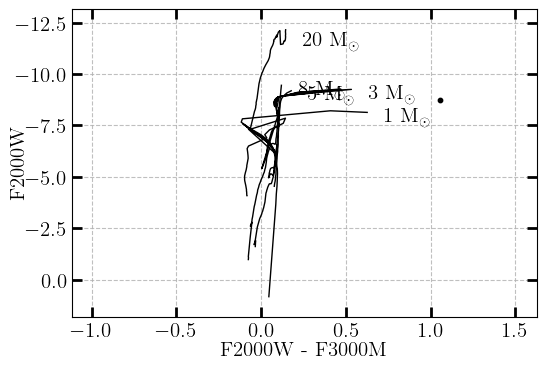

In [61]:
temp = Find(M66_xrbs, 'CSC ID = 2CXO J112017.3+130019 ')
display(temp)
MakeCMD(
    sources=temp,
    xcolor=['F2000W', 'F3000M'],
    ycolor='F2000W',
    instrument='nircam'
)

# Velocity

In [62]:
distances = remove_unnamed(pd.read_csv('/Users/undergradstudent/Downloads/temp.csv'))
r_eff = distances['Cluster Radius Eff (pc)'].values 
r_h = (4 / 3 * r_eff)
distances.insert(distances.columns.get_loc('Cluster Radius Eff (pc)') + 1,
                 'Cluster half-mass Radius (pc)', r_h)

In [68]:
import itertools

def CalcEjection(df, cluster_age, cluster_rad, cluster_mass, xrb_mass, dist, m_avg=0.4, N_int=20): 
    """
    Calculates the absolute minimum and approximate maximum velocities of XRBs ejected from 
    nearby clusters, given the age, radius, and mass of the cluster, mass of the XRB donor star, 
    and distance between the cluster and XRB.
    
    The maximum velocity is calculated based on which ejection mechanism minimizes
    the travel time of the XRB given the cluster parameters: natal kicks, or 
    single-binary (3-body) interactions. These are based on the maximum formation 
    time of a compact object, or the ejection time following a series of strong 
    interactions.
    
    Make sure the age of the cluster and age of the star are in the same units. 
    Distance between the XRB and cluster should be in [UNITS].
    
    PARAMETERS:
    -----------
    cluster_age [float]    :    Age of the parent cluster, in Myrs
    cluster_rad [float]    :    Radius of the parent cluster, in parsecs
    cluster_mass[float]    :    Mass of the parent cluster, in Msun
    xrb_mass    [float]    :    Mass of the XRB donor star, in Msun
    dist        [float]    :    Distance between the cluster and XRB in parsecs.
    m_avg       [float]    :    Average mass of the star in the cluster. Default is 
                                0.4 Msun, based on the Kroupa 2001 IMF. 
    N_int       [int]      :    Number of single-binary interactions required before
                                the XRB is ejected from the cluster. Default is 20.
    """
    
    df = df.copy()

    # UNITS
    Myr2sec = 3.1536e13 # Multiply Myr by Myr2sec to get time in secs
    sec2Myr = 1./Myr2sec
    pc2km = 3.086e13    # Multiply pc by pc2km to get km
    km2pc = 1./pc2km
    pc2au = 206265  # multiply pc by pc2au to get au
    au2pc = 1./pc2au
    
    # Gravitational constant
    # G = 6.6743e-11 # m^3 / km / s^2
    G_astro = 4.3009e-3 # in pc(km/s)^2/Msun or 1.908e5 in (km/s)^2*Rsun/Msun

    
    #############################################################
    #####   CALCULATION OF THE MAXIMUM VELOCITY OF THE XRB  #####
    #############################################################  
    
    # units km/s
    vmin = (dist*pc2km) / (cluster_age*Myr2sec)
    
    #############################################################
    ##### CALCULATION OF THE COMPACT OBJECT FORMATION TIME  #####
    #############################################################
    
    # Time of CO formation assumes CO formed from 8Msun star 
    # and takes and additional 1 Myr to complete metal burning
    
    # Calculate a mesh of stellar masses between 8-200Msun
    # Determine which gives the longest Tco without exceeding the
    # age of the cluster
    for m in range(200,7,-1):
        Tco_m = (1e10*(m)**(-2.5))/1.e6 + 1
        if Tco_m < cluster_age:
            #Tco = 57 # units Myrs
            Tco = (1e10*(m)**(-2.5))/1.e6 + 1
            Tmin_co = cluster_age - Tco # units Myrs
            Tco_mass = m
            # Tmin_co will be the travel time, and Tco is the max ejection time
            
    # Starting list of timings and their methodology
    timings = [round(Tmin_co,3)]
    timings_name = [f"Natal Kick ({Tco_mass} Msun)"]
    
    #print(timings) 
    
    #############################################################
    ##### CALCULATION OF THE SINGLE-BINARY INTERACTION TIME #####
    #############################################################
    

    # Calculating scape velocity of the cluster
    Mcl = cluster_mass # units Msun
    Rcl = cluster_rad  # units pc
    v_esc = np.sqrt(2*G_astro*Mcl/Rcl) # in km/s
    
    fbs = np.linspace(0.2,0.9,8)
    Ns = np.linspace(1,100,100)
    
    Tsbs = []
    for vals in itertools.product(fbs, Ns):
        Tsb = singlebinarytime(cluster_rad=cluster_rad,
                               cluster_mass=cluster_mass, 
                               xrb_mass=xrb_mass, fb=vals[0], 
                               m_avg=m_avg, N_int=vals[1])

        # Tsb is the ejection time of the XRB for this set of parameters
        Tsbs.append(Tsb)
        
        # Calculating the minimum travel time of the XRB, post-ejection, in Myrs
        Tmin_sb = cluster_age - Tsb
    
        #Adding to list of timings, the list of travel times given the ejection time
        timings.append(round(Tmin_sb,3))
        timings_name.append(f"Dynamical Interactions (fb={vals[0]}, N={int(vals[1])})")
    
    #############################################################
    #####   CALCULATION OF THE MAXIMUM VELOCITY OF THE XRB  #####
    #############################################################  
    
    # Selecting the minimum positive travel time as Tmin
    # Negative travel times are not allowed, as it implies the 
    # ejection time is longer than the age of the cluster
    Tmin = min(t for t in timings if t > 0) 
    best_model = timings_name[timings.index(Tmin)]

    # Pulling the ejection time of the best 
    try: Tsb_ej = Tsbs[timings.index(min([t for t in timings[1:] if t > 0])) - 1]
    except: pass; 
    

    # Choosing the 
    # Calculating vmax, assuming the maximum distance is 1000pc
    vmax = (1000.*pc2km)/(Tmin*Myr2sec)

    #####################
    ##### Printouts #####
    #####################

   #print("Cluster Age [Myr]:", cluster_age)
   #print("Cluster Mass [Msun]:", cluster_mass)
   #print("Cluster Effective Radius [pc]:", cluster_rad)
   #print("Cluster Half-mass Radius:", Rh)
   #print("Cluster Density [Msun/pc^3]:", dens)
   #print("Cluster Velocity Dispersion [km/s]:", np.sqrt(v_disp2))
    
    df['XRB Kick Ejection Time (Myr)'] = np.nan
    df["XRB Dynamical Ejection Time (Myr)"] = np.nan
    df["Min. XRB Dynamical Interaction Time (Myr)"] = np.nan
    df['Max. Velocity method'] = np.nan
    df['Minimum travel time (Myr)'] = np.nan
    df['Cluster Escape Velocity (km/s)'] = np.nan
    df['Minimum XRB Velocity (km/s)'] = np.nan
    df['Maximum XRB Velocity (km/s)'] = np.nan
    
    try:
        print("####### SIMULATION RESULTS ########\n")
        print("XRB Kick Ejection Time:", round(Tco, 3), "Myr")
        df['XRB Kick Ejection Time (Myr)'] = Tco
        try:
            print("XRB Dynamical Ejection Time:", round(Tsb_ej,3), "Myr")
            df["XRB Dynamical Ejection Time (Myr)"] = Tsb_ej
        except: 
            print("Min. XRB Dynamical Interaction Time:", round(min(Tsbs),3), "Myr")
            df["Min. XRB Dynamical Interaction Time (Myr)"] = min(Tsbs)
        print("Max. Velocity Method:", best_model)
        df['Max. Velocity method'] = best_model
        print("Minimum travel time:", round(Tmin,3),"Myr")
        df['Minimum travel time (Myr)'] = Tmin.min()
        print("Cluster Escape Velocity:", round(v_esc,3), "km/s")
        df['Cluster Escape Velocity (km/s)'] = v_esc
        print("Minimum XRB Velocity:", round(vmin,3), "km/s")
        df['Minimum XRB Velocity (km/s)'] = vmin
        print("Maximum XRB Velocity:", round(vmax,3), "km/s")
        df['Maximum XRB Velocity (km/s)'] = vmax
        print("\n-----------------------------------\n")
    except: 
        print("Invalid ejection times: Tmin is negative. Check parameters of XRB-cluster pair.")
        print("Minimum XRB Velocity:", vmin)
        df['Minimum XRB Velocity (km/s)'] = vmin
        print("Escape XRB Velocity:", v_esc)
        df['Cluster Escape Velocity (km/s)'] = v_esc
        print("\n-----------------------------------\n")
        
    # df['XRB Kick Ejection Time (Myr)'] = Tco
    # if Tsb_ej: df["XRB Dynamical Ejection Time (Myr)"] = Tsb_ej
    # if Tsbs: df["Min. XRB Dynamical Interaction Time (Myr)"] = Tsbs
    # df['Max. Velocity method'] = best_model
    # df['Minimum travel time (Myr)'] = Tmin
    # df['Cluster Escape Velocity (km/s)'] = v_esc
    # df['Minimum XRB Velocity (km/s)'] = vmin
    # df['Maximum XRB Velocity'] = vmax

    return df
        
#######################

def singlebinarytime(cluster_mass, cluster_rad, xrb_mass, fb=0.5, m_avg=0.4, N_int=20):
    
    """
    Calculating the single-binary interaction time from Herrera-Urquiet et al. (2025).
    Properties of the cluster used in the calculation come from the Plummer cluster model
    (Plummer 1911; Aarseth et al. 1974). 
    
    Returns the total ejection time in Myrs. 
    
    cluster_mass    [float]    :    Mass of the cluster in Msun. 
    cluster_rad     [float]    :    Effective radius of the cluster in pc. 
    xrb_mass        [float]    :    Mass of the XRB in Msun. 
    fb              [float]    :    Fraction of stars in a cluster that are part
                                    of a binary. Can only take values between 0-0.99.
    m_avg           [float]    :    Average mass of stars in the cluster in Msun. 
                                    Default is 0.4, consistent with the Kroupa IMF. 
    N_int           [int]      :    Number of single-binary interactions before the 
                                    XRB is ejected from the cluster. Default is 20. 
    
    """
    
    # UNITS
    Myr2sec = 3.1536e13 # Multiply Myr by Myr2sec to get time in secs
    sec2Myr = 1./Myr2sec
    pc2km = 3.086e13    # Multiply pc by pc2km to get km
    km2pc = 1./pc2km
    pc2au = 206265  # multiply pc by pc2au to get au
    au2pc = 1./pc2au
    au2km = 1.496e8
    km2au = 1./au2km
    G_astro = 4.3009e-3
    
    # Calculating scape velocity of the cluster
    Mcl = cluster_mass # units Msun
    Rcl = cluster_rad  # units pc

    # Core radius is 1/2 half-mass radius, which is (4/3)*Reff
    R_core = 0.5 * (4./3.) * Rcl
    rP = R_core/0.6455 # length-scale of the Plummer model
    
    #print(f"rP: {rP}, R_core: {R_core}, Rcluster={Rcl}")
    # Core density from Plummer model (see Wilkinson et al. 2003)
    D_core = (3*Mcl)/(4*np.pi*rP**3) * (1 + (R_core/rP)**2)**(-5./2.)
    n_core = D_core/m_avg # number density, units pc^-3 
    
    #print(f"Mass: {Mcl}, Density: {D_core}, n: {n_core}")
    # Calculating escape velocity and velocity dispersion
    v_esc = np.sqrt(2*G_astro*Mcl/Rcl) # in km/s
    # Velocity dispersion of the cluster squared, from virial theorem
    # e.g. https://publish.obsidian.md/astrowiki/G.+Galaxies/Velocity+Dispersion#:~:text=Galaxy%20Velocity%20Dispersion,Derivation
    v_disp = np.sqrt((2./3.)*G_astro*Mcl/Rcl) # in (km/s)^2
 
    # Semi-major axis calculation, from Equation 16 in 
    # Rando Forastier, B., Mar´ın Pina, D., Gieles, M., Portegies185
    # Zwart, S., & Antonini, F. 2025, A&A, 697, A118,186
    # doi: 10.1051/0004-6361/202450890
    # Results in units pc
    # a_ej = G_astro * (Mco*Mdonor*Ms3)/(Msb*Mxrb) * 1./(v_esc)**2 * 0.2*(1 - np.exp(-7.0*Ms3/Mxrb))
    
    # Equation above is obsolete now. Use this single value below
    a_ej_au = 168 # Adopted from Herrera-Urquiesta et al. (2025)
    
    time = 3.4e7 * (1-fb)**(-1) * fb**(-1) * (1./R_core)**3 * ((1e3)/n_core)**2 * (v_disp/5.) * (0.5/m_avg) * (1./(a_ej_au))
    #print("Time [Myr]:", time/1e6)
    #print("Ejection Time [Myr]:", N_int*time/1e6)
    return N_int*time/1e6


In [87]:
for i in range(len(velocity)):
    data = CalcEjection(
        df=velocity.iloc[[i]],
        cluster_age=velocity['Star Age (Myr)'].values[i],
        cluster_rad=velocity['Cluster half-mass Radius (km)'].values[i],
        cluster_mass=velocity['Cluster Mass (M_sun)'].values[i],
        xrb_mass=velocity['Mass'],
        dist=velocity['Cluster Separation (pc)'],
    )
    data = pd.concat([velocity, data])

data

####### SIMULATION RESULTS ########

XRB Kick Ejection Time: 4.544 Myr
Min. XRB Dynamical Interaction Time: 2.290158678798831e+34 Myr
Max. Velocity Method: Natal Kick (24 Msun)
Minimum travel time: 0.242 Myr
Cluster Escape Velocity: 0.0 km/s
Minimum XRB Velocity: 0       165.304
1       156.570
2       179.599
3       190.189
4       166.539
         ...   
3613    172.348
3614    173.370
3615    185.109
3616    194.440
3617    190.650
Name: Cluster Separation (pc), Length: 3618, dtype: float64 km/s
Maximum XRB Velocity: 4043.654 km/s

-----------------------------------

####### SIMULATION RESULTS ########

XRB Kick Ejection Time: 4.544 Myr
Min. XRB Dynamical Interaction Time: 1.908218059867283e+32 Myr
Max. Velocity Method: Natal Kick (24 Msun)
Minimum travel time: 0.242 Myr
Cluster Escape Velocity: 0.0 km/s
Minimum XRB Velocity: 0       165.304
1       156.570
2       179.599
3       190.189
4       166.539
         ...   
3613    172.348
3614    173.370
3615    185.109
3616    194.4

,CSC RA,CSC Dec,Auxiliary ID,Cluster ID,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,logAge,Star Age (Myr),Star Age (s),Mass,Test Statistic,2 Sig (arcsec),2 Sig (km),2 Sig (pix),Cluster RA,Cluster Dec,Cluster Separation (arcsecs),Cluster Separation (pc),Cluster Separation (km),Cluster CI,Cluster Age (Myr),Cluster Age Err (Myr),Cluster Mass (M_sun),Cluster Mass Err (M_sun),Cluster EBV,Cluster EBV Err,Cluster Test Statistic,Cluster FWHM,Cluster Radius Eff (pix),Cluster Radius Eff (arcsec),Cluster Radius Eff (pc),XRB-Parent Test Statistic,Min Cluster Velocity (km/s),Cluster half-mass Radius (km),XRB escape velocity (km/s),LogLx,XRB Kick Ejection Time (Myr),XRB Dynamical Ejection Time (Myr),Min. XRB Dynamical Interaction Time (Myr),Max. Velocity method,Minimum travel time (Myr),Cluster Escape Velocity (km/s),Minimum XRB Velocity (km/s),Maximum XRB Velocity (km/s)
0,170.062259,12.992633,2CXO J112014.9+125933-3.0-2.0,6740,2CXO J112014.9+125933,CXO003,HMXB,3.0,2.0,170.062307,12.992623,194908.0,45185.0,nan,nan,3105.251503,5907.752641,3743.843919,5833.507868,19247.0,130956.0,nan,36055.0,nan,170.062292,12.992626,-12.159049,-0.904646,-13.902257,-0.287522,nan,nan,nan,nan,-2.974469,-1.372681,-7.711479,-0.896442,-8.481385,-0.973168,nan,nan,6.68,4.786301,151044170014808.8125,31.619,36.436988,0.235415,329792523495880.9375,5.941826,170.061849,12.987713,17.769856,808.528449,2.494858e+16,1.613909,5.0,153.0,32159.451166,67739.414328,0.80,0.50,23.386633,0.96,1.4208,0.056832,3.113757,0.241329,165.174075,1.281073e+14,8.162781,38.566181,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,170.062259,12.992633,2CXO J112014.9+125933-3.0-2.0,6788,2CXO J112014.9+125933,CXO003,HMXB,3.0,2.0,170.062307,12.992623,194908.0,45185.0,nan,nan,3105.251503,5907.752641,3743.843919,5833.507868,19247.0,130956.0,nan,36055.0,nan,170.062292,12.992626,-12.159049,-0.904646,-13.902257,-0.287522,nan,nan,nan,nan,-2.974469,-1.372681,-7.711479,-0.896442,-8.481385,-0.973168,nan,nan,6.68,4.786301,151044170014808.8125,31.619,36.436988,0.235415,329792523495880.9375,5.941826,170.061836,12.987976,16.830950,765.808229,2.363037e+16,1.423196,890.0,120.0,174363.656114,17070.864641,0.00,0.01,3.086535,0.39,0.5772,0.023088,1.264964,5000748.752251,156.446772,5.204361e+13,29.820513,38.566181,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,170.062259,12.992633,2CXO J112014.9+125933-3.0-2.0,6969,2CXO J112014.9+125933,CXO003,HMXB,3.0,2.0,170.062307,12.992623,194908.0,45185.0,nan,nan,3105.251503,5907.752641,3743.843919,5833.507868,19247.0,130956.0,nan,36055.0,nan,170.062292,12.992626,-12.159049,-0.904646,-13.902257,-0.287522,nan,nan,nan,nan,-2.974469,-1.372681,-7.711479,-0.896442,-8.481385,-0.973168,nan,nan,6.68,4.786301,151044170014808.8125,31.619,36.436988,0.235415,329792523495880.9375,5.941826,170.058290,12.988918,19.306475,878.444618,2.710597e+16,1.750547,500.0,77.0,69972.213290,11389.178992,0.10,0.09,1.464285,1.91,2.8268,0.113072,6.195079,2797750.365946,179.457232,2.548802e+14,8.536219,38.566181,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,170.062259,12.992633,2CXO J112014.9+125933-3.0-2.0,7009,2CXO J112014.9+125933,CXO003,HMXB,3.0,2.0,170.062307,12.992623,194908.0,45185.0,nan,nan,3105.251503,5907.752641,3743.843919,5833.507868,19247.0,130956.0,nan,36055.0,nan,170.062292,12.992626,-12.159049,-0.904646,-13.902257,-0.287522,nan,nan,nan,nan,-2.974469,-1.372681,-7.711479,-0.896442,-8.481385,-0.973168,nan,nan,6.68,4.786301,151044170014808.8125,31.619,36.436988,0.235415,329792523495880.9375,5.941826,170.057680,12.989119,20.444914,930.243609,2.870432e+16,1.763707,158.0,48.0,206060.938059,14694.145980,0.01,0.09,0.208602,1.91,2.8268,0.113072,6.195079,454936.365505,190.039235,2.548802e+14,14.648750,38.566181,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,170.062259,12.992633,2CXO J112014.9+125933-

In [95]:
data

,CSC RA,CSC Dec,Auxiliary ID,Cluster ID,CSC ID,ID,Class,JWST ID,HST ID,JWST RA,JWST Dec,F2000W ID,F3000M ID,F3350M ID,F3600M ID,JWST X,JWST Y,HST X,HST Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,HST RA,HST Dec,F2000W,F2000W Err,F3000M,F3000M Err,F3350M,F3350M Err,F3600M,F3600M Err,F275W,F275W Err,F438W,F438W Err,F555W,F555W Err,F814W,F814W Err,logAge,Star Age (Myr),Star Age (s),Mass,Test Statistic,2 Sig (arcsec),2 Sig (km),2 Sig (pix),Cluster RA,Cluster Dec,Cluster Separation (arcsecs),Cluster Separation (pc),Cluster Separation (km),Cluster CI,Cluster Age (Myr),Cluster Age Err (Myr),Cluster Mass (M_sun),Cluster Mass Err (M_sun),Cluster EBV,Cluster EBV Err,Cluster Test Statistic,Cluster FWHM,Cluster Radius Eff (pix),Cluster Radius Eff (arcsec),Cluster Radius Eff (pc),XRB-Parent Test Statistic,Min Cluster Velocity (km/s),Cluster half-mass Radius (km),XRB escape velocity (km/s),LogLx,XRB Kick Ejection Time (Myr),XRB Dynamical Ejection Time (Myr),Min. XRB Dynamical Interaction Time (Myr),Max. Velocity method,Minimum travel time (Myr),Cluster Escape Velocity (km/s),Minimum XRB Velocity (km/s),Maximum XRB Velocity (km/s)
0,170.062259,12.992633,2CXO J112014.9+125933-3.0-2.0,6740,2CXO J112014.9+125933,CXO003,HMXB,3.0,2.0,170.062307,12.992623,194908.0,45185.0,nan,nan,3105.251503,5907.752641,3743.843919,5833.507868,19247.0,130956.0,nan,36055.0,nan,170.062292,12.992626,-12.159049,-0.904646,-13.902257,-0.287522,nan,nan,nan,nan,-2.974469,-1.372681,-7.711479,-0.896442,-8.481385,-0.973168,nan,nan,6.68,4.786301,151044170014808.8125,31.619,36.436988,0.235415,329792523495880.9375,5.941826,170.061849,12.987713,17.769856,808.528449,2.494858e+16,1.613909,5.0,153.0,32159.451166,67739.414328,0.80,0.50,23.386633,0.96,1.4208,0.056832,3.113757,0.241329,165.174075,1.281073e+14,8.162781,38.566181,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,170.062259,12.992633,2CXO J112014.9+125933-3.0-2.0,6788,2CXO J112014.9+125933,CXO003,HMXB,3.0,2.0,170.062307,12.992623,194908.0,45185.0,nan,nan,3105.251503,5907.752641,3743.843919,5833.507868,19247.0,130956.0,nan,36055.0,nan,170.062292,12.992626,-12.159049,-0.904646,-13.902257,-0.287522,nan,nan,nan,nan,-2.974469,-1.372681,-7.711479,-0.896442,-8.481385,-0.973168,nan,nan,6.68,4.786301,151044170014808.8125,31.619,36.436988,0.235415,329792523495880.9375,5.941826,170.061836,12.987976,16.830950,765.808229,2.363037e+16,1.423196,890.0,120.0,174363.656114,17070.864641,0.00,0.01,3.086535,0.39,0.5772,0.023088,1.264964,5000748.752251,156.446772,5.204361e+13,29.820513,38.566181,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,170.062259,12.992633,2CXO J112014.9+125933-3.0-2.0,6969,2CXO J112014.9+125933,CXO003,HMXB,3.0,2.0,170.062307,12.992623,194908.0,45185.0,nan,nan,3105.251503,5907.752641,3743.843919,5833.507868,19247.0,130956.0,nan,36055.0,nan,170.062292,12.992626,-12.159049,-0.904646,-13.902257,-0.287522,nan,nan,nan,nan,-2.974469,-1.372681,-7.711479,-0.896442,-8.481385,-0.973168,nan,nan,6.68,4.786301,151044170014808.8125,31.619,36.436988,0.235415,329792523495880.9375,5.941826,170.058290,12.988918,19.306475,878.444618,2.710597e+16,1.750547,500.0,77.0,69972.213290,11389.178992,0.10,0.09,1.464285,1.91,2.8268,0.113072,6.195079,2797750.365946,179.457232,2.548802e+14,8.536219,38.566181,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,170.062259,12.992633,2CXO J112014.9+125933-3.0-2.0,7009,2CXO J112014.9+125933,CXO003,HMXB,3.0,2.0,170.062307,12.992623,194908.0,45185.0,nan,nan,3105.251503,5907.752641,3743.843919,5833.507868,19247.0,130956.0,nan,36055.0,nan,170.062292,12.992626,-12.159049,-0.904646,-13.902257,-0.287522,nan,nan,nan,nan,-2.974469,-1.372681,-7.711479,-0.896442,-8.481385,-0.973168,nan,nan,6.68,4.786301,151044170014808.8125,31.619,36.436988,0.235415,329792523495880.9375,5.941826,170.057680,12.989119,20.444914,930.243609,2.870432e+16,1.763707,158.0,48.0,206060.938059,14694.145980,0.01,0.09,0.208602,1.91,2.8268,0.113072,6.195079,454936.365505,190.039235,2.548802e+14,14.648750,38.566181,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,170.062259,12.992633,2CXO J112014.9+125933-

ValueError: Could not interpret value `Minimum XRB Velocity (km/s)` for `x`. An entry with this name does not appear in `data`.

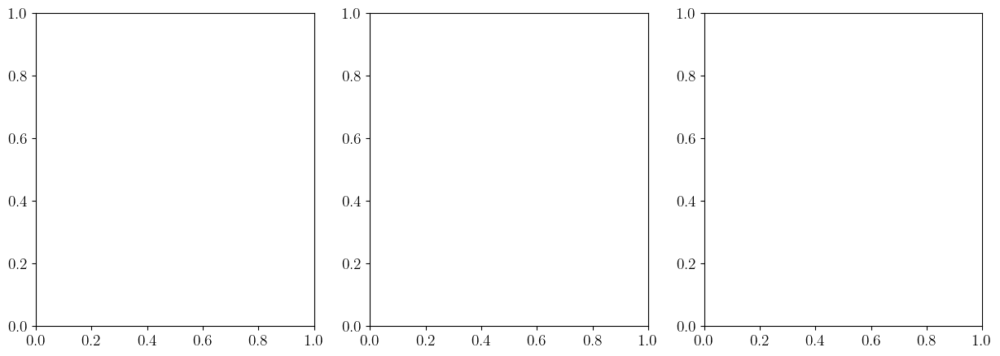

In [ ]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))

# for i in range(3):
sns.kdeplot(
    data=velocity,
    x='Minimum XRB Velocity (km/s)',
    fill=True,
    ax=ax[0],
    alpha=0.35,
    hue='Class',
    palette='bright'
)

sns.kdeplot(
    data=velocity,
    x='Maximum XRB Velocity (km/s)',
    fill=True,
    ax=ax[1],
    alpha=0.35,
    hue='Class',
    palette='bright'
)

sns.kdeplot(
    data=velocity,
    x='Cluster Escape Velocity (km/s)',
    fill=True,
    ax=ax[2],
    alpha=0.35,
    hue='Class',
    palette='bright'
)

ax[2].set_xlabel('XRB Escape Velocity (km/s)')
# plt.savefig('/Users/undergradstudent/Downloads/velocity_kde.png')

<Axes: xlabel='Cluster Escape Velocity (km/s)', ylabel='Count'>

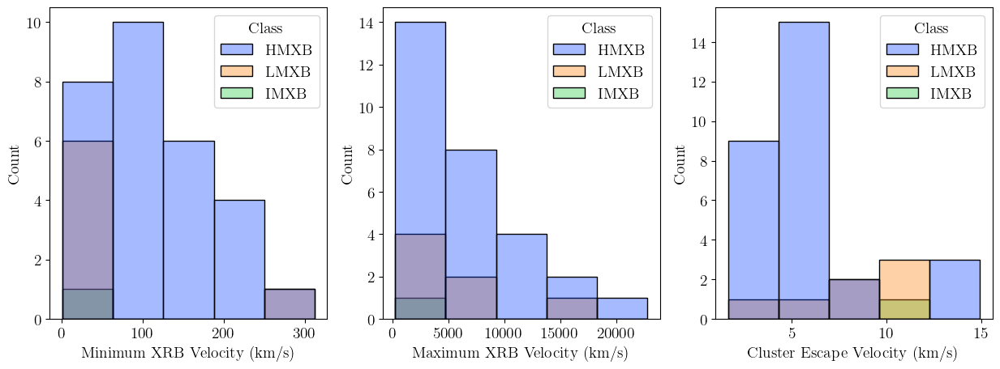

In [ ]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))

bins = 5
# for i in range(3):
sns.histplot(
    data=velocity,
    x='Minimum XRB Velocity (km/s)',
    ax=ax[0],
    fill=True,
    bins=bins,
    alpha=0.35,
    hue='Class',
    palette='bright'
)

sns.histplot(
    data=velocity,
    x='Maximum XRB Velocity (km/s)',
    ax=ax[1],
    fill=True,
    bins=bins,
    alpha=0.35,
    hue='Class',
    palette='bright'
)
sns.histplot(
    data=velocity,
    x='Cluster Escape Velocity (km/s)',
    ax=ax[2],
    fill=True,
    bins=bins,
    alpha=0.35,
    hue='Class',
    palette='bright'
)
# plt.savefig('/Users/undergradstudent/Downloads/velocity_hist.png')

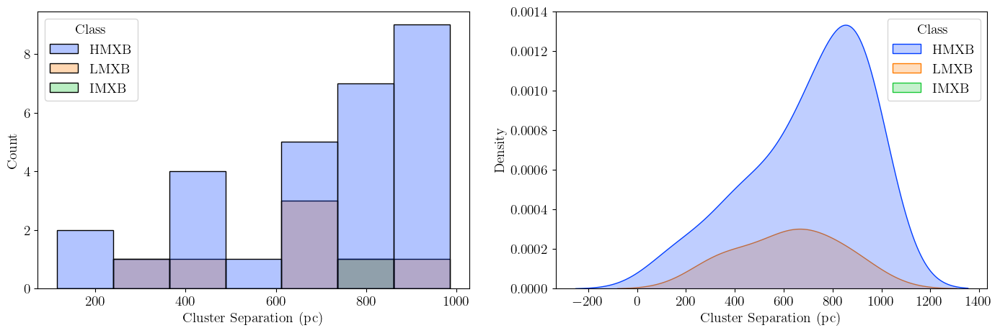

In [ ]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(17, 5))
sns.histplot(
    data=velocity,
    x='Cluster Separation (pc)',
    hue='Class',
    palette='bright',
    ax=ax[0],
    alpha=0.3
)
sns.kdeplot(
    data=velocity,
    x='Cluster Separation (pc)',
    hue='Class',
    palette='bright',
    ax=ax[1],
    fill=True
)
plt.show()

# Make the M/R vs Velocity plot

In [138]:
radius = distances['Cluster half-mass Radius (pc)'].values * u.pc
radius = radius.to(u.km)
mass = distances['Mass'].values
ratio = mass / radius
ratio

<Quantity [2.46816461e-13, 6.07548211e-13, 1.24054347e-13, ...,
           1.07735461e-13, 1.26507549e-13, 6.67959859e-14] 1 / km>

$x = \sqrt{2G y} \implies x^2 / y = \sqrt{2G}$

In [99]:
x = np.linspace(0, 100)
y = x ** 2 / np.sqrt(2 * G)
y

<Quantity [0.00000000e+00, 3.60487309e+05, 1.44194924e+06, 3.24438578e+06,
           5.76779695e+06, 9.01218273e+06, 1.29775431e+07, 1.76638782e+07,
           2.30711878e+07, 2.91994721e+07, 3.60487309e+07, 4.36189644e+07,
           5.19101725e+07, 6.09223553e+07, 7.06555126e+07, 8.11096446e+07,
           9.22847512e+07, 1.04180832e+08, 1.16797888e+08, 1.30135919e+08,
           1.44194924e+08, 1.58974903e+08, 1.74475858e+08, 1.90697787e+08,
           2.07640690e+08, 2.25304568e+08, 2.43689421e+08, 2.62795248e+08,
           2.82622050e+08, 3.03169827e+08, 3.24438578e+08, 3.46428304e+08,
           3.69139005e+08, 3.92570680e+08, 4.16723330e+08, 4.41596954e+08,
           4.67191553e+08, 4.93507126e+08, 5.20543675e+08, 5.48301197e+08,
           5.76779695e+08, 6.05979167e+08, 6.35899614e+08, 6.66541035e+08,
           6.97903431e+08, 7.29986801e+08, 7.62791146e+08, 7.96316466e+08,
           8.30562761e+08, 8.65530030e+08] s kg(1/2) / m(3/2)>

(0.0, 567186156.048852)

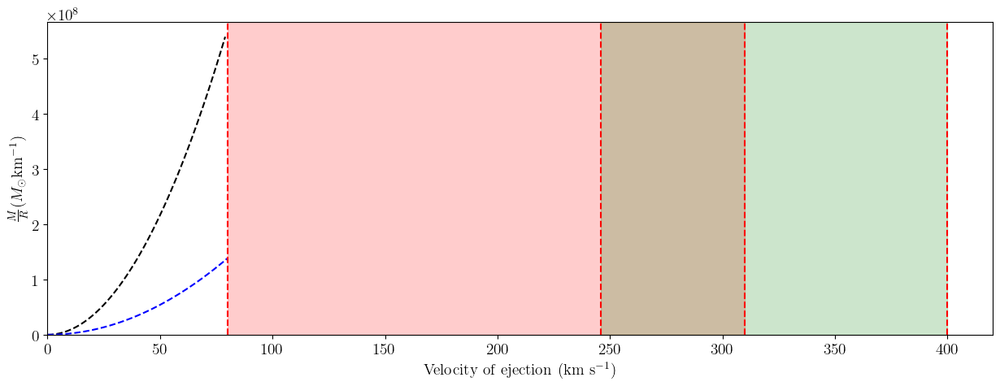

In [140]:
from astropy.constants import G

fig, ax = plt.subplots(figsize=(15, 5))
ax.set_xlabel('Velocity of ejection (km s$^{-1}$)')
ax.set_ylabel(r'$\frac{M}{R} (M_{\odot}$km$^{-1})$')

x = np.arange(0, 80, 1)
y = x ** 2 / np.sqrt(2 * G)
plt.plot(x, y, ls='--', c='k')

x = np.arange(0, 41, 1)
y = x ** 2 / np.sqrt(2 * G)
x = 2 * x
plt.plot(x, y, ls='--', c='b')

# ax.text(60, 300, r'$v_{esc}$', rotation=70)
# ax.text(145, 300, r'$2$ $v_{esc}$', rotation=70)

# BHXB ejection velocities
plt.axvline(x=80, color='r', linestyle='--')
plt.axvline(x=310, color='r', linestyle='--')
ax.axvspan(80, 310, color='red', alpha=0.2)

# NSXB ejection velocities
plt.axvline(x=246, color='r', linestyle='--')
plt.axvline(x=400, color='r', linestyle='--')
ax.axvspan(246, 400, color='green', alpha=0.2)

ax.set_xlim(left=0)
ax.set_ylim(bottom=0)
# plt.xlim(0, 500)
# plt.ylim(0, 500)